In [1]:
import pandas as pd
import scipy
import numpy as np
import scipy.sparse as sp
import scipy.io as spio

from scipy.stats import pearsonr

import operator
import matplotlib.pyplot as plt

import matplotlib.cm as cm
import matplotlib.colors as colors

import matplotlib as mpl
from matplotlib.text import TextPath
from matplotlib.patches import PathPatch, Rectangle
from matplotlib.font_manager import FontProperties
from matplotlib import gridspec
from matplotlib.ticker import FormatStrFormatter
from sklearn.metrics import roc_auc_score

import seaborn as sns
import matplotlib.collections as collections

import isolearn.io as isoio

from analyze_aparent_designed_mpra_helpers import *


<h2>LoFi vs. HiFi Array replicates</h2>

In [2]:
#Load designed MPRA data (Not collapsed over experiment replicates)
seq_ver_dict = isoio.load('../data/prepared_data/apa_array_data/apa_array_data_master_seq_ver')
seq_ver_df = seq_ver_dict['array_df']
seq_ver_cuts = seq_ver_dict['pooled_cuts']

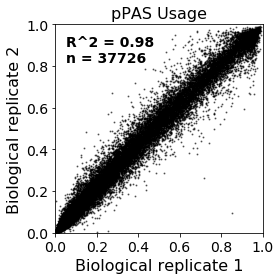

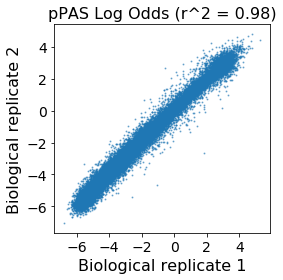

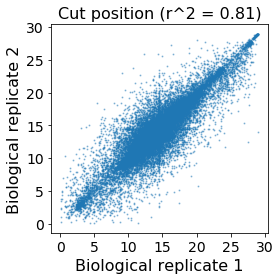

In [3]:
#Barcode-Pooled LoFi vs. Barcode-Pooled HiFi

save_figs = False

seq_ver_df_not_nan = seq_ver_df#.loc[~(np.isnan(seq_ver_df['mean_proximal_logodds']) | np.isinf(seq_ver_df['mean_proximal_logodds']))]

seq_ver_df_lo = seq_ver_df_not_nan.query("array_version == 'lofi' and n_barcodes >= 2 and mean_total_count >= 50").copy()
seq_ver_df_hi = seq_ver_df_not_nan.query("array_version == 'hifi' and n_barcodes >= 2 and mean_total_count >= 50").copy()

seq_ver_df_joined = seq_ver_df_lo.set_index('master_seq').join(seq_ver_df_hi.set_index('master_seq'), lsuffix='_lo', rsuffix='_hi', how='inner')

#Isoform proportions

r_val, _ = pearsonr(seq_ver_df_joined['mean_proximal_usage_lo'], seq_ver_df_joined['mean_proximal_usage_hi'])

f = plt.figure(figsize=(4, 4))

plt.scatter(seq_ver_df_joined['mean_proximal_usage_lo'], seq_ver_df_joined['mean_proximal_usage_hi'], alpha=0.5, s=1, c='black')


annot_text = 'R^2 = ' + str(round(r_val * r_val, 2))
annot_text += '\nn = ' + str(len(seq_ver_df_joined))
ax = plt.gca()
ax.text(0.05, 0.95, annot_text, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes, color='black', fontsize=14, weight="bold")



plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('Biological replicate 1', fontsize=16)
plt.ylabel('Biological replicate 2', fontsize=16)
plt.title('pPAS Usage', fontsize=16)

plt.xlim(0, 1)
plt.ylim(0, 1)

plt.tight_layout()

if save_figs :
    plt.savefig('lofi_vs_hifi_pas_usage.png', transparent=True, dpi=150)
    plt.savefig('lofi_vs_hifi_pas_usage.eps')

plt.show()

#Isoform log odds

r_val, _ = pearsonr(seq_ver_df_joined['mean_proximal_logodds_lo'], seq_ver_df_joined['mean_proximal_logodds_hi'])

f = plt.figure(figsize=(4, 4))

plt.scatter(seq_ver_df_joined['mean_proximal_logodds_lo'], seq_ver_df_joined['mean_proximal_logodds_hi'], alpha=0.5, s=1)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('Biological replicate 1', fontsize=16)
plt.ylabel('Biological replicate 2', fontsize=16)
plt.title('pPAS Log Odds (r^2 = ' + str(round(r_val * r_val, 2)) + ')', fontsize=16)

plt.tight_layout()

if save_figs :
    plt.savefig('lofi_vs_hifi_pas_logodds.png', transparent=True, dpi=150)
    plt.savefig('lofi_vs_hifi_pas_logodds.eps')

plt.show()

#Avg cut

r_val, _ = pearsonr(seq_ver_df_joined['mean_proximal_avgcut_lo'], seq_ver_df_joined['mean_proximal_avgcut_hi'])

f = plt.figure(figsize=(4, 4))

plt.scatter(seq_ver_df_joined['mean_proximal_avgcut_lo'], seq_ver_df_joined['mean_proximal_avgcut_hi'], alpha=0.4, s=1)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('Biological replicate 1', fontsize=16)
plt.ylabel('Biological replicate 2', fontsize=16)
plt.title('Cut position (r^2 = ' + str(round(r_val * r_val, 2)) + ')', fontsize=16)

plt.tight_layout()

if save_figs :
    plt.savefig('lofi_vs_hifi_cutpos.png', transparent=True, dpi=150)
    plt.savefig('lofi_vs_hifi_cutpos.eps')

plt.show()


<h2>Load collapsed designed MPRA data</h2>

In [2]:
#Load designed MPRA data (Collapsed over experiment replicates)
seq_dict = isoio.load('../data/prepared_data/apa_array_data/apa_array_data_master_seq')
print("n = " + str(len(seq_dict['array_df'])))
print('Avg read count (avg over barcodes) = ' + str(np.mean(seq_dict['array_df'].query("n_barcodes >= 2")['mean_total_count'])))
print('Pooled read count (pooled over barcodes) = ' + str(np.mean(seq_dict['array_df'].query("n_barcodes >= 2")['pooled_total_count'])))

#Load variant dataframe
variant_dict = isoio.load('../data/prepared_data/apa_variant_data/apa_variant_data_master_seq')
print("n (variants) = " + str(len(variant_dict['variant_df'])))

#Load predictions
model_name = 'aparent_theano_legacy_30_31_34_pasaligned'
pred_dict = isoio.load('predictions/apa_array_data_legacy/' + model_name + '_predictions_master_seq')

#Join mpra dataframes with prediction table and calculate cut probabilities
seq_df, variant_df = append_predictions(seq_dict['array_df'], seq_dict['pooled_cuts'], variant_dict['variant_df'], variant_dict['pooled_cuts_var'], variant_dict['pooled_cuts_ref'], pred_dict['array_df'], pred_dict['cut_prob'])


n = 39833
Avg read count (avg over barcodes) = 431.92676310713546
Pooled read count (pooled over barcodes) = 3656.5562880452626
n (variants) = 21734


<h2>Basic library statistics</h2>

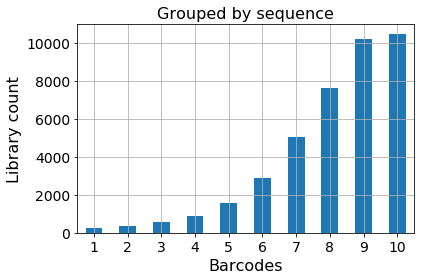

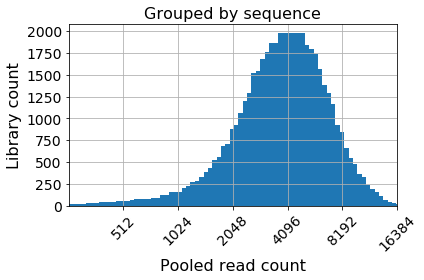

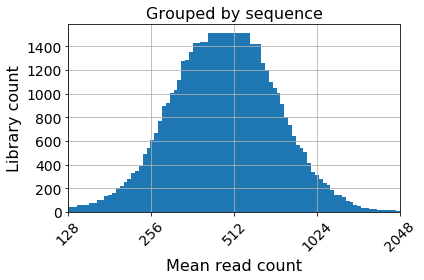

In [3]:
#Plot basic summary statistics of library

save_figs = False

#Barcode distribution

f = plt.figure(figsize=(6, 4))

plt.hist(seq_df['n_barcodes'], width=0.5, align='mid', bins=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])

plt.xticks(np.arange(10) + 1.25, np.arange(10) + 1, fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('Barcodes', fontsize=16)
plt.ylabel('Library count', fontsize=16)
plt.title('Grouped by sequence', fontsize=16)

plt.xlim(0.75, 10.75)

plt.grid(True)

plt.tight_layout()

if save_figs :
    plt.savefig('barcode_histo.png', transparent=True, dpi=150)
    plt.savefig('barcode_histo.svg')
    plt.savefig('barcode_histo.eps')

plt.show()

#Pooled total count distribution

f = plt.figure(figsize=(6, 4))

plt.hist(np.log2(seq_df['pooled_total_count']), width=0.5, align='mid', bins=100)

plt.xticks(np.array([9, 10, 11, 12, 13, 14]), 2**np.array([9, 10, 11, 12, 13, 14]), fontsize=14, rotation=45)
plt.yticks(fontsize=14)

plt.xlabel('Pooled read count', fontsize=16)
plt.ylabel('Library count', fontsize=16)
plt.title('Grouped by sequence', fontsize=16)

plt.xlim(8, 14)

plt.grid(True)

plt.tight_layout()

if save_figs :
    plt.savefig('pooled_count_histo.png', transparent=True, dpi=150)
    plt.savefig('pooled_count_histo.svg')
    plt.savefig('pooled_count_histo.eps')

plt.show()

#Mean total count distribution

f = plt.figure(figsize=(6, 4))

plt.hist(np.log2(seq_df['mean_total_count']), width=0.5, align='mid', bins=100)

plt.xticks(np.array([7, 8, 9, 10, 11]), 2**np.array([7, 8, 9, 10, 11]), fontsize=14, rotation=45)
plt.yticks(fontsize=14)

plt.xlabel('Mean read count', fontsize=16)
plt.ylabel('Library count', fontsize=16)
plt.title('Grouped by sequence', fontsize=16)

plt.xlim(7, 11)

plt.grid(True)

plt.tight_layout()

if save_figs :
    plt.savefig('mean_count_histo.png', transparent=True, dpi=150)
    plt.savefig('mean_count_histo.svg')
    plt.savefig('mean_count_histo.eps')

plt.show()


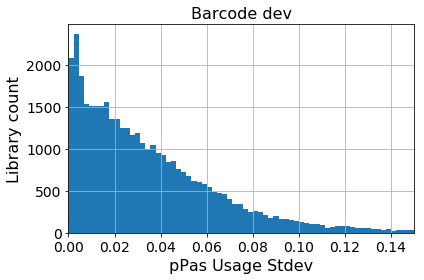

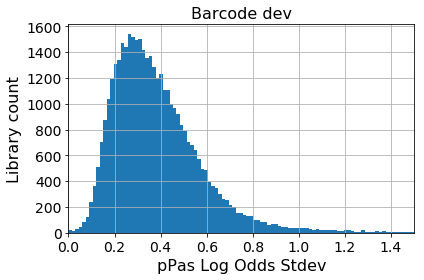

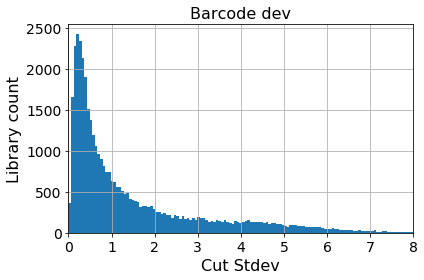

In [4]:
#Isoform deviation among barcodes

save_figs = False

#Grouped by sequence only

f = plt.figure(figsize=(6, 4))

plt.hist(seq_df.query("n_barcodes >= 2")['std_proximal_usage'], bins=200)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('pPas Usage Stdev', fontsize=16)
plt.ylabel('Library count', fontsize=16)
plt.title('Barcode dev', fontsize=16)

plt.grid(True)

plt.xlim(0, 0.15)

plt.tight_layout()

if save_figs :
    plt.savefig('prox_usage_deviation_histo.png', transparent=True, dpi=150)
    plt.savefig('prox_usage_deviation_histo.svg')
    plt.savefig('prox_usage_deviation_histo.eps')

plt.show()


f = plt.figure(figsize=(6, 4))

plt.hist(seq_df.query("n_barcodes >= 2")['std_proximal_logodds'], bins=200)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('pPas Log Odds Stdev', fontsize=16)
plt.ylabel('Library count', fontsize=16)
plt.title('Barcode dev', fontsize=16)

plt.grid(True)

plt.xlim(0, 1.5)

plt.tight_layout()

if save_figs :
    plt.savefig('prox_logodds_deviation_histo.png', transparent=True, dpi=150)
    plt.savefig('prox_logodds_deviation_histo.svg')
    plt.savefig('prox_logodds_deviation_histo.eps')

plt.show()


f = plt.figure(figsize=(6, 4))

plt.hist(seq_df.query("n_barcodes >= 2")['std_proximal_avgcut'], bins=200)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('Cut Stdev', fontsize=16)
plt.ylabel('Library count', fontsize=16)
plt.title('Barcode dev', fontsize=16)

plt.grid(True)

plt.xlim(0, 8)

plt.tight_layout()

if save_figs :
    plt.savefig('cutpos_deviation_histo.png', transparent=True, dpi=150)
    plt.savefig('cutpos_deviation_histo.svg')
    plt.savefig('cutpos_deviation_histo.eps')

plt.show()


<h2>Summary Max Isoform analysis</h2>

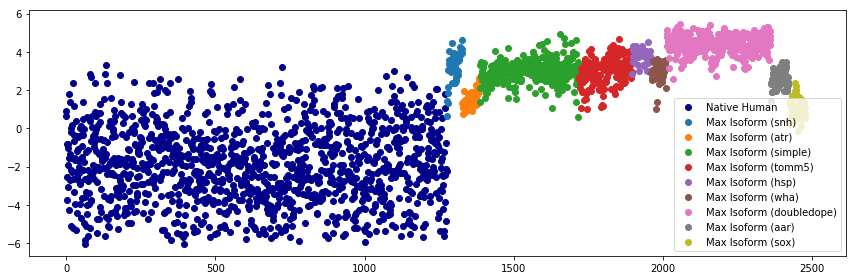

Total # of Max Isoform/Target ratio sequences = 1466
# of target_00 sequences = 53
# of target_025 sequences = 48
# of target_05 sequences = 55
# of target_075 sequences = 54
# of target_10 sequences = 54
# of max_score sequences = 1202


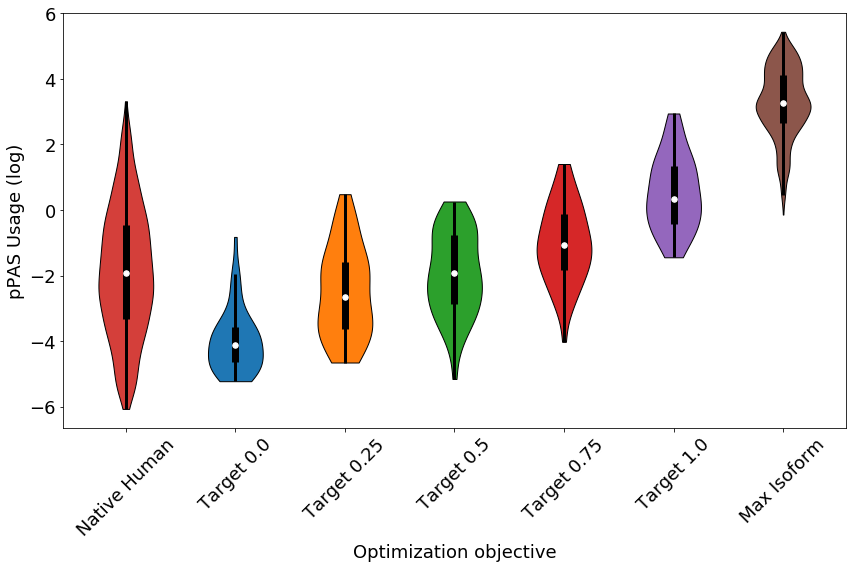

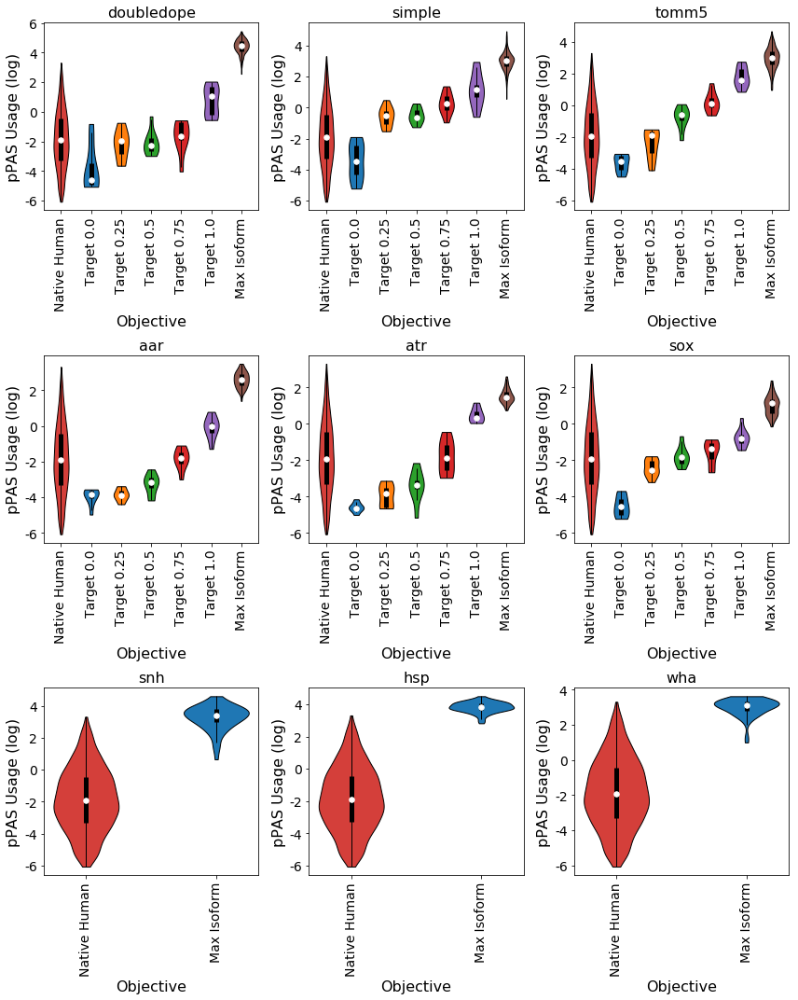

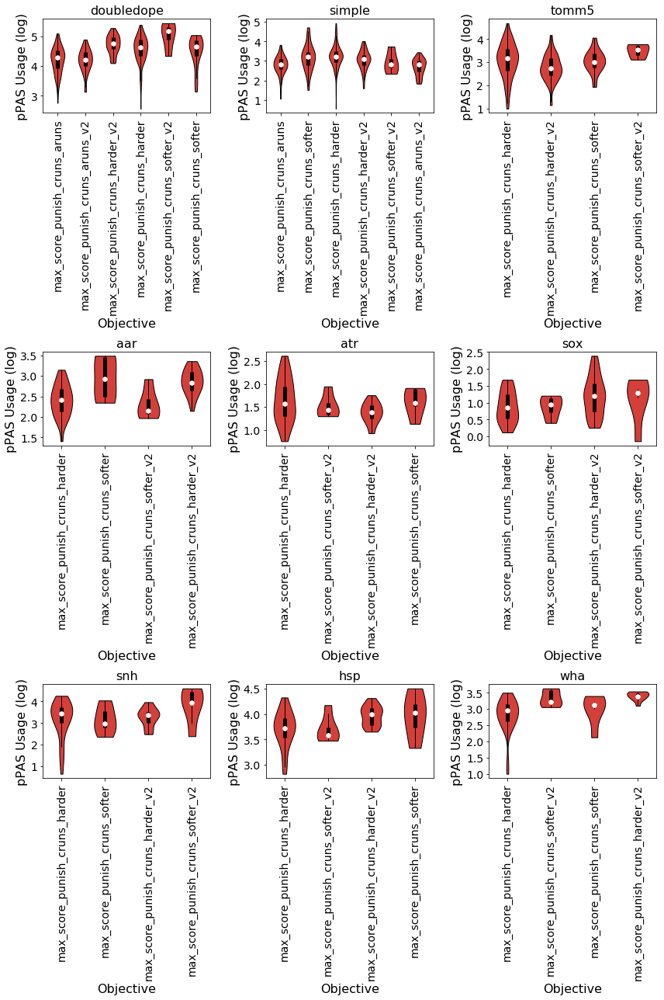

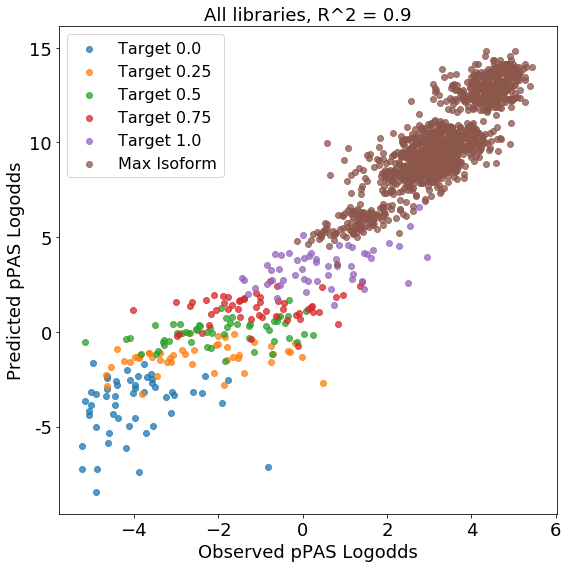

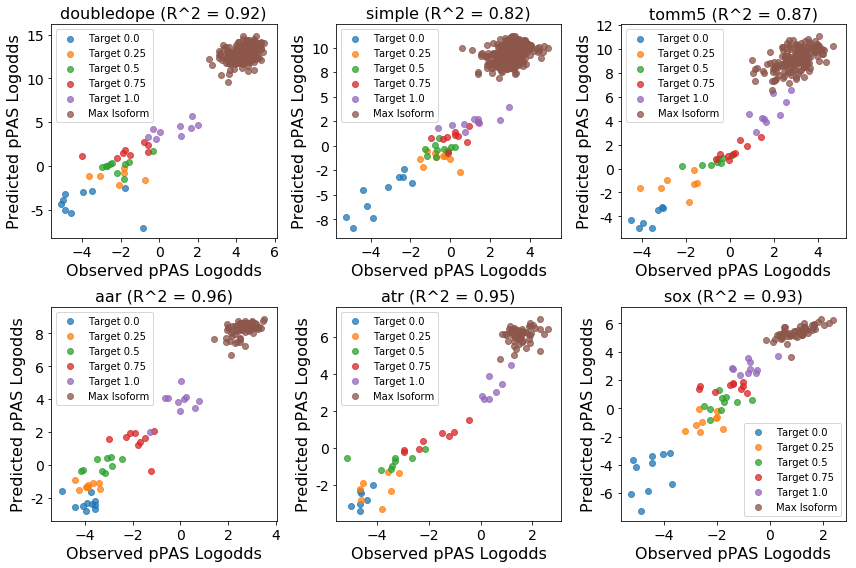

In [3]:

seq_df_filtered = seq_df.query("mean_total_count >= 100 and n_barcodes >= 5")

df_all = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")
max_iso_df_all = seq_df_filtered.query("experiment == 'max_iso' and variant != 'snv'")
max_iso_df_all = max_iso_df_all.loc[max_iso_df_all.subexperiment.str.contains('max_score')]
max_iso_df_all = max_iso_df_all.loc[~max_iso_df_all.subexperiment.str.contains('cstf')]


pred_column = 'logodds_pred'
true_column = 'median_proximal_vs_distal_logodds'

#Strip plot of measured isoform log odds distributions per optimized library
f = plt.figure(figsize=(12, 4))

plt.scatter(np.arange(len(df_all)), df_all[true_column], c='darkblue', label='Native Human')

n_points = len(df_all)

for gene in max_iso_df_all['gene'].unique() :
    max_iso_df_gene = max_iso_df_all.query("gene == '" + gene + "'")
    plt.scatter(np.arange(len(max_iso_df_gene)) + n_points, max_iso_df_gene[true_column], label='Max Isoform (' + gene + ')')

    n_points += len(max_iso_df_gene)
    
plt.legend()

plt.tight_layout()
plt.show()


#Violin plot of target isoform- optimized sequences
save_figs = False
show_axis = True

max_iso_df_all = seq_df_filtered.query("experiment == 'max_iso' and variant != 'snv'")
max_iso_df_all = max_iso_df_all.loc[~max_iso_df_all.subexperiment.str.contains('cstf')]

violindata = [
    sorted(np.array(np.ravel(df_all[true_column].values)))
]

violinlabels = [
    'Native Human'
]

included_genes = [
    'doubledope',
    'simple',
    'tomm5',
    'aar',
    'atr',
    'sox',
    'snh',
    'hsp',
    'wha'
]

subexps = [
    ['target_00', 'Target 0.0'],
    ['target_025', 'Target 0.25'],
    ['target_05', 'Target 0.5'],
    ['target_075', 'Target 0.75'],
    ['target_10', 'Target 1.0'],
    ['max_score', 'Max Isoform'],
]

print("Total # of Max Isoform/Target ratio sequences = " + str(len(max_iso_df_all)))

for subexp, iso_label in subexps :
    
    violinlabels.append(iso_label)
    curr_data = sorted(np.array(np.ravel(max_iso_df_all.loc[max_iso_df_all.subexperiment.str.contains(subexp)][true_column].values)))
    
    print("# of " + subexp + " sequences = " + str(len(curr_data)))
    
    violindata.append(curr_data)


if show_axis :
    f = plt.figure(figsize=(12, 8))
else :
    f = plt.figure(figsize=(6, 4))

parts = plt.violinplot(violindata, np.arange(len(violindata)), showmeans=False, showextrema=False, showmedians=False)

violin_colors = ['#D43F3A', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
for i, pc in enumerate(parts['bodies']):
    #pc.set_facecolor('#D43F3A')
    pc.set_facecolor(violin_colors[i])
    pc.set_edgecolor('black')
    pc.set_alpha(1)


def adjacent_values(vals, q1, q3):
    upper_adjacent_value = q3 + (q3 - q1) * 1.5
    upper_adjacent_value = np.clip(upper_adjacent_value, q3, vals[-1])

    lower_adjacent_value = q1 - (q3 - q1) * 1.5
    lower_adjacent_value = np.clip(lower_adjacent_value, vals[0], q1)
    return lower_adjacent_value, upper_adjacent_value


percs = [np.percentile(violindata[i], [25, 50, 75], axis=0) for i in range(0, len(violindata))]
quartile1, medians, quartile3 = zip(*percs)
whiskers = np.array([
    adjacent_values(sorted_array, q1, q3)
    for sorted_array, q1, q3 in zip(violindata, quartile1, quartile3)])
whiskersMin, whiskersMax = whiskers[:, 0], whiskers[:, 1]


inds = np.arange(len(violindata))
plt.scatter(inds, medians, marker='o', color='white', s=30, zorder=3)
plt.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=7)
plt.vlines(inds, whiskersMin, whiskersMax, color='k', linestyle='-', lw=3)

if show_axis :
    plt.xticks(np.arange(len(violindata)), violinlabels, rotation=45, fontsize=18)
    plt.yticks(fontsize=18)

    plt.xlabel('Optimization objective', fontsize=18)
    plt.ylabel('pPAS Usage (log)', fontsize=18)
else :
    plt.xticks([], [])
    plt.yticks([], [])

plt.tight_layout()
if save_figs :
    plt.savefig('max_isoform_violin_all.png', transparent=True, dpi=150)
    plt.savefig('max_isoform_violin_all.svg')
    plt.savefig('max_isoform_violin_all.eps')
plt.show()


#Break down target isoform- analysis by library
if show_axis :
    f, ax = plt.subplots(3, 3, figsize=(12, 15))
else :
    f, ax = plt.subplots(3, 3, figsize=(8, 8))

for gene_i, gene in enumerate(included_genes) :
    violindata = [
        sorted(np.ravel(df_all[true_column].values))
    ]

    violinlabels = [
        'Native Human'
    ]

    row_i = int(gene_i / 3)
    col_i = int(gene_i % 3)

    for subexp, iso_label in subexps :
        curr_data = np.ravel(max_iso_df_all.query("gene == '" + gene + "'").loc[max_iso_df_all.subexperiment.str.contains(subexp)][true_column].values)
        
        if len(curr_data) > 0 :
            violinlabels.append(iso_label)
            violindata.append(sorted(curr_data))


    #ax[row_i, col_i].violinplot(violindata, np.arange(len(violindata)), points=60, widths=0.7, showmeans=True, showextrema=True, showmedians=True, bw_method=0.5)
    parts = ax[row_i, col_i].violinplot(violindata, np.arange(len(violindata)), showmeans=False, showextrema=False, showmedians=False)

    violin_colors = ['#D43F3A', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    for i, pc in enumerate(parts['bodies']):
        #pc.set_facecolor('#D43F3A')
        pc.set_facecolor(violin_colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(1)
    
    percs = [np.percentile(violindata[i], [25, 50, 75], axis=0) for i in range(0, len(violindata))]
    quartile1, medians, quartile3 = zip(*percs)
    whiskers = np.array([
        adjacent_values(sorted_array, q1, q3)
        for sorted_array, q1, q3 in zip(violindata, quartile1, quartile3)])
    whiskersMin, whiskersMax = whiskers[:, 0], whiskers[:, 1]

    plt.sca(ax[row_i, col_i])

    inds = np.arange(len(violindata))
    plt.scatter(inds, medians, marker='o', color='white', s=30, zorder=3)
    plt.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=5)
    plt.vlines(inds, whiskersMin, whiskersMax, color='k', linestyle='-', lw=1)

    if show_axis :
        plt.xticks(np.arange(len(violindata)), violinlabels, rotation=90, fontsize=14)
        plt.yticks(fontsize=14)

        #ax[row_i, col_i].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        ax[row_i, col_i].yaxis.set_major_formatter(FormatStrFormatter('%.0f'))

        plt.title(gene, fontsize=16)
        plt.xlabel('Objective', fontsize=16)
        plt.ylabel('pPAS Usage (log)', fontsize=16)
    else :
        plt.xticks([], [])
        plt.yticks([], [])


plt.tight_layout()
if save_figs :
    plt.savefig('max_isoform_violin_per_library.png', transparent=True, dpi=150)
    plt.savefig('max_isoform_violin_per_library.svg')
    plt.savefig('max_isoform_violin_per_library.eps')
plt.show()


#Break down by library and max_score subexperiment
if show_axis :
    f, ax = plt.subplots(3, 3, figsize=(12, 18))
else :
    f, ax = plt.subplots(3, 3, figsize=(8, 8))

for gene_i, gene in enumerate(included_genes) :
    violindata = []
    violinlabels = []

    row_i = int(gene_i / 3)
    col_i = int(gene_i % 3)

    gene_data = max_iso_df_all.query("gene == '" + gene + "'")
    gene_data = gene_data.loc[gene_data.subexperiment.str.contains('max_score')]
    
    for subexp in gene_data['subexperiment'].unique() :
        curr_data = np.ravel(gene_data.query("subexperiment == '" + subexp + "'")[true_column].values)
        
        if len(curr_data) > 0 :
            violinlabels.append(subexp)
            violindata.append(sorted(curr_data))


    #ax[row_i, col_i].violinplot(violindata, np.arange(len(violindata)), points=60, widths=0.7, showmeans=True, showextrema=True, showmedians=True, bw_method=0.5)
    parts = ax[row_i, col_i].violinplot(violindata, np.arange(len(violindata)), showmeans=False, showextrema=False, showmedians=False)

    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor('#D43F3A')
        pc.set_edgecolor('black')
        pc.set_alpha(1)
    
    percs = [np.percentile(violindata[i], [25, 50, 75], axis=0) for i in range(0, len(violindata))]
    quartile1, medians, quartile3 = zip(*percs)
    whiskers = np.array([
        adjacent_values(sorted_array, q1, q3)
        for sorted_array, q1, q3 in zip(violindata, quartile1, quartile3)])
    whiskersMin, whiskersMax = whiskers[:, 0], whiskers[:, 1]

    plt.sca(ax[row_i, col_i])

    inds = np.arange(len(violindata))
    plt.scatter(inds, medians, marker='o', color='white', s=30, zorder=3)
    plt.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=5)
    plt.vlines(inds, whiskersMin, whiskersMax, color='k', linestyle='-', lw=1)


    if show_axis :
        plt.xticks(np.arange(len(violindata)), violinlabels, rotation=90, fontsize=14)
        plt.yticks(fontsize=14)

        plt.title(gene, fontsize=16)
        plt.xlabel('Objective', fontsize=16)
        plt.ylabel('pPAS Usage (log)', fontsize=16)
    else :
        plt.xticks([], [])
        plt.yticks([], [])


plt.tight_layout()
if save_figs :
    plt.savefig('max_isoform_violin_per_subexperiment.png', transparent=True, dpi=150)
    plt.savefig('max_isoform_violin_per_subexperiment.svg')
    plt.savefig('max_isoform_violin_per_subexperiment.eps')
plt.show()


#Scatter plot of predicted vs. measured log odds of target isoform- sequences
r_val, _ = pearsonr(max_iso_df_all[true_column], max_iso_df_all[pred_column])

if show_axis :
    f = plt.figure(figsize=(8, 8))
else :
    f = plt.figure(figsize=(4, 4))

for subexp, subexp_label in subexps :
    max_iso_sub = max_iso_df_all.loc[max_iso_df_all.subexperiment.str.contains(subexp)]
    plt.scatter(max_iso_sub[true_column], max_iso_sub[pred_column], alpha=0.75, label=subexp_label)

if show_axis :
    plt.title('All libraries, R^2 = ' + str(round(r_val * r_val, 2)), fontsize=18)

    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    ax = plt.gca()
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))

    plt.xlabel('Observed pPAS Logodds', fontsize=18)
    plt.ylabel('Predicted pPAS Logodds', fontsize=18)

    plt.legend(fontsize=16)
else :
    plt.xticks([], [])
    plt.yticks([], [])

plt.tight_layout()
if save_figs :
    plt.savefig('max_isoform_scatter_all.png', transparent=True, dpi=150)
    plt.savefig('max_isoform_scatter_all.eps')
plt.show()




#Break down by library
if show_axis :
    f, ax = plt.subplots(2, 3, figsize=(12, 8))
else :
    f, ax = plt.subplots(2, 3, figsize=(8, 8./3. * 2.))

included_genes = [
    'doubledope',
    'simple',
    'tomm5',
    'aar',
    'atr',
    'sox'
]

for gene_i, gene in enumerate(included_genes) :
    
    row_i = int(gene_i / 3)
    col_i = int(gene_i % 3)

    r_val, _ = pearsonr(max_iso_df_all.query("gene == '" + gene + "'")[true_column], max_iso_df_all.query("gene == '" + gene + "'")[pred_column])
    
    for subexp, iso_label in subexps :
        curr_data = max_iso_df_all.query("gene == '" + gene + "'").loc[max_iso_df_all.subexperiment.str.contains(subexp)]
        
        if len(curr_data) > 0 :
            ax[row_i, col_i].scatter(curr_data[true_column], curr_data[pred_column], alpha=0.75, label=iso_label)

    plt.sca(ax[row_i, col_i])
    
    if show_axis :
        plt.title(gene + ' (R^2 = ' + str(round(r_val * r_val, 2)) + ')', fontsize=16)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)

        ax[row_i, col_i].yaxis.set_major_formatter(FormatStrFormatter('%.0f'))

        plt.xlabel('Observed pPAS Logodds', fontsize=16)
        plt.ylabel('Predicted pPAS Logodds', fontsize=16)
        plt.legend()
    else :
        plt.xticks([], [])
        plt.yticks([], [])


plt.tight_layout()
if save_figs :
    plt.savefig('max_isoform_scatter_per_library.png', transparent=True, dpi=150)
    plt.savefig('max_isoform_scatter_per_library.eps')
plt.show()

<h2>Detailed Max Isoform analysis</h2>

In [4]:
max_iso_pwm_dict = load_max_isoform_pwms()

doubledope, Increasing isoform abundance objective...


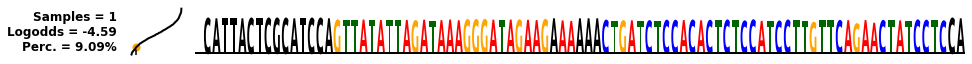

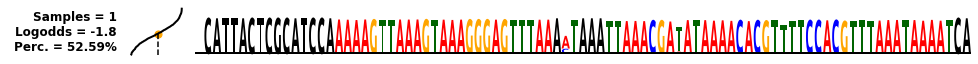

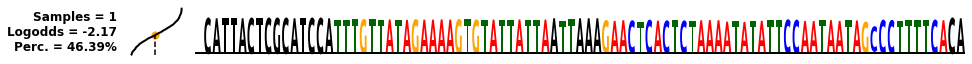

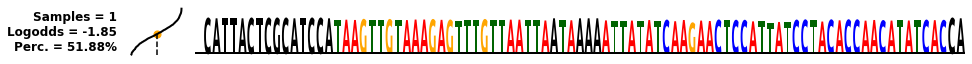

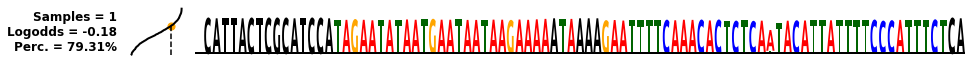

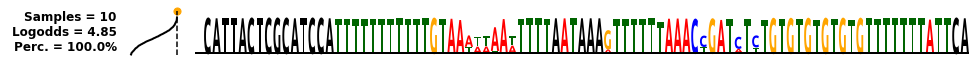

In [5]:

df_human = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")

subexperiments = [
    ['target_00'],
    ['target_025'],
    ['target_05'],
    ['target_075'],
    ['target_10'],
    ['max_score_punish_cruns_harder']
]

gene = 'doubledope'#'tomm5'

max_index_list=['mid', 'mid', 'mid', 'mid', 'mid', 0]
true_column='median_proximal_vs_distal_logodds'
figsize=(14,1)#(14, 4)
width_ratios=[2, 1, 14]
logo_height = 0.75
usage_unit = 'log'#'fraction'

plot_mean_logo=False
plot_max_logo=True
plot_actual_pwm=False
plot_opt_pwm=True

black_fixed_seq=True

plot_start=9
plot_end=96 + 2 #+ 17
plot_percentile=True
override_mean_stats=False

save_figs=False

print(gene + ', Increasing isoform abundance objective...')

for i, subexperiment in enumerate(subexperiments) :
    max_index = max_index_list[i]
    
    plot_sequence_logo(max_iso_df_all.query("gene == '" + gene + "'"), df_human, max_iso_pwm_dict, gene, subexperiment, override_mean_stats=override_mean_stats, plot_percentile=plot_percentile, plot_mean_logo=plot_mean_logo, plot_max_logo=plot_max_logo, plot_actual_pwm=plot_actual_pwm, plot_opt_pwm=plot_opt_pwm, black_fixed_seq=black_fixed_seq, max_index=max_index, true_column=true_column, figsize=figsize, width_ratios=width_ratios, logo_height=logo_height, usage_unit=usage_unit, plot_snvs=False, seq_trim_start=0, seq_trim_end=164, plot_start=plot_start, plot_end=plot_end, pas_downscaling=1.0, save_figs=save_figs, fig_name='max_iso_' + gene + '_' + subexperiment[0], fig_dpi=150)

tomm5, Max isoform objective...


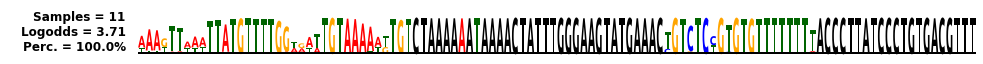

doubledope, Max isoform objective...


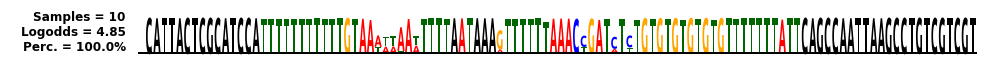

simple, Max isoform objective...


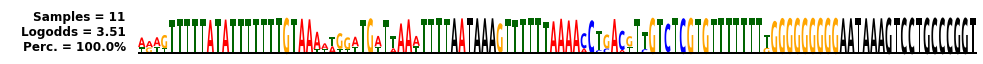

aar, Max isoform objective...


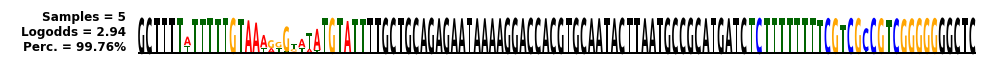

atr, Max isoform objective...


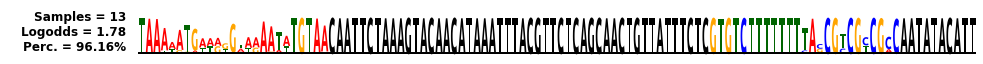

hsp, Max isoform objective...


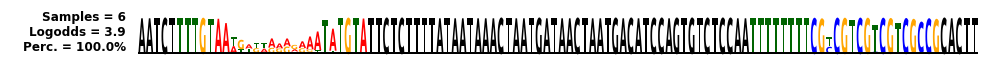

snh, Max isoform objective...


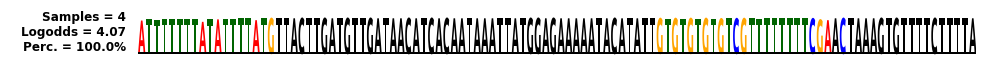

sox, Max isoform objective...


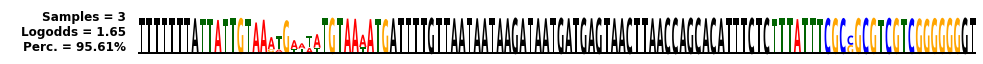

wha, Max isoform objective...


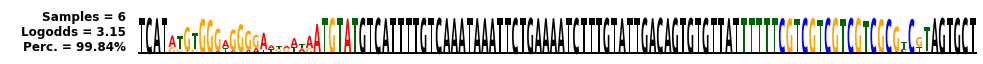

In [8]:

df_human = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")

subexperiments = [
    'max_score_punish_cruns_harder'
]

genes = ['tomm5', 'doubledope', 'simple', 'aar', 'atr', 'hsp', 'snh', 'sox', 'wha']

max_index=0
true_column='median_proximal_vs_distal_logodds'
figsize=(14,1)#(14, 4)
width_ratios=[2, 1, 14]
logo_height = 0.75
usage_unit = 'log'#'fraction'

plot_mean_logo=False
plot_max_logo=True
plot_actual_pwm=False
plot_opt_pwm=True

black_fixed_seq=True

plot_start=9
plot_end=116 + 3#96 + 2
plot_percentile=False
override_mean_stats=False

save_figs=False

for i, gene in enumerate(genes) :
    print(gene + ', Max isoform objective...')
    
    plot_sequence_logo(max_iso_df_all.query("gene == '" + gene + "'"), df_human, max_iso_pwm_dict, gene, subexperiments, override_mean_stats=override_mean_stats, plot_percentile=plot_percentile, plot_mean_logo=plot_mean_logo, plot_max_logo=plot_max_logo, plot_actual_pwm=plot_actual_pwm, plot_opt_pwm=plot_opt_pwm, black_fixed_seq=black_fixed_seq, max_index=max_index, true_column=true_column, figsize=figsize, width_ratios=width_ratios, logo_height=logo_height, usage_unit=usage_unit, plot_snvs=False, seq_trim_start=0, seq_trim_end=164, plot_start=plot_start, plot_end=plot_end, pas_downscaling=1.0, save_figs=save_figs, fig_name='max_iso_' + gene + '_' + subexperiment[0], fig_dpi=300)

<h2>Saturation Mutagenesis of Max Isoform- optimized Sequences</h2>

gene = simple, sequence 0...
WT Usage = 0.9524 (2.9957)
# Significant upreg. SNVs = 14
# Significant downreg. SNVs = 104


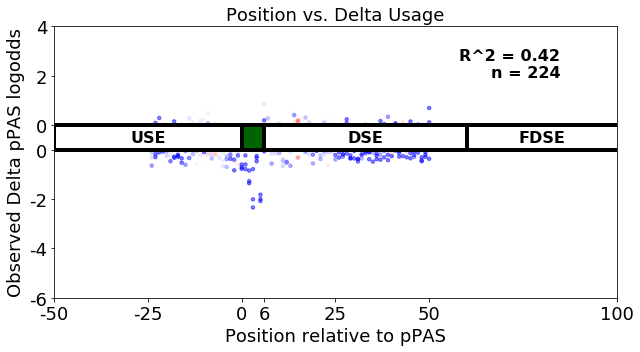

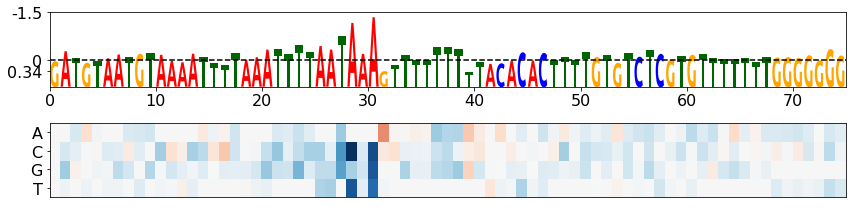

gene = doubledope, sequence 0...
WT Usage = 0.9933 (4.9936)
# Significant upreg. SNVs = 33
# Significant downreg. SNVs = 150


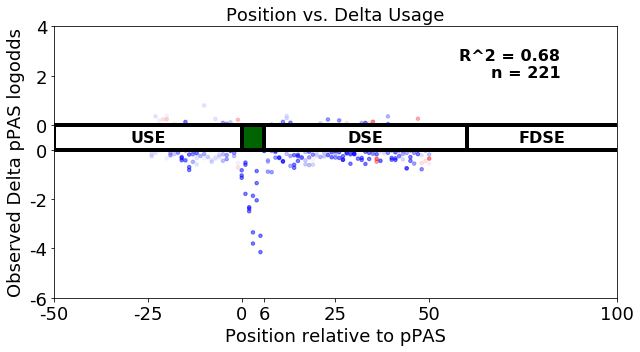

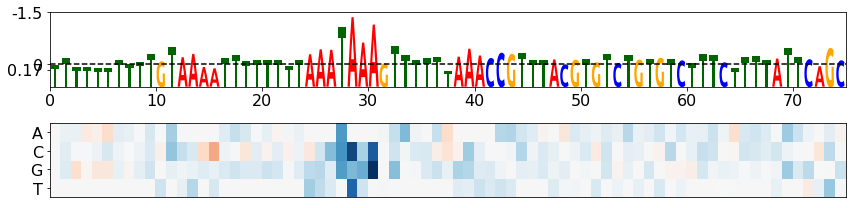

gene = doubledope, sequence 1...
WT Usage = 0.9899 (4.5824)
# Significant upreg. SNVs = 32
# Significant downreg. SNVs = 146


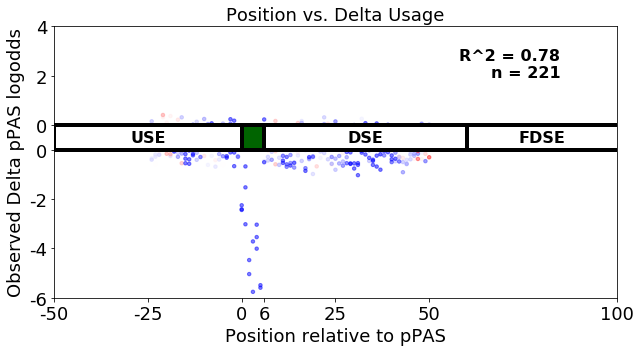

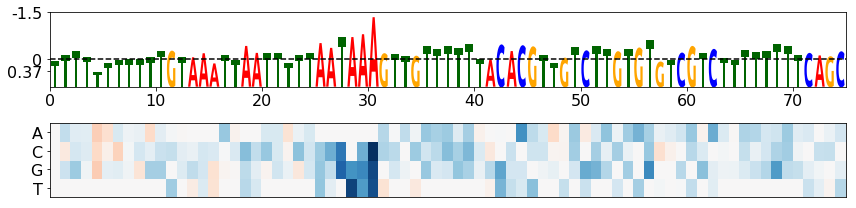

In [9]:
#Max Isoform SNV analysis

save_figs = False

seq_start = 25
seq_end = 100

p_val = 0.001

#All variants
#df_to_use = seq_predicted_isoform_df_delta_filtered_allexp.query("variant == 'snv' and experiment == 'max_iso'").copy()
df_to_use = variant_df.query("variant == 'snv' and experiment == 'max_iso'").copy().set_index('master_seq')


df_to_use['delta_logodds_true'] = df_to_use['median_proximal_vs_distal_logodds_var'] - df_to_use['median_proximal_vs_distal_logodds_ref']

df_to_use = df_to_use.query("n_barcodes_ref >= 5 and n_barcodes_var >= 5 and mean_total_count_ref >= 200 and mean_total_count_var >= 200")

whitelist_dict = {
    'simple_0',
    'doubledope_0',
    'doubledope_1'
}

for gene_i, gene in enumerate(df_to_use['gene'].unique()) :
    df_gene = df_to_use.query("gene == '" + gene + "'")
    for wt_seq_i, wt_seq in enumerate(sorted(df_gene['wt_seq'].unique())) :
        if gene + '_' + str(wt_seq_i) not in whitelist_dict :
            continue
        
        print("gene = " + gene + ', sequence ' + str(wt_seq_i) + '...')
        
        df_sel = df_gene.query("wt_seq == '" + wt_seq + "'")

        wt_logodds = df_sel['median_proximal_vs_distal_logodds_ref'].unique()[0]
        wt_usage = df_sel['median_proximal_vs_distal_usage_ref'].unique()[0]
        
        n_signi_up = len(df_sel.query("delta_p_val < " + str(p_val) + " and delta_logodds_true > 0"))
        n_signi_dn = len(df_sel.query("delta_p_val < " + str(p_val) + " and delta_logodds_true < 0"))
        
        print('WT Usage = ' + str(round(wt_usage, 4)) + " (" + str(round(wt_logodds, 4)) + ")")
        print('# Significant upreg. SNVs = ' + str(n_signi_up))
        print('# Significant downreg. SNVs = ' + str(n_signi_dn))
        
        figsize=(9, 5)

        fig_name = None
        if save_figs :
            fig_name = 'position_delta_max_iso_' + gene + '_' + str(wt_seq_i)
        plot_position_delta_scatter(df_sel, min_pred_filter=0.0, figsize=figsize, fig_name=fig_name, vmin=-0.5, vmax=0.5, fig_dpi=150, annotate=None)

        mut_map_v2(
            df_sel,
            gene,
            experiment='max_iso',
            mode='true',
            pred_column='mean_delta_logodds_pred',
            figsize=(12,3),
            mark_pathogenic=False,
            mark_benign=False,
            mark_undetermined=False,
            seq_trim_start=seq_start, seq_trim_end=seq_end,
            plot_start=0, plot_end=seq_end-seq_start,
            #pas_downscaling=0.5,
            pas_downscaling=-1.5,
            pas_downscale_mode='value',#'frac'
            fig_name=('max_iso_' + gene + '_' + str(wt_seq_i) + '_Mutmap_Observed') if save_figs else None,
            fig_dpi=300
        )


<h2>Summary Max Cut analysis</h2>

In [10]:
unique_experiments = seq_df.query("experiment == 'max_cut'")['subexperiment'].unique()

seq_df_filtered = seq_df.query("mean_total_count >= 100 and n_barcodes >= 5")

cut_df_filtered = seq_df.query("experiment == 'max_cut' and mean_total_count >= 10").copy()

#Map and evaluate sequences
def eval_logloss(cut_prob, target_pos) :
    target = np.zeros(cut_prob.shape[0])
    target[target_pos] = 0.8
    target[target_pos - 1] = 0.10
    target[target_pos + 1] = 0.10
    
    ent = -np.dot(target, np.log((cut_prob + 0.001) / np.sum(cut_prob + 0.001)))
    
    return ent

start_pos = 58
end_pos = 108

cut_poses = np.arange(end_pos - start_pos) + (start_pos - 56)

true_cut_column = 'cut_prob_true'
pred_cut_column = 'cut_prob_pred'

avg_position_true = []
avg_position_pred = []
cut_probs_true = []
cut_probs_pred = []
log_loss = []
for index, row in cut_df_filtered.iterrows() :
    
    cut_prob_true = np.ravel(row[true_cut_column])
    cut_prob_true = cut_prob_true[start_pos:end_pos] / np.sum(cut_prob_true[start_pos:end_pos])
    cut_probs_true.append(cut_prob_true)

    cut_prob_pred = np.ravel(row[pred_cut_column])
    cut_prob_pred = cut_prob_pred[start_pos:end_pos] / np.sum(cut_prob_pred[start_pos:end_pos])
    cut_probs_pred.append(cut_prob_pred)
    
    avg_pos_true = np.dot(cut_prob_true, (np.arange(cut_prob_true.shape[0]) + start_pos))
    avg_pos_pred = np.dot(cut_prob_pred, (np.arange(cut_prob_pred.shape[0]) + start_pos))
    avg_position_true.append(avg_pos_true)
    avg_position_pred.append(avg_pos_pred)
    
    cut_pos_caught = False
    for cut_pos in [60, 65, 70, 75, 80, 85, 90, 95, 100] :
        if str(cut_pos) in row['subexperiment'] :            
            log_loss.append(eval_logloss(np.copy(cut_prob_true), cut_pos - 55 - (start_pos - 56)))
            
            cut_pos_caught = True
            break
    
    if not cut_pos_caught :
        log_loss.append(0)
    

cut_df_filtered['proxcut_prob_true'] = cut_probs_true
cut_df_filtered['proxcut_prob_pred'] = cut_probs_pred
cut_df_filtered['avgpos_true'] = avg_position_true
cut_df_filtered['avgpos_pred'] = avg_position_pred
cut_df_filtered['loss_logloss'] = log_loss

cut_snv_df_filtered = cut_df_filtered.query("variant == 'snv'").copy()
cut_df_filtered = cut_df_filtered.query("variant != 'snv'").copy()

print("Total number of Max Cut sequences = " + str(len(cut_df_filtered)))


df_human = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")
human_cutprobs = np.array(df_human[true_cut_column].values.tolist())[:, start_pos:end_pos]
human_cutprobs = human_cutprobs / np.sum(human_cutprobs, axis=1).reshape(-1, 1)

human_cutprob = np.mean(human_cutprobs, axis=0)

objective_poses = [5, 10, 15, 20, 25, 30, 35, 40, 45]

Total number of Max Cut sequences = 1274


<h2>Objective cut precision per subexperiment</h2>

/home/johli/anaconda3/envs/aparent/lib/python3.6/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  return getattr(obj, method)(*args, **kwds)


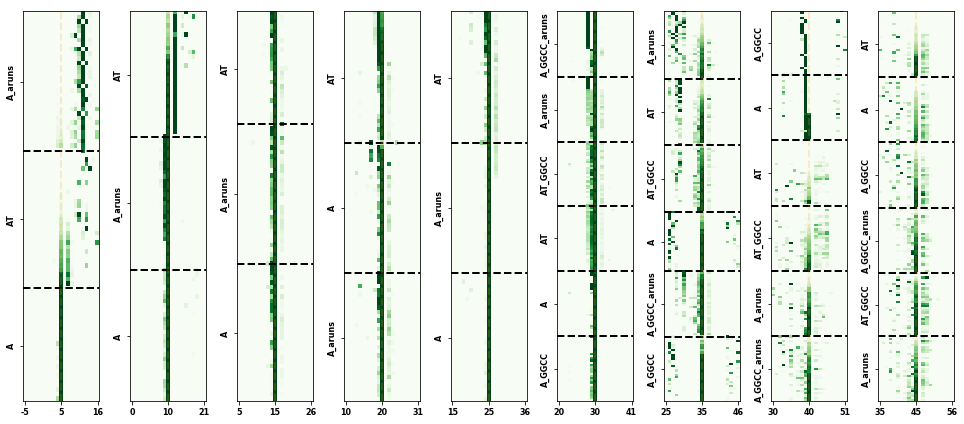

In [11]:

save_figs = False
print_verbose = False

cut_to_experiment = {}

pos_shift = 55
for cut_pos in [60, 65, 70, 75, 80, 85, 90, 95, 100] :
    cut_to_experiment[cut_pos - pos_shift] = []
    for unique_experiment in unique_experiments :
        if str(cut_pos) in unique_experiment :
            cut_to_experiment[cut_pos - pos_shift].append(unique_experiment)

#Detailed view per subexperiment

fig, ax = plt.subplots(1, len(cut_to_experiment), figsize=(1.5 * len(cut_to_experiment), 6))

subexperiment_blacklist = ['ent']

cut_pos_i = None
cut_pos = None

obj_pos_i = 0
for obj_pos, _ in sorted(cut_to_experiment.items(), key=lambda kv: kv[0]) :
    
    cut_result_dict = {}
    
    total_n_obj_pos_seqs = 0
    
    for subexperiment in cut_to_experiment[obj_pos] :
        n_subexp_seqs = len(np.nonzero(cut_df_filtered['subexperiment'] == subexperiment)[0])
        if print_verbose :
            print("Objective position = " + str(obj_pos) + ", subexperiment = " + subexperiment + ", # of sequences = " + str(n_subexp_seqs))
        total_n_obj_pos_seqs += n_subexp_seqs
        
        blacklisted = False
        for subexp_keyword in subexperiment_blacklist :
            if subexp_keyword in subexperiment :
                blacklisted = True
                break
        if blacklisted :        
            continue
    
        keep_index = np.nonzero(cut_df_filtered['subexperiment'] == subexperiment)[0]
        prox_prob = np.array(cut_df_filtered.iloc[keep_index]['proxcut_prob_true'].values.tolist())
    
        sort_index = np.argsort(np.ravel(cut_df_filtered.iloc[keep_index]['loss_logloss'].values))[::-1]
        prox_prob = prox_prob[sort_index, :]
        
        cut_result_dict[subexperiment] = {}
        cut_result_dict[subexperiment]['cut_probs'] = prox_prob
        cut_result_dict[subexperiment]['loss'] = np.mean(cut_df_filtered.iloc[keep_index]['loss_logloss'].values)
    
    if print_verbose :
        print("Objective position = " + str(obj_pos) + ", Total # of sequences = " + str(total_n_obj_pos_seqs))

    cut_probs = []
    cut_label_coords = []
    prev_label_coords = [0]
    cut_labels = []
    
    objective_pos = 0
    for subexperiment, vals in sorted(cut_result_dict.items(), key=lambda kv: kv[1]['loss'])[::-1] :
        prox_prob = vals['cut_probs']
        
        objective_pos = int(subexperiment.split('_')[-1]) - 55 + 10
    
        prox_prob = np.concatenate([np.zeros((prox_prob.shape[0], 10)), prox_prob, np.zeros((prox_prob.shape[0], 10))], axis=1)
    
        cut_probs.append(prox_prob[:, objective_pos - 10 - cut_poses[0]: objective_pos + 11 - cut_poses[0]])
        
        cut_label_coords.append(prev_label_coords[-1] + float(prox_prob.shape[0]) / 2.)
        prev_label_coords.append(prev_label_coords[-1] + float(prox_prob.shape[0]))
        cut_labels.append('_'.join(subexperiment.split('_')[:-1]))
    
        ax[obj_pos_i].axhline(y=prev_label_coords[-1], color='black', linewidth=2, linestyle='--')

    cut_probs = np.vstack(cut_probs)

    ax[obj_pos_i].imshow(cut_probs, cmap='Greens', vmin=0.05, vmax=0.3, aspect='auto')
    
    ax[obj_pos_i].axvline(x=10, color='orange', linewidth=2, linestyle='--', alpha=0.2)
    
    ax[obj_pos_i].set_xticks([0, 10, 20])
    ax[obj_pos_i].set_xticklabels([objective_pos - 20, objective_pos - 10, objective_pos + 1], fontsize=8, fontweight='bold', ha='center', va='top')
    
    ax[obj_pos_i].set_yticks(cut_label_coords)
    ax[obj_pos_i].set_yticklabels(cut_labels, fontsize=8, fontweight='bold', rotation=90, ha='right', va='center')
    
    obj_pos_i += 1


plt.tight_layout()

if save_figs :
    plt.savefig('cut_subexperiment_map.png', transparent=True, dpi=150)
    plt.savefig('cut_subexperiment_map.svg')
    plt.savefig('cut_subexperiment_map.eps')

plt.show()


<h2>Summary Max Cut analysis (all subexperiments)</h2>

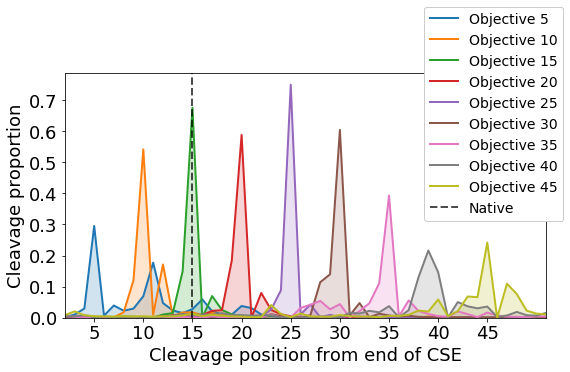

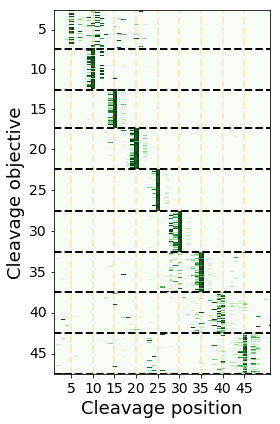

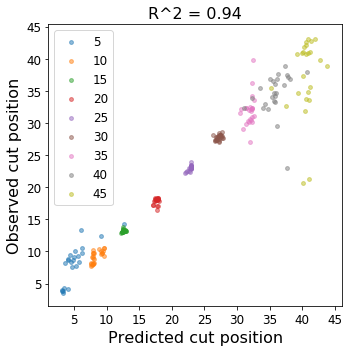

In [12]:
#Mean statistics over all subexperiments

cut_df_to_use = cut_df_filtered.loc[cut_df_filtered.subexperiment.str.contains('GGCC') | cut_df_filtered.subexperiment.str.slice(start=-2).isin(['60', '65', '70', '75', '80'])]

plot_cut_profile(cut_df_to_use, cut_to_experiment, cut_poses, objective_poses, human_cutprob, figsize=(8, 5.5), save_fig_name=None, fig_dpi=150, plot_mode='mean', n_samples=None)#save_fig_name='cut_profile_all_subexps'
plot_cut_map(cut_df_to_use, cut_to_experiment, cut_poses, objective_poses, human_cutprob, figsize=(4, 6), save_fig_name=None, fig_dpi=150, plot_mode='mean', n_samples=100)#save_fig_name='cut_map_all_subexps'
plot_position_scatter(cut_df_to_use, cut_to_experiment, cut_poses, objective_poses, human_cutprob, variant_filter="variant == 'wt'", figsize=(5, 5), save_fig_name=None, fig_dpi=150)#save_fig_name='avgcut_pred_vs_true_all_subexps'


<h2>Summary Max Cut analysis ('A' subexperiment)</h2>

Mean cut profile


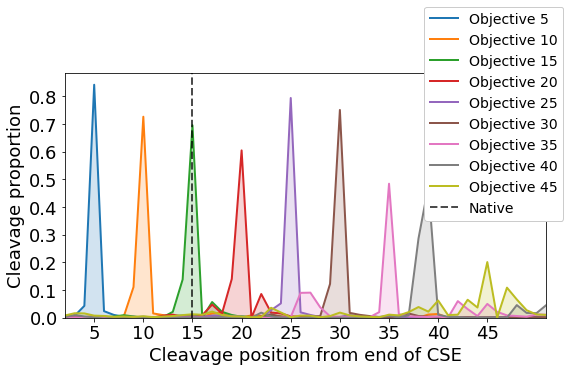

Max cut profile


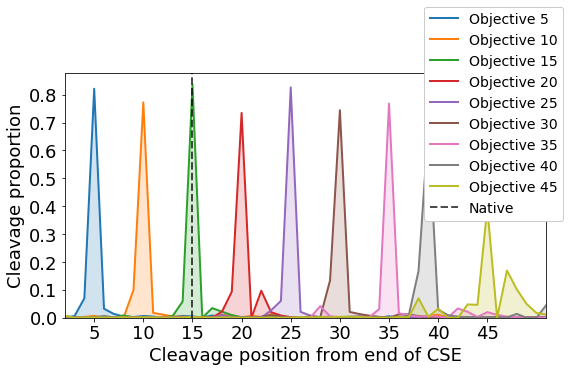

Mean cut map


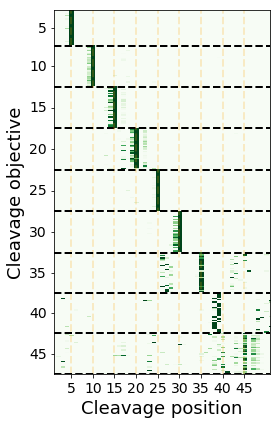

Max cut map


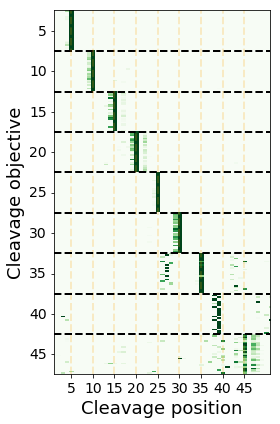

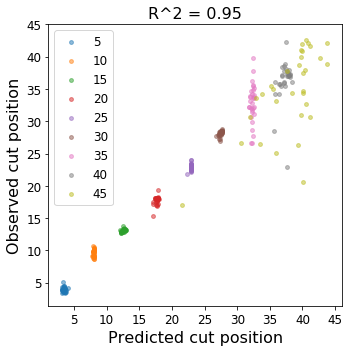

In [13]:
#Mean and Max statistics over A subexperiments

cut_nt = 'A'
aruns_objective = ''
ggcc_objective = '_GGCC'
cut_to_subexperiment = {
    5 : [cut_nt + aruns_objective + '_60', cut_nt + aruns_objective + '_ent_60'],
    10 : [cut_nt + aruns_objective + '_65', cut_nt + aruns_objective + '_ent_65'],
    15 : [cut_nt + aruns_objective + '_70', cut_nt + aruns_objective + '_ent_70'],
    20 : [cut_nt + aruns_objective + '_75', cut_nt + aruns_objective + '_ent_75'],
    25 : [cut_nt + aruns_objective + '_80', cut_nt + aruns_objective + '_ent_80'],
    30 : [cut_nt + ggcc_objective + aruns_objective + '_85', cut_nt + ggcc_objective + aruns_objective + '_ent_85'],
    35 : [cut_nt + ggcc_objective + aruns_objective + '_90', cut_nt + ggcc_objective + aruns_objective + '_ent_90'],
    40 : [cut_nt + ggcc_objective + aruns_objective + '_95', cut_nt + ggcc_objective + aruns_objective + '_ent_95'],
    45 : [cut_nt + ggcc_objective + aruns_objective + '_100', cut_nt + ggcc_objective + aruns_objective + '_ent_100'],
}

print('Mean cut profile')
plot_cut_profile(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(8, 5.5), save_fig_name=None, fig_dpi=150, plot_mode='mean', n_samples=None)#save_fig_name='cut_profile_subexp_a_mean'
print('Max cut profile')
plot_cut_profile(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(8, 5.5), save_fig_name=None, fig_dpi=150, plot_mode='max', n_samples=5)#save_fig_name='cut_profile_subexp_a_max'

print('Mean cut map')
plot_cut_map(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(4, 6), save_fig_name=None, fig_dpi=150, plot_mode='mean', n_samples=100)#save_fig_name='cut_map_all_subexp_a_mean'
print('Max cut map')
plot_cut_map(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(4, 6), save_fig_name=None, fig_dpi=150, plot_mode='max', n_samples=25)#save_fig_name='cut_map_all_subexp_a_max'

plot_position_scatter(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, variant_filter="variant == 'wt' or variant == 'sampled'", figsize=(5, 5), save_fig_name=None, fig_dpi=150)#save_fig_name='avgcut_pred_vs_true_subexp_a'


<h2>Summary Max Cut analysis ('AT' subexperiment)</h2>

Mean cut profile


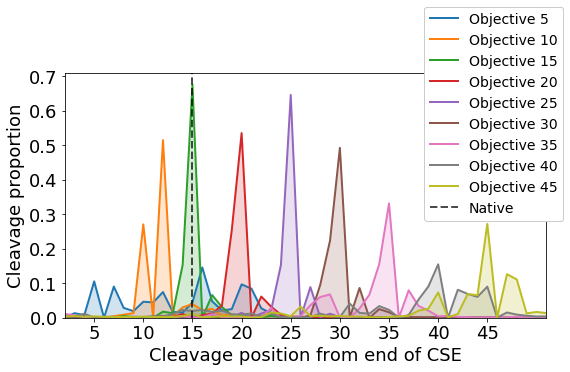

Max cut profile


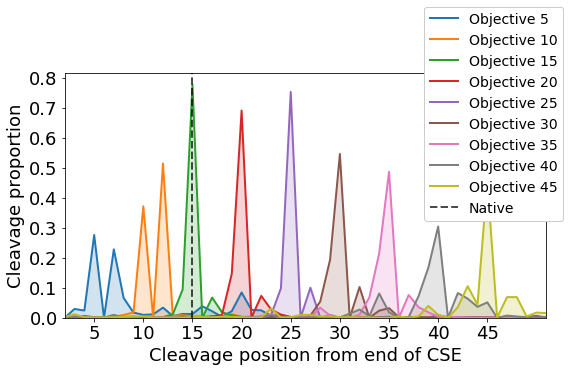

Mean cut map


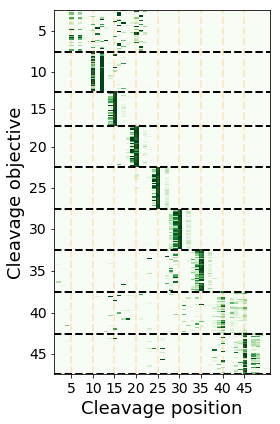

Max cut map


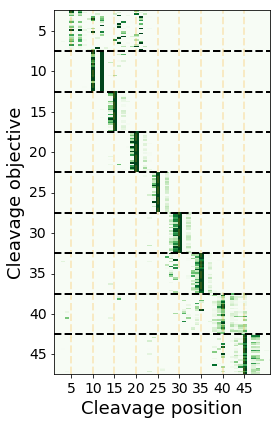

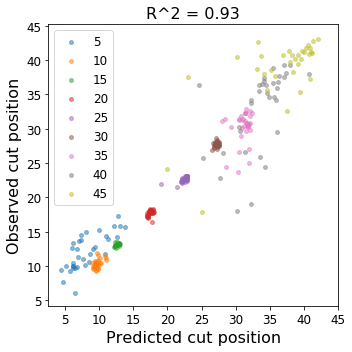

In [14]:
#Mean and Max statistics over AT subexperiments

cut_nt = 'AT'
aruns_objective = ''
ggcc_objective = '_GGCC'
cut_to_subexperiment = {
    5 : [cut_nt + aruns_objective + '_60', cut_nt + aruns_objective + '_ent_60'],
    10 : [cut_nt + aruns_objective + '_65', cut_nt + aruns_objective + '_ent_65'],
    15 : [cut_nt + aruns_objective + '_70', cut_nt + aruns_objective + '_ent_70'],
    20 : [cut_nt + aruns_objective + '_75', cut_nt + aruns_objective + '_ent_75'],
    25 : [cut_nt + aruns_objective + '_80', cut_nt + aruns_objective + '_ent_80'],
    30 : [cut_nt + ggcc_objective + aruns_objective + '_85', cut_nt + ggcc_objective + aruns_objective + '_ent_85'],
    35 : [cut_nt + ggcc_objective + aruns_objective + '_90', cut_nt + ggcc_objective + aruns_objective + '_ent_90'],
    40 : [cut_nt + ggcc_objective + aruns_objective + '_95', cut_nt + ggcc_objective + aruns_objective + '_ent_95'],
    45 : [cut_nt + ggcc_objective + aruns_objective + '_100', cut_nt + ggcc_objective + aruns_objective + '_ent_100'],
}

print('Mean cut profile')
plot_cut_profile(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(8, 5.5), save_fig_name=None, fig_dpi=150, plot_mode='mean', n_samples=None)#save_fig_name='cut_profile_subexp_at_mean'
print('Max cut profile')
plot_cut_profile(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(8, 5.5), save_fig_name=None, fig_dpi=150, plot_mode='max', n_samples=5)#save_fig_name='cut_profile_subexp_at_max'

print('Mean cut map')
plot_cut_map(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(4, 6), save_fig_name=None, fig_dpi=150, plot_mode='mean', n_samples=100)#save_fig_name='cut_map_subexp_at_mean'
print('Max cut map')
plot_cut_map(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(4, 6), save_fig_name=None, fig_dpi=150, plot_mode='max', n_samples=25)#save_fig_name='cut_map_subexp_at_max'

plot_position_scatter(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, variant_filter="variant == 'wt' or variant == 'sampled'", figsize=(5, 5), save_fig_name=None, fig_dpi=150)#save_fig_name='avgcut_pred_vs_true_subexp_at'


<h2>Summary Max Cut analysis ('Punish A-runs' subexperiment)</h2>

Mean cut profile


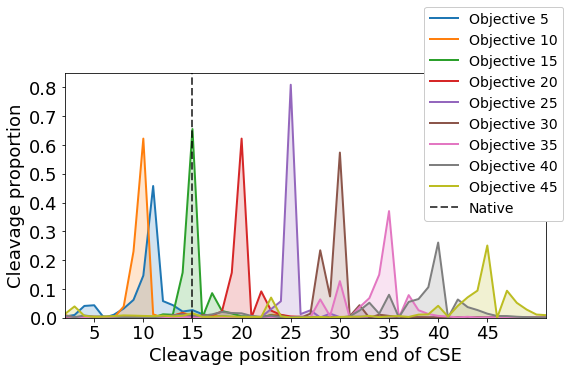

Max cut profile


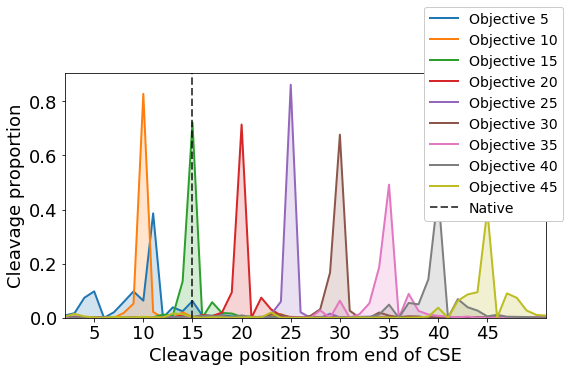

Mean cut map


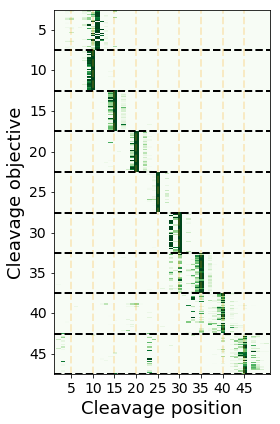

Max cut map


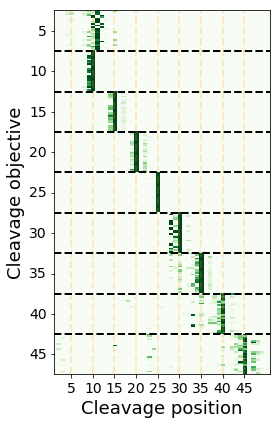

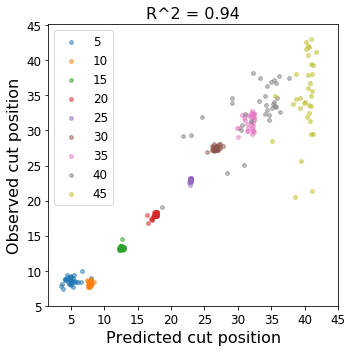

In [15]:
#Mean and Max statistics over A aruns subexperiments

cut_nt = 'A'
aruns_objective = '_aruns'
ggcc_objective = '_GGCC'
cut_to_subexperiment = {
    5 : [cut_nt + aruns_objective + '_60', cut_nt + aruns_objective + '_ent_60'],
    10 : [cut_nt + aruns_objective + '_65', cut_nt + aruns_objective + '_ent_65'],
    15 : [cut_nt + aruns_objective + '_70', cut_nt + aruns_objective + '_ent_70'],
    20 : [cut_nt + aruns_objective + '_75', cut_nt + aruns_objective + '_ent_75'],
    25 : [cut_nt + aruns_objective + '_80', cut_nt + aruns_objective + '_ent_80'],
    30 : [cut_nt + ggcc_objective + aruns_objective + '_85', cut_nt + ggcc_objective + aruns_objective + '_ent_85'],
    35 : [cut_nt + ggcc_objective + aruns_objective + '_90', cut_nt + ggcc_objective + aruns_objective + '_ent_90'],
    40 : [cut_nt + ggcc_objective + aruns_objective + '_95', cut_nt + ggcc_objective + aruns_objective + '_ent_95'],
    45 : [cut_nt + ggcc_objective + aruns_objective + '_100', cut_nt + ggcc_objective + aruns_objective + '_ent_100'],
}

print('Mean cut profile')
plot_cut_profile(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(8, 5.5), save_fig_name=None, fig_dpi=150, plot_mode='mean', n_samples=None)#save_fig_name='cut_profile_subexp_aruns_mean'
print('Max cut profile')
plot_cut_profile(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(8, 5.5), save_fig_name=None, fig_dpi=150, plot_mode='max', n_samples=5)#save_fig_name='cut_profile_subexp_aruns_max'

print('Mean cut map')
plot_cut_map(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(4, 6), save_fig_name=None, fig_dpi=150, plot_mode='mean', n_samples=100)#save_fig_name='cut_map_subexp_aruns_mean'
print('Max cut map')
plot_cut_map(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, figsize=(4, 6), save_fig_name=None, fig_dpi=150, plot_mode='max', n_samples=25)#save_fig_name='cut_map_subexp_aruns_max'

plot_position_scatter(cut_df_filtered, cut_to_subexperiment, cut_poses, objective_poses, human_cutprob, variant_filter="variant == 'wt' or variant == 'sampled'", figsize=(5, 5), save_fig_name=None, fig_dpi=150)#save_fig_name='avgcut_pred_vs_true_subexp_aruns'


<h2>Detailed Max Cut analysis</h2>

In [16]:
max_cut_pwm_dict, max_cut_yhat_dict = load_max_cut_pwms()


In [17]:
#Un-comment to generate Max Cut- sequences for folding

#Max Cut Sequences
#cut_df_filtered['fold_pos'] = cut_df_filtered['subexperiment'].apply(lambda exp: int(exp.split('_')[-1]) + 1)
#cut_df_filtered.reset_index()[['master_seq', 'fold_pos']].to_csv('folding/array_maxcut_seqs.csv', sep=',', index=False)

#Max Cut SNV Sequences
#cut_snv_df_filtered['fold_pos'] = cut_snv_df_filtered['subexperiment'].apply(lambda exp: int(exp.split('_')[-1]) + 1)
#cut_snv_df_filtered.reset_index()[['master_seq', 'fold_pos']].to_csv('folding/array_maxcut_snv_seqs.csv', sep=',', index=False)


In [18]:
#Read folded Max Cut- sequences
cut_fold_df = pd.read_csv('folding/array_maxcut_seqs_folded.csv', sep=',')[['master_seq', 'mfe', 'struct']].set_index('master_seq')
cut_df_filtered_folded = cut_df_filtered.join(cut_fold_df, on='master_seq', how='inner')

#Read folded Mac Cut SNV- sequences
cut_snv_fold_df = pd.read_csv('folding/array_maxcut_snv_seqs_folded.csv', sep=',')[['master_seq', 'mfe', 'struct']].set_index('master_seq')
cut_snv_df_filtered_folded = cut_snv_df_filtered.join(cut_snv_fold_df, on='master_seq', how='inner')
cut_snv_df_filtered_folded = cut_snv_df_filtered_folded.join(cut_df_filtered_folded.set_index('master_seq'), on='wt_seq', how='inner', rsuffix='_wt')

<h2>Best Max Cut sequences ('A' subexperiment)</h2>

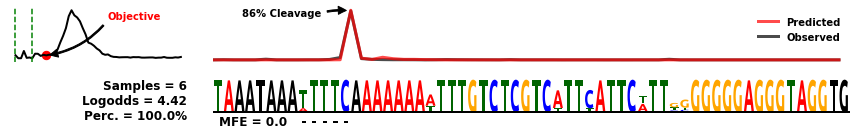

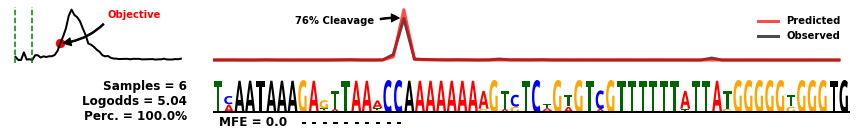

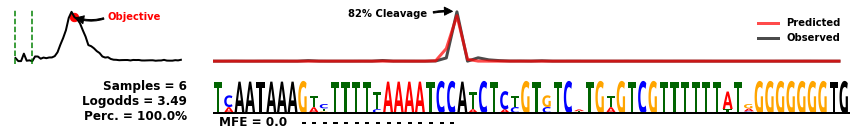

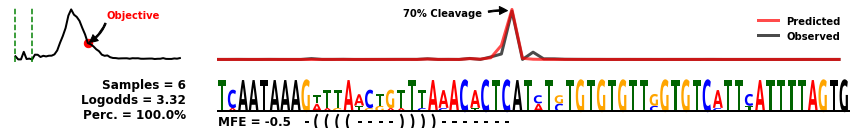

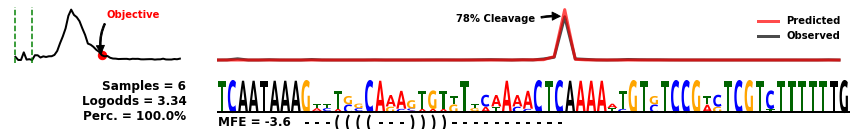

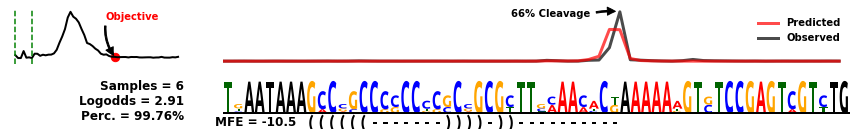

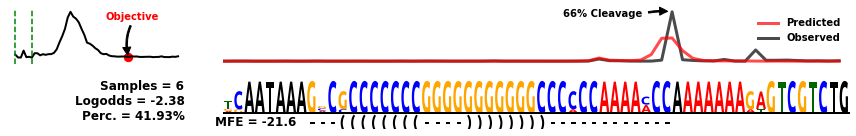

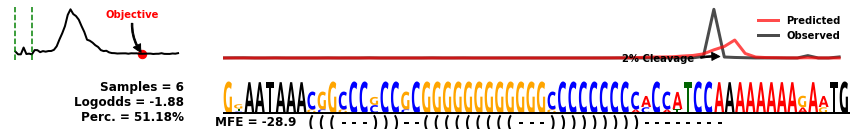

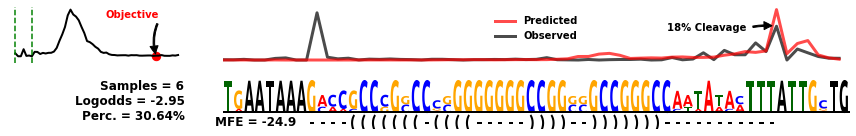

In [19]:

df_human = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")

cut_nt = 'A'
aruns_objective = ''
ggcc_objective = '_GGCC'
subexperiments = [
    [cut_nt + aruns_objective + '_60'],#, cut_nt + aruns_objective + '_ent_60'
    [cut_nt + aruns_objective + '_65'],#, cut_nt + aruns_objective + '_ent_65'],
    [cut_nt + aruns_objective + '_70'],#, cut_nt + aruns_objective + '_ent_70'],
    [cut_nt + aruns_objective + '_75'],#, cut_nt + aruns_objective + '_ent_75'],
    [cut_nt + aruns_objective + '_80'],#, cut_nt + aruns_objective + '_ent_80'],
    [cut_nt + ggcc_objective + aruns_objective + '_85'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_85'],
    [cut_nt + ggcc_objective + aruns_objective + '_90'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_90'],
    [cut_nt + ggcc_objective + aruns_objective + '_95'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_95'],
    [cut_nt + ggcc_objective + aruns_objective + '_100'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_100'],
]


true_column='median_proximal_vs_distal_logodds_true'
cut_column='cut_prob_true'

usage_unit = 'log'

plot_mean_logo=False
plot_max_logo=True
plot_actual_pwm=True
plot_opt_pwm=False

black_fixed_seq=True

#plot_start=15
#plot_end=110
#figsize=(14,2)
#width_ratios=[2, 1, 14]
#logo_height = 0.85
plot_start=48
plot_end=108
figsize=(12,2)
width_ratios=[4, 1, 14]
logo_height = 0.85

plot_percentile=True
override_mean_stats=False

max_index=0
normalize_probs = True
normalize_range = [plot_start, plot_end]#None
agg_mode = 'avg'

annotate_peaks=True

plot_mfe=True
fold_height=0.7

save_figs=False

for i, subexperiment in enumerate(subexperiments) :
    plot_cut_logo(cut_df_filtered_folded.query("gene == 'simple'").reset_index(), df_human, max_cut_pwm_dict, max_cut_yhat_dict, 'simple', subexperiment, plot_mfe=plot_mfe, fold_height=fold_height, annotate_peaks=annotate_peaks, normalize_probs=normalize_probs, normalize_range=normalize_range, agg_mode=agg_mode, override_mean_stats=override_mean_stats, plot_percentile=plot_percentile, plot_mean_logo=plot_mean_logo, plot_max_logo=plot_max_logo, plot_actual_pwm=plot_actual_pwm, plot_opt_pwm=plot_opt_pwm, black_fixed_seq=black_fixed_seq, max_index=max_index, true_column=true_column, cut_column=cut_column, figsize=figsize, width_ratios=width_ratios, logo_height=logo_height, usage_unit=usage_unit, plot_snvs=False, seq_trim_start=0, seq_trim_end=164, plot_start=plot_start, plot_end=plot_end, pas_downscaling=1.0, save_figs=save_figs, fig_name='max_cut_' + subexperiment[0], fig_dpi=300)

<h2>Best Max Cut sequences ('AT' subexperiment)</h2>

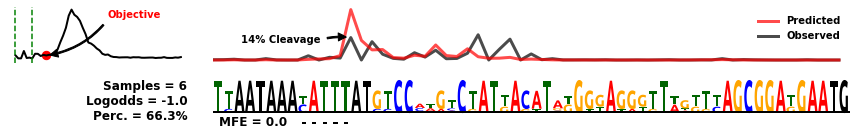

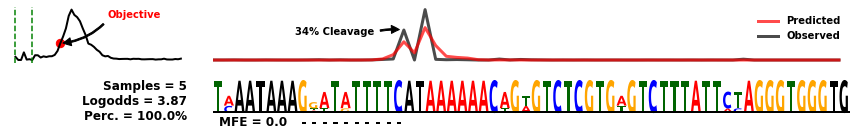

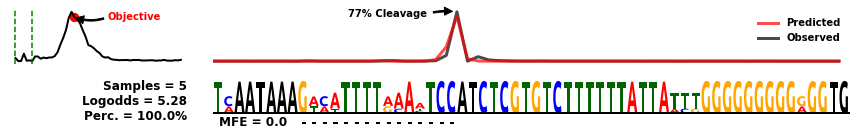

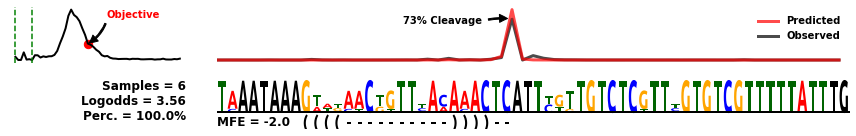

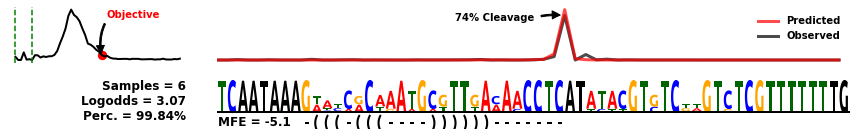

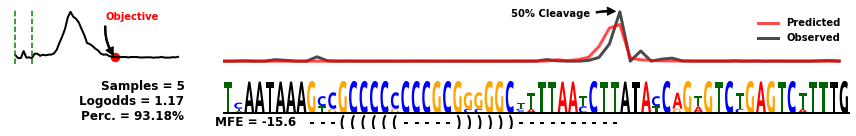

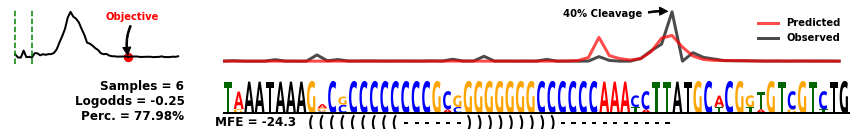

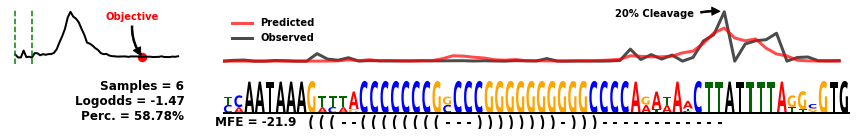

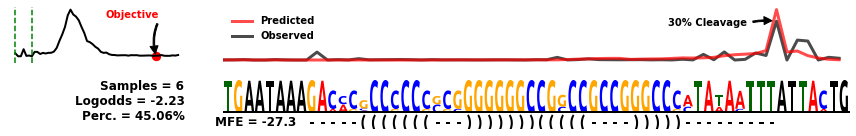

In [20]:

df_human = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")

cut_nt = 'AT'
aruns_objective = ''
ggcc_objective = '_GGCC'
subexperiments = [
    [cut_nt + aruns_objective + '_60'],#, cut_nt + aruns_objective + '_ent_60'
    [cut_nt + aruns_objective + '_65'],#, cut_nt + aruns_objective + '_ent_65'],
    [cut_nt + aruns_objective + '_70'],#, cut_nt + aruns_objective + '_ent_70'],
    [cut_nt + aruns_objective + '_75'],#, cut_nt + aruns_objective + '_ent_75'],
    [cut_nt + aruns_objective + '_80'],#, cut_nt + aruns_objective + '_ent_80'],
    [cut_nt + ggcc_objective + aruns_objective + '_85'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_85'],
    [cut_nt + ggcc_objective + aruns_objective + '_90'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_90'],
    [cut_nt + ggcc_objective + aruns_objective + '_95'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_95'],
    [cut_nt + ggcc_objective + aruns_objective + '_100'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_100'],
]


true_column='median_proximal_vs_distal_logodds_true'
cut_column='cut_prob_true'

usage_unit = 'log'

plot_mean_logo=False
plot_max_logo=True
plot_actual_pwm=True
plot_opt_pwm=False

black_fixed_seq=True

#plot_start=15
#plot_end=110
#figsize=(14,2)
#width_ratios=[2, 1, 14]
#logo_height = 0.85
plot_start=48
plot_end=108
figsize=(12,2)
width_ratios=[4, 1, 14]
logo_height = 0.85

plot_percentile=True
override_mean_stats=False

max_index=0
normalize_probs = True
normalize_range = [plot_start, plot_end]#None
agg_mode = 'avg'

annotate_peaks=True

plot_mfe=True
fold_height=0.7

save_figs=False

for i, subexperiment in enumerate(subexperiments) :
    plot_cut_logo(cut_df_filtered_folded.query("gene == 'simple'").reset_index(), df_human, max_cut_pwm_dict, max_cut_yhat_dict, 'simple', subexperiment, plot_mfe=plot_mfe, fold_height=fold_height, annotate_peaks=annotate_peaks, normalize_probs=normalize_probs, normalize_range=normalize_range, agg_mode=agg_mode, override_mean_stats=override_mean_stats, plot_percentile=plot_percentile, plot_mean_logo=plot_mean_logo, plot_max_logo=plot_max_logo, plot_actual_pwm=plot_actual_pwm, plot_opt_pwm=plot_opt_pwm, black_fixed_seq=black_fixed_seq, max_index=max_index, true_column=true_column, cut_column=cut_column, figsize=figsize, width_ratios=width_ratios, logo_height=logo_height, usage_unit=usage_unit, plot_snvs=False, seq_trim_start=0, seq_trim_end=164, plot_start=plot_start, plot_end=plot_end, pas_downscaling=1.0, save_figs=save_figs, fig_name='max_cut_' + subexperiment[0], fig_dpi=300)

<h2>Best Max Cut sequences ('Punish A-runs' subexperiment)</h2>

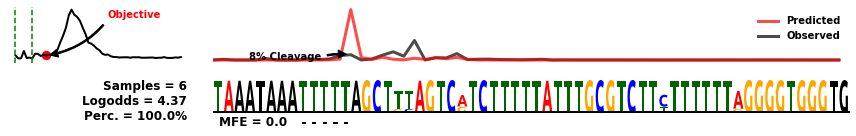

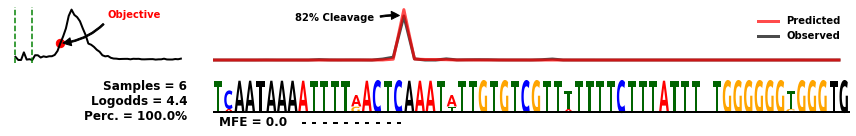

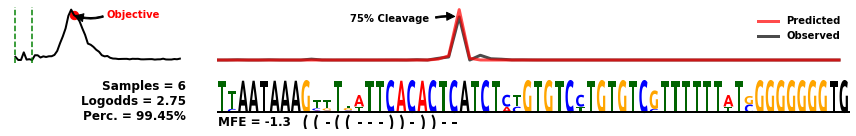

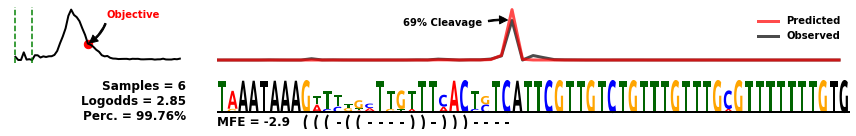

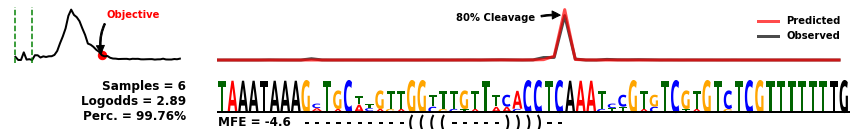

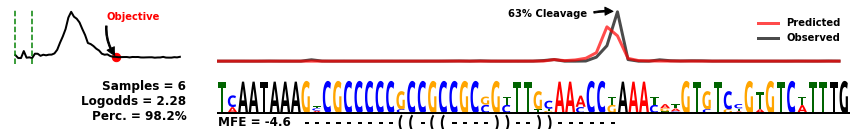

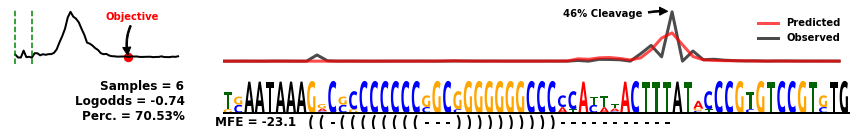

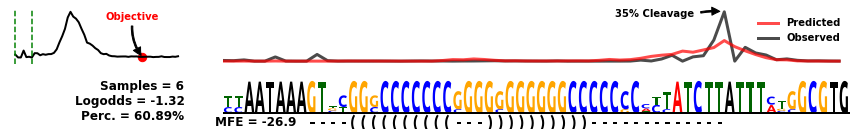

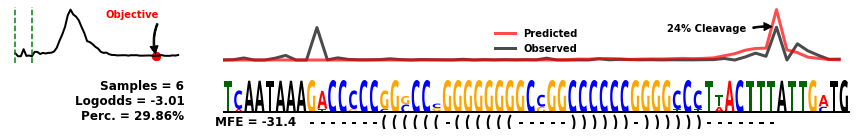

In [21]:

df_human = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")

cut_nt = 'A'
aruns_objective = '_aruns'
ggcc_objective = '_GGCC'
subexperiments = [
    [cut_nt + aruns_objective + '_60'],#, cut_nt + aruns_objective + '_ent_60'
    [cut_nt + aruns_objective + '_65'],#, cut_nt + aruns_objective + '_ent_65'],
    [cut_nt + aruns_objective + '_70'],#, cut_nt + aruns_objective + '_ent_70'],
    [cut_nt + aruns_objective + '_75'],#, cut_nt + aruns_objective + '_ent_75'],
    [cut_nt + aruns_objective + '_80'],#, cut_nt + aruns_objective + '_ent_80'],
    [cut_nt + ggcc_objective + aruns_objective + '_85'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_85'],
    [cut_nt + ggcc_objective + aruns_objective + '_90'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_90'],
    [cut_nt + ggcc_objective + aruns_objective + '_95'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_95'],
    [cut_nt + ggcc_objective + aruns_objective + '_100'],#, cut_nt + ggcc_objective + aruns_objective + '_ent_100'],
]


true_column='median_proximal_vs_distal_logodds_true'
cut_column='cut_prob_true'

usage_unit = 'log'

plot_mean_logo=False
plot_max_logo=True
plot_actual_pwm=True
plot_opt_pwm=False

black_fixed_seq=True

#plot_start=15
#plot_end=110
#figsize=(14,2)
#width_ratios=[2, 1, 14]
#logo_height = 0.85
plot_start=48
plot_end=108
figsize=(12,2)
width_ratios=[4, 1, 14]
logo_height = 0.85

plot_percentile=True
override_mean_stats=False

max_index=0
normalize_probs = True
normalize_range = [plot_start, plot_end]#None
agg_mode = 'avg'

annotate_peaks=True

plot_mfe=True
fold_height=0.7

save_figs=False

for i, subexperiment in enumerate(subexperiments) :
    plot_cut_logo(cut_df_filtered_folded.query("gene == 'simple'").reset_index(), df_human, max_cut_pwm_dict, max_cut_yhat_dict, 'simple', subexperiment, plot_mfe=plot_mfe, fold_height=fold_height, annotate_peaks=annotate_peaks, normalize_probs=normalize_probs, normalize_range=normalize_range, agg_mode=agg_mode, override_mean_stats=override_mean_stats, plot_percentile=plot_percentile, plot_mean_logo=plot_mean_logo, plot_max_logo=plot_max_logo, plot_actual_pwm=plot_actual_pwm, plot_opt_pwm=plot_opt_pwm, black_fixed_seq=black_fixed_seq, max_index=max_index, true_column=true_column, cut_column=cut_column, figsize=figsize, width_ratios=width_ratios, logo_height=logo_height, usage_unit=usage_unit, plot_snvs=False, seq_trim_start=0, seq_trim_end=164, plot_start=plot_start, plot_end=plot_end, pas_downscaling=1.0, save_figs=save_figs, fig_name='max_cut_' + subexperiment[0], fig_dpi=300)

<h2>Max Cut sequences with Saturation Mutagenesis measurements</h2>

9


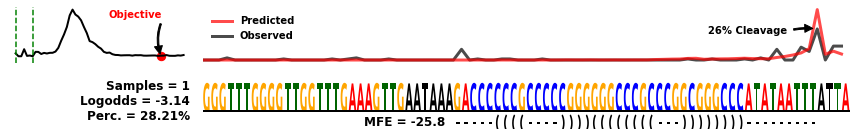

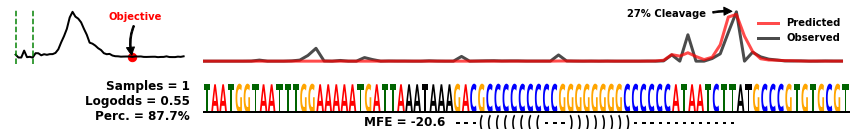

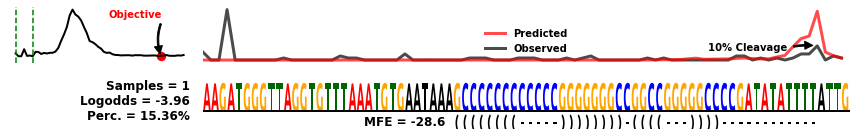

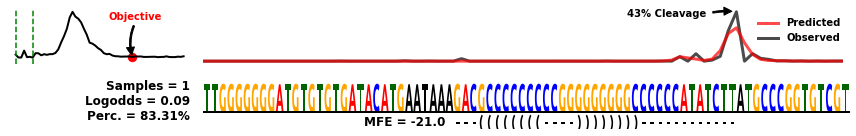

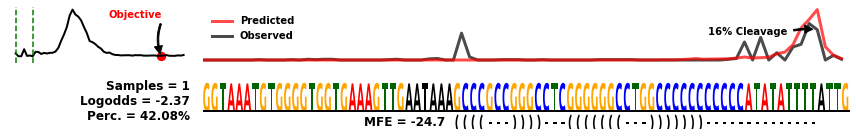

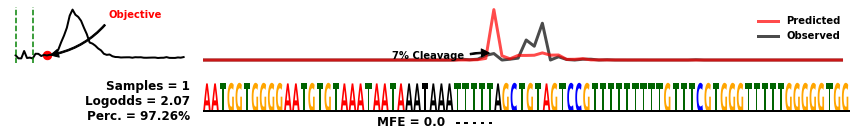

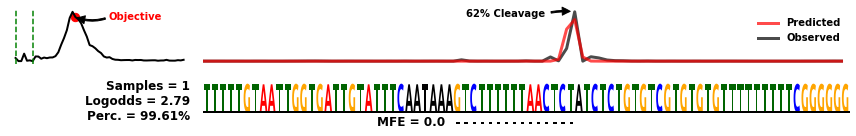

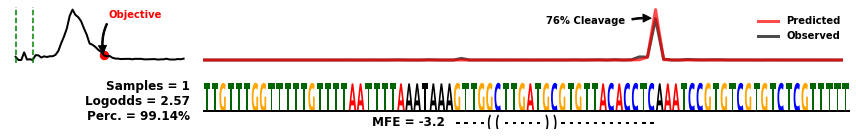

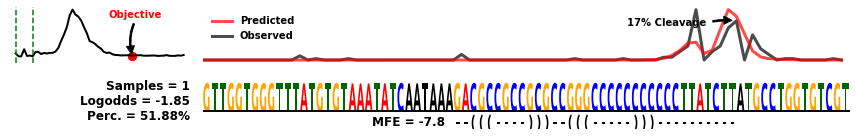

In [22]:
df_human = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")

true_column='median_proximal_vs_distal_logodds_true'
cut_column='cut_prob_true'

usage_unit = 'log'

plot_mean_logo=False
plot_max_logo=True
plot_actual_pwm=True
plot_opt_pwm=False

black_fixed_seq=True

plot_start=25
plot_end=105
figsize=(12,2)
width_ratios=[4, 1, 14]
logo_height = 0.75

plot_percentile=True
override_mean_stats=False

max_index=0
normalize_probs = True
normalize_range = [plot_start, plot_end]#None
agg_mode = 'avg'

annotate_peaks=True

plot_mfe=True
fold_height=0.7

save_figs=False

snv_distinct_seqs = cut_snv_df_filtered['wt_seq'].unique()

cut_df_filtered_folded_sel = cut_df_filtered_folded.loc[cut_df_filtered_folded.wt_seq.isin(snv_distinct_seqs)]
print(len(cut_df_filtered_folded_sel))

for subexperiment_i, subexperiment in enumerate(sorted(cut_snv_df_filtered['subexperiment'].unique())) :

    plot_cut_logo(cut_df_filtered_folded_sel.query("gene == 'simple'").reset_index(), df_human, max_cut_pwm_dict, max_cut_yhat_dict, 'simple', [subexperiment], plot_mfe=plot_mfe, fold_height=fold_height, annotate_peaks=annotate_peaks, normalize_probs=normalize_probs, normalize_range=normalize_range, agg_mode=agg_mode, override_mean_stats=override_mean_stats, plot_percentile=plot_percentile, plot_mean_logo=plot_mean_logo, plot_max_logo=plot_max_logo, plot_actual_pwm=plot_actual_pwm, plot_opt_pwm=plot_opt_pwm, black_fixed_seq=black_fixed_seq, max_index=max_index, true_column=true_column, cut_column=cut_column, figsize=figsize, width_ratios=width_ratios, logo_height=logo_height, usage_unit=usage_unit, plot_snvs=False, seq_trim_start=0, seq_trim_end=164, plot_start=plot_start, plot_end=plot_end, pas_downscaling=1.0, save_figs=save_figs, fig_name='max_cut_' + subexperiment, fig_dpi=300)


<h2>Saturation Mutagenesis of a CSE+35 optimized Max Cut Sequence</h2>

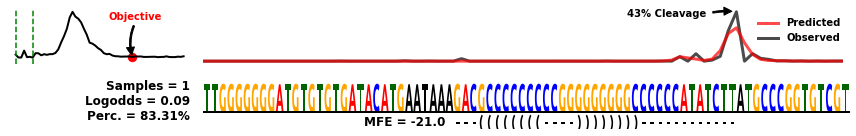

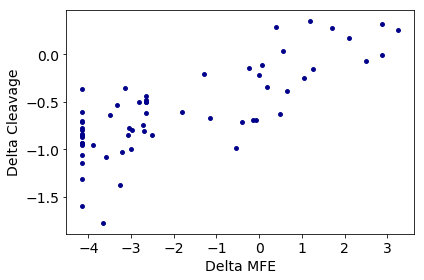

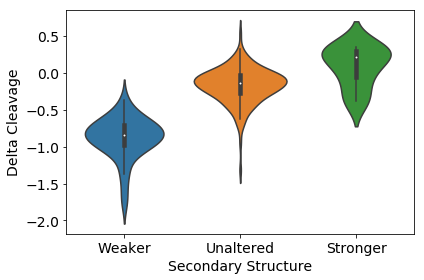

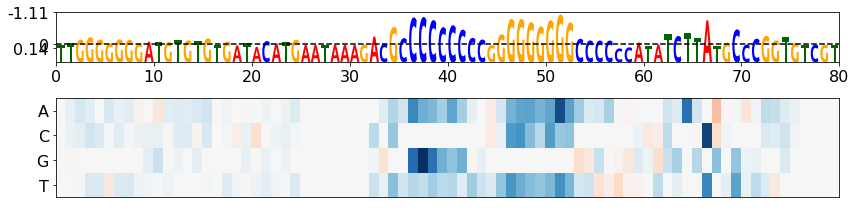

In [23]:
df_human = seq_df_filtered.query("experiment == 'clinvar_wt' and variant == 'wt'")

cut_nt = 'A'
aruns_objective = '_aruns'
ggcc_objective = '_GGCC'
subexperiment = [cut_nt + ggcc_objective + aruns_objective + '_ent_90']

true_column='median_proximal_vs_distal_logodds_true'
cut_column='cut_prob_true'
pred_cut_column='cut_prob_pred'

usage_unit = 'log'

plot_mean_logo=False
plot_max_logo=True
plot_actual_pwm=True
plot_opt_pwm=False

black_fixed_seq=True

plot_start=25
plot_end=105
figsize=(12,2)
width_ratios=[4, 1, 14]
logo_height = 0.75

plot_percentile=True
override_mean_stats=False

max_index=0
normalize_probs = True
normalize_range = [plot_start, plot_end]
agg_mode = 'avg'

annotate_peaks=True

plot_mfe=True
fold_height=0.7

save_figs=False

snv_distinct_seqs = cut_snv_df_filtered['wt_seq'].unique()

cut_df_filtered_folded_sel = cut_df_filtered_folded.loc[cut_df_filtered_folded.wt_seq.isin(snv_distinct_seqs)]

plot_cut_logo(cut_df_filtered_folded_sel.query("gene == 'simple'").reset_index(), df_human, max_cut_pwm_dict, max_cut_yhat_dict, 'simple', subexperiment, plot_mfe=plot_mfe, fold_height=fold_height, annotate_peaks=annotate_peaks, normalize_probs=normalize_probs, normalize_range=normalize_range, agg_mode=agg_mode, override_mean_stats=override_mean_stats, plot_percentile=plot_percentile, plot_mean_logo=plot_mean_logo, plot_max_logo=plot_max_logo, plot_actual_pwm=plot_actual_pwm, plot_opt_pwm=plot_opt_pwm, black_fixed_seq=black_fixed_seq, max_index=max_index, true_column=true_column, cut_column=cut_column, figsize=figsize, width_ratios=width_ratios, logo_height=logo_height, usage_unit=usage_unit, plot_snvs=False, seq_trim_start=0, seq_trim_end=164, plot_start=plot_start, plot_end=plot_end, pas_downscaling=1.0, save_figs=save_figs, fig_name='max_cut_' + subexperiment[0], fig_dpi=300)

wt_seq = cut_snv_df_filtered_folded.query("subexperiment == '" + subexperiment[0] + "'")['wt_seq'].unique()[0]

snv_df = cut_snv_df_filtered_folded.loc[cut_snv_df_filtered_folded.wt_seq.str.contains(wt_seq)].copy()

obj_pos = int(subexperiment[0].split("_")[-1])

#Map SNV positions
snv_poses = []
for index, row in snv_df.iterrows() :
    
    snv_pos = -1
    seq = row['master_seq']
    wt_seq = row['wt_seq']
    
    for j in range(0, len(seq)) :
        if seq[j] != wt_seq[j] :
            snv_pos = j
            break
    
    snv_poses.append(snv_pos)

snv_df['snv_pos'] = snv_poses

snv_df = snv_df.query("((snv_pos > 0 and snv_pos < 50) or (snv_pos > 56 and snv_pos < 105))")# and snv_pos != " + str(obj_pos + 1))

#Calculate true variant and wt cut log odds
snv_df['norm_cuts'] = snv_df[cut_column].apply(lambda c: c[:plot_end] / np.sum(c[:plot_end]))
snv_df['cut_logodds'] = snv_df['norm_cuts'].apply(lambda c: np.sum(c[obj_pos:obj_pos+2]))
snv_df['cut_logodds'] = np.ravel(np.log(snv_df['cut_logodds'] / (1. - snv_df['cut_logodds'])))

snv_df['norm_cuts_wt'] = snv_df[cut_column + '_wt'].apply(lambda c: c[:plot_end] / np.sum(c[:plot_end]))
snv_df['cut_logodds_wt'] = snv_df['norm_cuts_wt'].apply(lambda c: np.sum(c[obj_pos:obj_pos+2]))
snv_df['cut_logodds_wt'] = np.ravel(np.log(snv_df['cut_logodds_wt'] / (1. - snv_df['cut_logodds_wt'])))

#Calculate predicted variant and wt cut log odds
snv_df['pred_norm_cuts'] = snv_df[pred_cut_column].apply(lambda c: c[:plot_end] / np.sum(c[:plot_end]))
snv_df['pred_cut_logodds'] = snv_df['pred_norm_cuts'].apply(lambda c: np.sum(c[obj_pos:obj_pos+2]))
snv_df['pred_cut_logodds'] = np.ravel(np.log(snv_df['pred_cut_logodds'] / (1. - snv_df['pred_cut_logodds'])))

snv_df['pred_norm_cuts_wt'] = snv_df[pred_cut_column + '_wt'].apply(lambda c: c[:plot_end] / np.sum(c[:plot_end]))
snv_df['pred_cut_logodds_wt'] = snv_df['pred_norm_cuts_wt'].apply(lambda c: np.sum(c[obj_pos:obj_pos+2]))
snv_df['pred_cut_logodds_wt'] = np.ravel(np.log(snv_df['pred_cut_logodds_wt'] / (1. - snv_df['pred_cut_logodds_wt'])))

#Calculate delta statistics (variant - wt)
snv_df['delta_mfe'] = snv_df['mfe'] - snv_df['mfe_wt']
snv_df['delta_logodds'] = snv_df['cut_logodds'] - snv_df['cut_logodds_wt']
snv_df['pred_delta_logodds'] = snv_df['pred_cut_logodds'] - snv_df['pred_cut_logodds_wt']




altered_struct = []
for index, row in snv_df.iterrows() :
    if row['struct'] != row['struct_wt'] and row['mfe'] < row['mfe_wt'] :
        altered_struct.append('Stronger')
    elif row['struct'] != row['struct_wt'] and row['mfe'] >= row['mfe_wt'] :
        altered_struct.append('Weaker')
    else :
        altered_struct.append('Unaltered')

snv_df['altered_struct'] = altered_struct

plot_df = snv_df.query("snv_pos != " + str(obj_pos + 1) + " and delta_mfe != 0")
violin_df = snv_df.query("snv_pos != " + str(obj_pos + 1))

#Plot scatter of SNV effects as a function of delta MFE
plt.figure(figsize=(6, 4))
plt.scatter(-1. * plot_df['delta_mfe'], plot_df['delta_logodds'], color = 'darkblue', s=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Delta MFE", fontsize=14)
plt.ylabel("Delta Cleavage", fontsize=14)
if save_figs :
    plt.savefig(subexperiment[0] + "_mfe_vs_logodds_scatter.eps")
    plt.savefig(subexperiment[0] + "_mfe_vs_logodds_scatter.png", transparent=True, dpi=150)
plt.tight_layout()
plt.show()

#Plot violinplot of SNV effects grouped by impact on secondary structure
plt.figure(figsize=(6, 4))
sns.violinplot(x="altered_struct", y="delta_logodds", data=violin_df, order=['Weaker', 'Unaltered', 'Stronger'])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Secondary Structure", fontsize=14)
plt.ylabel("Delta Cleavage", fontsize=14)
if save_figs :
    plt.savefig(subexperiment[0] + "_mfe_vs_logodds_violin.eps")
    plt.savefig(subexperiment[0] + "_mfe_vs_logodds_violin.png", transparent=True, dpi=150)
plt.tight_layout()
plt.show()

seq_start = 25#48
seq_end = 105#100

#Plot mutation map of fold-altering SNVs
mut_map_fold_snvs(
        snv_df,
        'MaxCut',
        experiment=subexperiment,
        delta_column='delta_logodds',
        mode='true',
        figsize=(12,3),
        seq_trim_start=seq_start, seq_trim_end=seq_end,
        plot_start=0, plot_end=seq_end-seq_start,
        cut_downscaling=0.5,
        fig_name=(subexperiment[0] + '_Mutmap_Logodds_Observed') if save_figs else None,
        fig_dpi=300
)


<h2>Absolute isoform predictions of Native Human pA sites</h2>

clinvar_wt = 1085


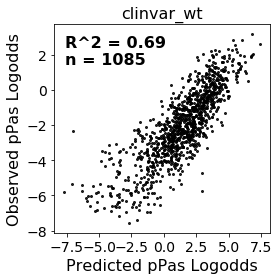

intronic_pas = 9800


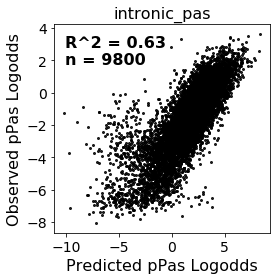

In [3]:
#Absolute native predictions, split by experiment

save_figs = False

pred_column = 'mean_logodds_pred'
true_column = 'pooled_proximal_logodds'

for experiment in ['clinvar_wt', 'intronic_pas'] :
    
    filter_query = "variant == 'wt' and mean_total_count >= 200 and n_barcodes >= 7 and experiment == '" + str(experiment) + "'"
    experiment_seq_predicted_isoform_df = seq_df.query(filter_query)
    
    logodds_true_is_nan = (np.isnan(experiment_seq_predicted_isoform_df[true_column]) | np.isinf(experiment_seq_predicted_isoform_df[true_column]))
    logodds_pred_is_nan = (np.isnan(experiment_seq_predicted_isoform_df[pred_column]) | np.isinf(experiment_seq_predicted_isoform_df[pred_column]))
    experiment_seq_predicted_isoform_df = experiment_seq_predicted_isoform_df.loc[(logodds_true_is_nan == False) & (logodds_pred_is_nan == False)]

    print(experiment + ' = ' + str(len(experiment_seq_predicted_isoform_df)))

    #Logodds proportions

    r_val, _ = pearsonr(experiment_seq_predicted_isoform_df[pred_column], experiment_seq_predicted_isoform_df[true_column])

    f = plt.figure(figsize=(4, 4))

    plt.scatter(experiment_seq_predicted_isoform_df[pred_column], experiment_seq_predicted_isoform_df[true_column], alpha=0.85, s=4, c='black')

    annot_text = 'R^2 = ' + str(round(r_val * r_val, 2))
    annot_text += '\nn = ' + str(len(experiment_seq_predicted_isoform_df))
    ax = plt.gca()
    ax.text(0.05, 0.95, annot_text, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes, color='black', fontsize=16, weight="bold")
    
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    plt.xlabel('Predicted pPas Logodds', fontsize=16)
    plt.ylabel('Observed pPas Logodds', fontsize=16)
    plt.title(experiment, fontsize=16)

    plt.tight_layout()

    if save_figs :
        plt.savefig('absolute_usage_pred_vs_true_' + experiment + '.png', transparent=True, dpi=150)
        plt.savefig('absolute_usage_pred_vs_true_' + experiment + '.eps')

    plt.show()

<h2>Summary ClinVar and ACMG variant analysis</h2>

In [3]:
variant_df_filtered = variant_df.query("n_barcodes_var >= 5 and n_barcodes_ref >= 5 and mean_total_count_var >= 200 and mean_total_count_ref >= 200")

#Filter on human variants
included_experiments = ['acmg_apadb', 'acmg_polyadb', 'sensitive_genes', 'clinvar_wt', 'human_variant']

filter_query = ""

for exp_index, included_experiment in enumerate(included_experiments) :
    filter_query += "experiment == '" + str(included_experiment) + "'"
    if exp_index < len(included_experiments) - 1 :
        filter_query += " or "

human_variant_df = variant_df.query(filter_query).copy()
human_variant_df_filtered = variant_df_filtered.query(filter_query).copy()

human_variant_df['delta_logodds_pred'] = human_variant_df['mean_delta_logodds_pred']
human_variant_df_filtered['delta_logodds_pred'] = human_variant_df_filtered['mean_delta_logodds_pred']


In [4]:
#Add native APADB isoform abundance measurements
apadb_df = pd.read_csv('../data/native_data/apadb/unprocessed_data/hg19.apadb_v2_final.bed', names=['chr', 'start', 'end', 'gene', 'reads', 'strand', 'site_type', 'cut_mean', 'cut_mode', 'mir'], sep='\t')

apadb_variant_df, apadb_variant_df_filtered = append_apadb_isoform_usage(apadb_df, human_variant_df, human_variant_df_filtered)


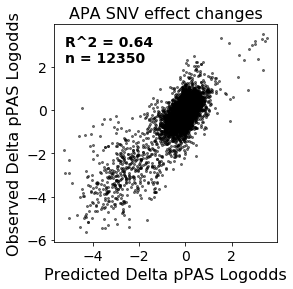

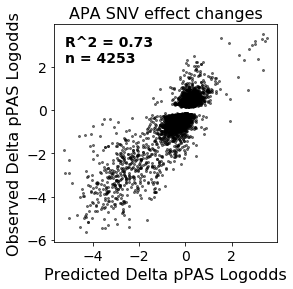

clinvar_wt = 5198


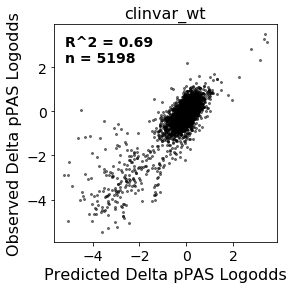

acmg_apadb = 3413


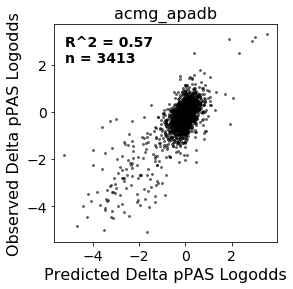

acmg_polyadb = 1748


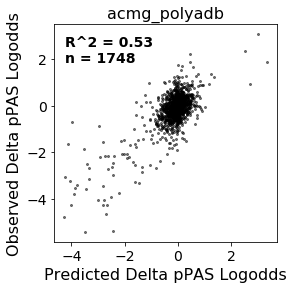

sensitive_genes = 1991


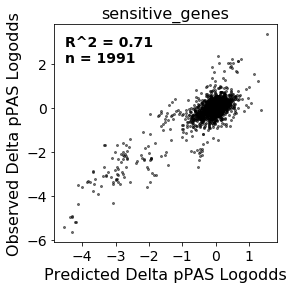

tgta = 4104


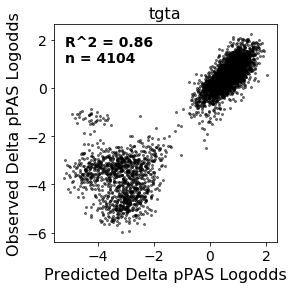

In [6]:
df_to_use = human_variant_df_filtered

save_figs = False

pred_column = 'mean_delta_logodds_pred'
true_column = 'delta_logodds_true'

#Logodds proportions

r_val, _ = pearsonr(df_to_use[pred_column], df_to_use[true_column])

f = plt.figure(figsize=(4, 4))

plt.scatter(df_to_use[pred_column], df_to_use[true_column], alpha=0.5, s=4, c='black')

annot_text = 'R^2 = ' + str(round(r_val * r_val, 2))
annot_text += '\nn = ' + str(len(df_to_use))
ax = plt.gca()
ax.text(0.05, 0.95, annot_text, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes, color='black', fontsize=14, weight="bold")


plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('Predicted Delta pPAS Logodds', fontsize=16)
plt.ylabel('Observed Delta pPAS Logodds', fontsize=16)
plt.title('APA SNV effect changes', fontsize=16)

#plt.tight_layout()

if save_figs :
    plt.savefig('delta_usage_pred_vs_true_all.png', dpi=150, transparent=True)
    plt.savefig('delta_usage_pred_vs_true_all.eps')

plt.show()


#Logodds proportions, statistically significant difference
df_to_use = human_variant_df_filtered.query("delta_p_val < 0.0001")

r_val, _ = pearsonr(df_to_use[pred_column], df_to_use[true_column])

f = plt.figure(figsize=(4, 4))

plt.scatter(df_to_use[pred_column], df_to_use[true_column], alpha=0.5, s=4, c='black')

annot_text = 'R^2 = ' + str(round(r_val * r_val, 2))
annot_text += '\nn = ' + str(len(df_to_use))
ax = plt.gca()
ax.text(0.05, 0.95, annot_text, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes, color='black', fontsize=14, weight="bold")


plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlabel('Predicted Delta pPAS Logodds', fontsize=16)
plt.ylabel('Observed Delta pPAS Logodds', fontsize=16)
plt.title('APA SNV effect changes', fontsize=16)

#plt.tight_layout()

if save_figs :
    plt.savefig('delta_usage_pred_vs_true_significant.png', dpi=150, transparent=True)
    plt.savefig('delta_usage_pred_vs_true_significant.eps')

plt.show()




#Split by experiment
df_to_use = variant_df_filtered

for experiment in ['clinvar_wt', 'acmg_apadb', 'acmg_polyadb', 'sensitive_genes', 'tgta'] :
    
    experiment_seq_predicted_isoform_df = df_to_use.query("experiment == '" + str(experiment) + "'")

    print(experiment + ' = ' + str(len(experiment_seq_predicted_isoform_df)))

    #Logodds proportions

    r_val, _ = pearsonr(experiment_seq_predicted_isoform_df[pred_column], experiment_seq_predicted_isoform_df[true_column])

    f = plt.figure(figsize=(4, 4))

    plt.scatter(experiment_seq_predicted_isoform_df[pred_column], experiment_seq_predicted_isoform_df[true_column], alpha=0.5, s=4, c='black')

    annot_text = 'R^2 = ' + str(round(r_val * r_val, 2))
    annot_text += '\nn = ' + str(len(experiment_seq_predicted_isoform_df))
    ax = plt.gca()
    ax.text(0.05, 0.95, annot_text, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes, color='black', fontsize=14, weight="bold")


    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    plt.xlabel('Predicted Delta pPAS Logodds', fontsize=16)
    plt.ylabel('Observed Delta pPAS Logodds', fontsize=16)
    plt.title(experiment, fontsize=16)

    #plt.tight_layout()

    if save_figs :
        plt.savefig('delta_usage_pred_vs_true_' + str(experiment) + '.png', dpi=150, transparent=True)
        plt.savefig('delta_usage_pred_vs_true_' + str(experiment) + '.eps')

    plt.show()



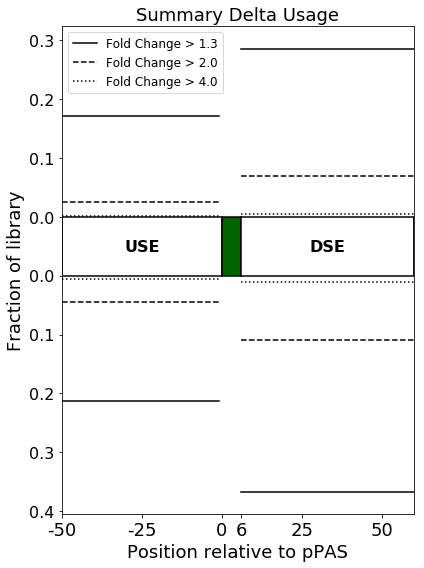

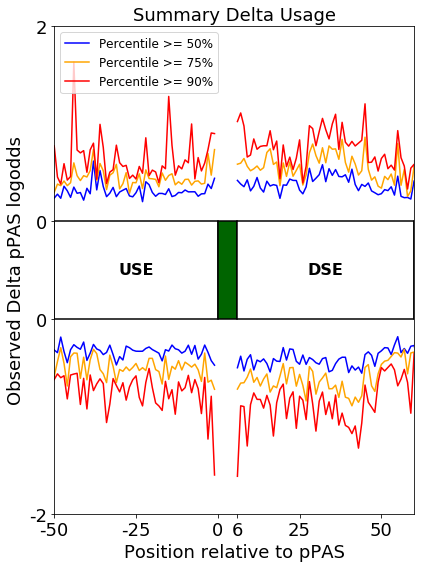

In [28]:
save_figs = False

df_to_use = human_variant_df_filtered.set_index('master_seq')
figsize=(6, 8)

fig_name = None
if save_figs :
    fig_name = 'count_region_all'
plot_count_regions(df_to_use, no_denovo=True, plot_frac=True, count_vs_all=False, annotation_height=0.1, significance_level=0.01, delta_threshes=[0.3, 0.693, 1.3863], delta_linestyles=['-', '--', ':'], figsize=figsize, fig_name=fig_name, plot_start=-50, plot_end=100, fig_dpi=150, pred_column='delta_logodds_pred', true_column='delta_logodds_true', snv_pos_column='snv_pos')


fig_name = None
if save_figs :
    fig_name = 'perc_pos_all'
plot_perc_positions(df_to_use, no_denovo=True, significance_level=0.01, percentiles=[0.5, 0.75, 0.90], percentile_colors=['blue', 'orange', 'red'], figsize=figsize, fig_name=fig_name, plot_start=-50, plot_end=100, fig_dpi=150, pred_column='delta_logodds_pred', true_column='delta_logodds_true', snv_pos_column='snv_pos')



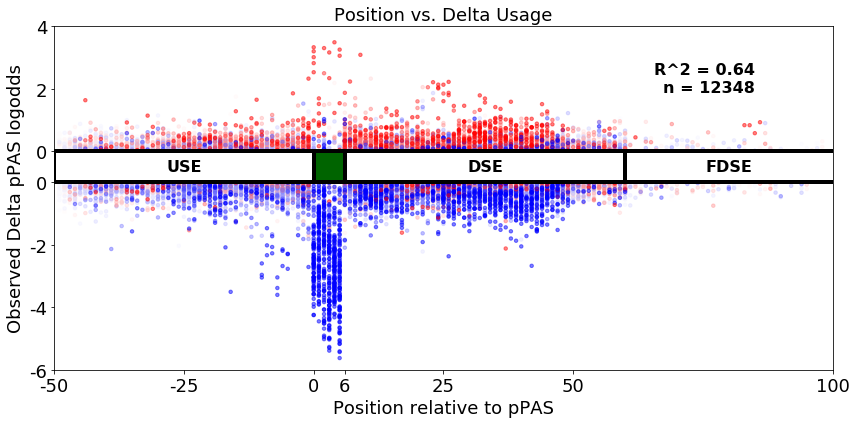

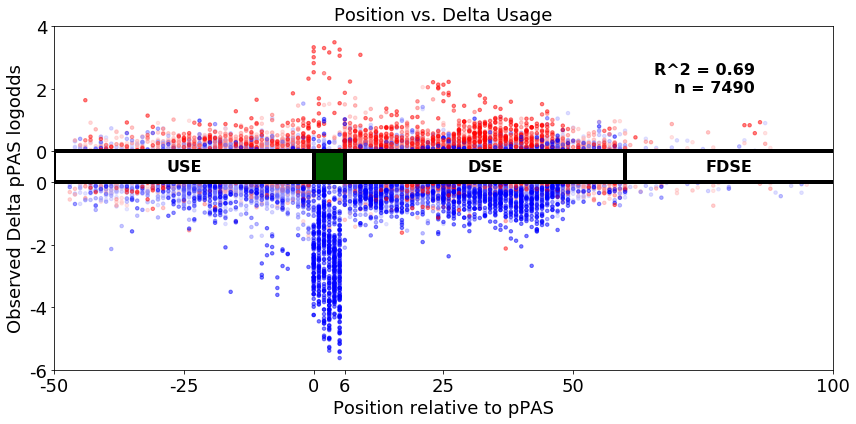

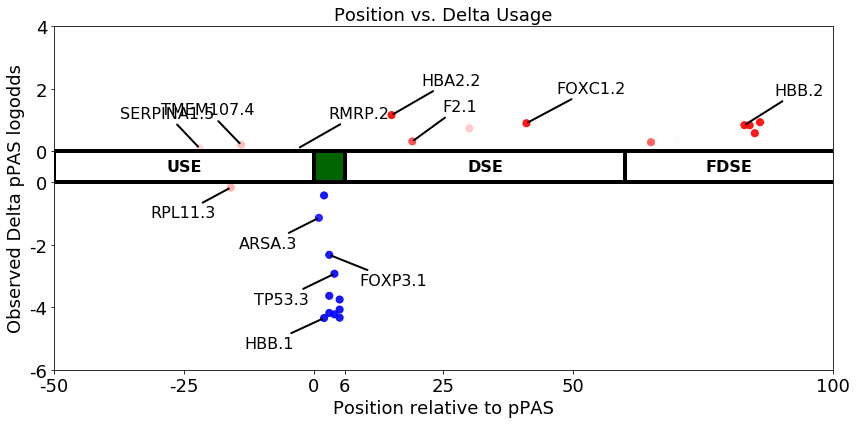

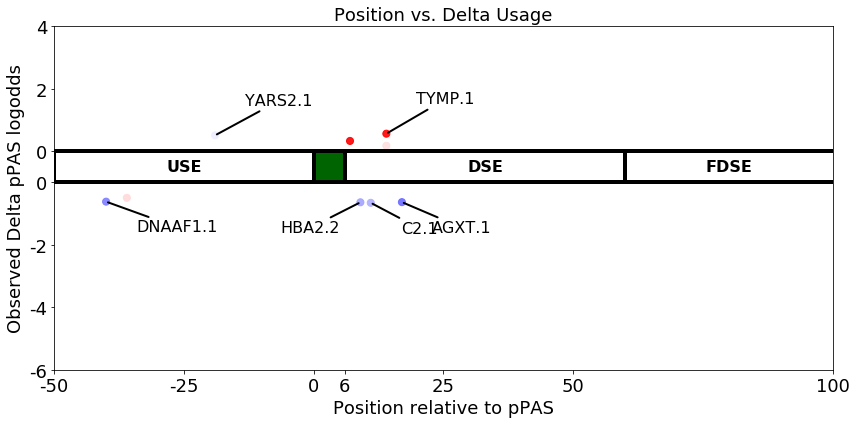

In [7]:

save_figs = False

#All variants
df_to_use = human_variant_df_filtered

figsize=(12, 6)

fig_name = None
if save_figs :
    fig_name = 'position_delta_all'
plot_position_delta_scatter(df_to_use, pred_column=['mean_delta_logodds_pred'], min_pred_filter=0.0, figsize=figsize, fig_name=fig_name, vmin=-0.5, vmax=0.5, fig_dpi=150, annotate=None)



#Filtered on prediction >= 0.1 (log)
df_to_use = human_variant_df_filtered

fig_name = None
if save_figs :
    fig_name = 'position_delta_all_pred_ge_01'
plot_position_delta_scatter(df_to_use, pred_column=['mean_delta_logodds_pred'], min_pred_filter=0.1, figsize=figsize, fig_name=fig_name, vmin=-0.5, vmax=0.5, fig_dpi=150, annotate=None)


#Annotate pathogenic variants
bg_df = human_variant_df_filtered

pathogenic_df = human_variant_df.query("significance == 'Pathogenic'")

gene_blacklist = [('RNU4ATAC.4', 200.0), ('HBB.3', 200), ('HBB.4', 200)]

keep_index = []
for index, row in pathogenic_df.iterrows() :
    blacklisted = False
    
    for filter_gene, filter_pos in gene_blacklist :
        if row['gene'] == filter_gene and row['snv_pos'] < filter_pos :
            blacklisted = True
    
    if not blacklisted :
        keep_index.append(index)

pathogenic_df = pathogenic_df.loc[keep_index]

annotate = {
    'annotate_right_list' : ['F2.1', 'FOXC1.2', 'RMRP.2', 'HBB.2', 'HBA2.2'],
    'annotate_right_down_list' : ['FOXP3.1', 'RNU4ATAC.4'],
    'annotate_left_list' : ['HBB.3', 'HBB.4', 'TMEM107.4', 'SERPINA1.5'],
    'annotate_left_down_list' : ['HBB.1', 'TP53.3', 'ARSA.3', 'RPL11.3']
}

fig_name = None
if save_figs :
    fig_name = 'position_delta_pathogenic'
plot_position_delta_scatter(pathogenic_df, pred_column=['mean_delta_logodds_pred'], min_pred_filter=0.0, figsize=figsize, dot_size=50, dot_alpha=0.9, vmin=-0.5, vmax=0.45, show_stats=False, fig_name=fig_name, fig_dpi=150, annotate=annotate, bg_df=None)


#Annotate conflicting variants, stat. significant only
bg_df = human_variant_df_filtered

conflicting_df = human_variant_df.query("significance == 'Conflicting' and delta_p_val < 0.05")

gene_blacklist = []
keep_index = []
for index, row in conflicting_df.iterrows() :
    blacklisted = False
    
    for filter_gene, filter_pos in gene_blacklist :
        if row['gene'] == filter_gene and row['snv_pos'] < filter_pos :
            blacklisted = True
    
    if not blacklisted :
        keep_index.append(index)

conflicting_df = conflicting_df.loc[keep_index]

annotate = {
    'annotate_right_list' : ['TYMP.1', 'TAF1C.1', 'YARS2.1'],
    'annotate_right_down_list' : ['C2.1', 'AGXT.1', 'DNAAF1.1'],
    'annotate_left_list' : ['APRT.2'],
    'annotate_left_down_list' : ['HBA2.2', 'MOCS2.6', 'GYS1.3']
}

fig_name = None
if save_figs :
    fig_name = 'position_delta_conflicting_significant'
plot_position_delta_scatter(conflicting_df, pred_column=['mean_delta_logodds_pred'], min_pred_filter=0.0, figsize=figsize, dot_size=50, dot_alpha=0.9, vmin=-0.5, vmax=0.5, show_stats=False, fig_name=fig_name, fig_dpi=150, annotate=annotate, bg_df=None)


In [8]:
p_thresh = 0.0001
delta_thresh = 0.693
#delta_thresh = 1.386

#Calculate summary variant statistics

#df_to_use = human_variant_df_filtered.copy()
df_to_use = human_variant_df_filtered.query("pooled_proximal_logodds_ref >= -3.0 and pooled_proximal_logodds_ref <= 3.0").copy()

df_to_use['delta_logodds_pred'] = df_to_use['mean_delta_logodds_pred']

delta_pred_thresh = 0.05
df_to_use = df_to_use.query("delta_logodds_pred < -" + str(delta_pred_thresh) + " or delta_logodds_pred > " + str(delta_pred_thresh))


df_gene = df_to_use
df_gene_nopas = df_to_use.query("snv_pos < 50 or snv_pos > 55")

df_gene_signi = df_gene.query("delta_p_val < " + str(p_thresh) + " and (delta_logodds_true < -" + str(delta_thresh) + " or delta_logodds_true > " + str(delta_thresh) + ")")
df_gene_signi_nopas = df_gene_nopas.query("delta_p_val < " + str(p_thresh) + " and (delta_logodds_true < -" + str(delta_thresh) + " or delta_logodds_true > " + str(delta_thresh) + ")")

df_gene_signi_use = df_gene_signi_nopas.query("snv_pos < 50")
df_gene_signi_dse = df_gene_signi_nopas.query("snv_pos > 55")

n_variants = len(df_gene)
n_variants_nopas = len(df_gene_nopas)
n_variants_signi = len(df_gene_signi)
n_variants_signi_nopas = len(df_gene_signi_nopas)

n_variants_use = len(df_gene.query("snv_pos < 50"))
n_variants_use_nopas = len(df_gene_nopas.query("snv_pos < 50"))
n_variants_use_signi = len(df_gene_signi.query("snv_pos < 50"))
n_variants_use_signi_nopas = len(df_gene_signi_nopas.query("snv_pos < 50"))

n_variants_dse = len(df_gene.query("snv_pos > 55"))
n_variants_dse_nopas = len(df_gene_nopas.query("snv_pos > 55"))
n_variants_dse_signi = len(df_gene_signi.query("snv_pos > 55"))
n_variants_dse_signi_nopas = len(df_gene_signi_nopas.query("snv_pos > 55"))

r_val, _ = pearsonr(df_gene['delta_logodds_pred'], df_gene['delta_logodds_true'])
r2 = round(r_val * r_val, 2)
r_val_nopas, _ = pearsonr(df_gene_nopas['delta_logodds_pred'], df_gene_nopas['delta_logodds_true'])
r2_nopas = round(r_val_nopas * r_val_nopas, 2)

r_val, _ = pearsonr(df_gene_signi['delta_logodds_pred'], df_gene_signi['delta_logodds_true'])
r2_signi = round(r_val * r_val, 2)
r_val_nopas, _ = pearsonr(df_gene_signi_nopas['delta_logodds_pred'], df_gene_signi_nopas['delta_logodds_true'])
r2_signi_nopas = round(r_val_nopas * r_val_nopas, 2)

significant_labels = np.zeros(len(df_gene))
significant_labels[(df_gene['delta_p_val'] < p_thresh) & (np.abs(df_gene['delta_logodds_true']) > delta_thresh)] = 1
significant_auc = np.nan
if np.sum(significant_labels) != 0 and np.sum(significant_labels) != len(significant_labels) :
    significant_auc = round(roc_auc_score(significant_labels, np.ravel(np.abs(df_gene['delta_logodds_pred']))), 3)

significant_labels_nopas = np.zeros(len(df_gene_nopas))
significant_labels_nopas[(df_gene_nopas['delta_p_val'] < p_thresh) & (np.abs(df_gene_nopas['delta_logodds_true']) > delta_thresh)] = 1
significant_auc_nopas = np.nan
if np.sum(significant_labels_nopas) != 0 and np.sum(significant_labels_nopas) != len(significant_labels_nopas) :
    significant_auc_nopas = round(roc_auc_score(significant_labels_nopas, np.ravel(np.abs(df_gene_nopas['delta_logodds_pred']))), 3)

direction_labels = np.zeros(len(df_gene_signi))
direction_labels[df_gene_signi['delta_logodds_true'] > 0.0] = 1
direction_auc = np.nan
if np.sum(direction_labels) != 0 and np.sum(direction_labels) != len(direction_labels) :
    direction_auc = round(roc_auc_score(direction_labels, np.ravel(df_gene_signi['delta_logodds_pred'])), 3)

direction_acc = float(len(np.nonzero(np.sign(np.ravel(df_gene_signi['delta_logodds_pred'])) == np.sign(np.ravel(df_gene_signi['delta_logodds_true'])))[0]))
direction_acc /= float(len(df_gene_signi))
direction_acc = round(direction_acc, 3)

direction_labels_nopas = np.zeros(len(df_gene_signi_nopas))
direction_labels_nopas[df_gene_signi_nopas['delta_logodds_true'] > 0.0] = 1
direction_auc_nopas = np.nan
if np.sum(direction_labels_nopas) != 0 and np.sum(direction_labels_nopas) != len(direction_labels_nopas) :
    direction_auc_nopas = round(roc_auc_score(direction_labels_nopas, np.ravel(df_gene_signi_nopas['delta_logodds_pred'])), 3)

direction_acc_nopas = float(len(np.nonzero(np.sign(np.ravel(df_gene_signi_nopas['delta_logodds_pred'])) == np.sign(np.ravel(df_gene_signi_nopas['delta_logodds_true'])))[0]))
direction_acc_nopas /= float(len(df_gene_signi_nopas))
direction_acc_nopas = round(direction_acc_nopas, 3)

direction_labels_use = np.zeros(len(df_gene_signi_use))
direction_labels_use[df_gene_signi_use['delta_logodds_true'] > 0.0] = 1
direction_auc_use = np.nan
if np.sum(direction_labels_use) != 0 and np.sum(direction_labels_use) != len(direction_labels_use) :
    direction_auc_use = round(roc_auc_score(direction_labels_use, np.ravel(df_gene_signi_use['delta_logodds_pred'])), 3)

direction_acc_use = float(len(np.nonzero(np.sign(np.ravel(df_gene_signi_use['delta_logodds_pred'])) == np.sign(np.ravel(df_gene_signi_use['delta_logodds_true'])))[0]))
direction_acc_use /= float(len(df_gene_signi_use))
direction_acc_use = round(direction_acc_use, 3)

direction_labels_dse = np.zeros(len(df_gene_signi_dse))
direction_labels_dse[df_gene_signi_dse['delta_logodds_true'] > 0.0] = 1
direction_auc_dse = np.nan
if np.sum(direction_labels_dse) != 0 and np.sum(direction_labels_dse) != len(direction_labels_dse) :
    direction_auc_dse = round(roc_auc_score(direction_labels_dse, np.ravel(df_gene_signi_dse['delta_logodds_pred'])), 3)

direction_acc_dse = float(len(np.nonzero(np.sign(np.ravel(df_gene_signi_dse['delta_logodds_pred'])) == np.sign(np.ravel(df_gene_signi_dse['delta_logodds_true'])))[0]))
direction_acc_dse /= float(len(df_gene_signi_dse))
direction_acc_dse = round(direction_acc_dse, 3)


print("# UTRs = " + str(len(df_gene['gene'].unique())))
print("# Variants = " + str(n_variants) + " (" + str(n_variants_nopas) + ")")
print("## USE Variants = " + str(n_variants_use) + " (" + str(n_variants_use_nopas) + ")")
print("## DSE Variants = " + str(n_variants_dse) + " (" + str(n_variants_dse_nopas) + ")")
print("# R^2 = " + str(r2) + " (" + str(r2_nopas) + ")")
print("")

print("Significance filter = p < " + str(p_thresh) + ", delta > " + str(delta_thresh))
print("# Significant variants = " + str(n_variants_signi) + " (" + str(n_variants_signi_nopas) + ")")
print("## USE Variants = " + str(n_variants_use_signi) + " (" + str(n_variants_use_signi_nopas) + ")")
print("## DSE Variants = " + str(n_variants_dse_signi) + " (" + str(n_variants_dse_signi_nopas) + ")")
print("# R^2 = " + str(r2_signi) + " (" + str(r2_signi_nopas) + ")")
print("# % Significant = " + str(100. * n_variants_signi / n_variants) + " (" + str(100. * n_variants_signi_nopas / n_variants_nopas) + ")")
print("## % USE Significant = " + str(100. * n_variants_use_signi / n_variants_use) + " (" + str(100. * n_variants_use_signi_nopas / n_variants_use_nopas) + ")")
print("## % DSE Significant = " + str(100. * n_variants_dse_signi / n_variants_dse) + " (" + str(100. * n_variants_dse_signi_nopas / n_variants_dse_nopas) + ")")
print("# Significant? AUC = " + str(significant_auc) + " (" + str(significant_auc_nopas) + ")")
print("# Direction? AUC = " + str(direction_auc) + " (" + str(direction_auc_nopas) + ")")
print("# Direction? Accuracy = " + str(direction_acc) + " (" + str(direction_acc_nopas) + ")")
print("# USE Direction? AUC = " + str(direction_auc_use))
print("# USE Direction? Accuracy = " + str(direction_acc_use))
print("# DSE Direction? AUC = " + str(direction_auc_dse))
print("# DSE Direction? Accuracy = " + str(direction_acc_dse))


# UTRs = 729
# Variants = 6783 (6276)
## USE Variants = 2386 (2386)
## DSE Variants = 3890 (3890)
# R^2 = 0.73 (0.41)

Significance filter = p < 0.0001, delta > 0.693
# Significant variants = 1065 (596)
## USE Variants = 137 (137)
## DSE Variants = 459 (459)
# R^2 = 0.73 (0.62)
# % Significant = 15.701017249004865 (9.496494582536647)
## % USE Significant = 5.7418273260687345 (5.7418273260687345)
## % DSE Significant = 11.79948586118252 (11.79948586118252)
# Significant? AUC = 0.877 (0.792)
# Direction? AUC = 0.983 (0.963)
# Direction? Accuracy = 0.956 (0.923)
# USE Direction? AUC = 0.989
# USE Direction? Accuracy = 0.942
# DSE Direction? AUC = 0.957
# DSE Direction? Accuracy = 0.917


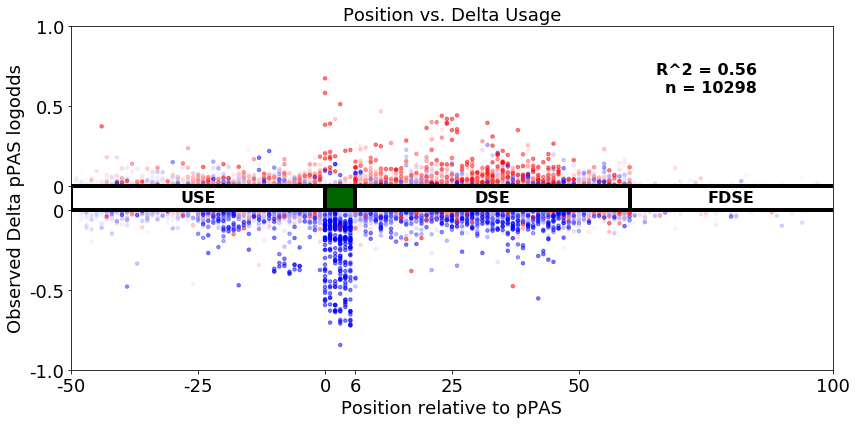

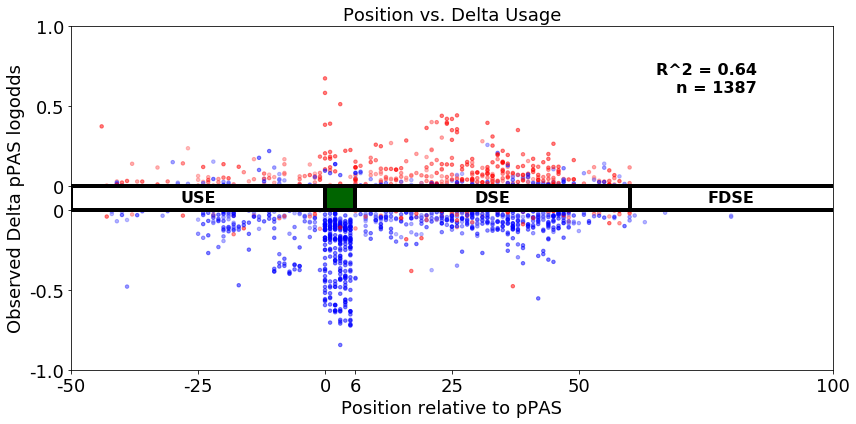

In [5]:
save_figs = False

#All variants
df_to_use = apadb_variant_df_filtered.query("native_usage > 0.0 and native_usage < 1.0")

figsize=(12, 6)

fig_name = None
if save_figs :
    fig_name = 'position_delta_all'
plot_position_delta_scatter(df_to_use, min_pred_filter=0.0, figsize=figsize, fig_name=fig_name, vmin=-0.1, vmax=0.1, fig_dpi=150, annotate=None, pred_column='delta_psi_pred', true_column='delta_psi_true')



#Filtered on prediction >= 0.1 (log)
df_to_use = apadb_variant_df_filtered.query("native_usage > 0.0 and native_usage < 1.0")

fig_name = None
if save_figs :
    fig_name = 'position_delta_all_pred_ge_01'
plot_position_delta_scatter(df_to_use, min_pred_filter=0.05, figsize=figsize, fig_name=fig_name, vmin=-0.1, vmax=0.1, fig_dpi=150, annotate=None, pred_column='delta_psi_pred', true_column='delta_psi_true')


Pathogenic vs. Benign AUC score (based on predicted APA fold change) = 0.915


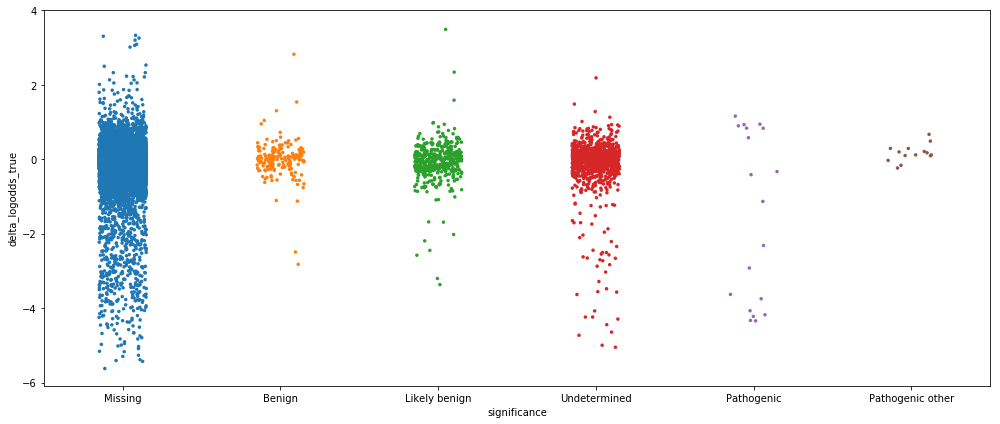

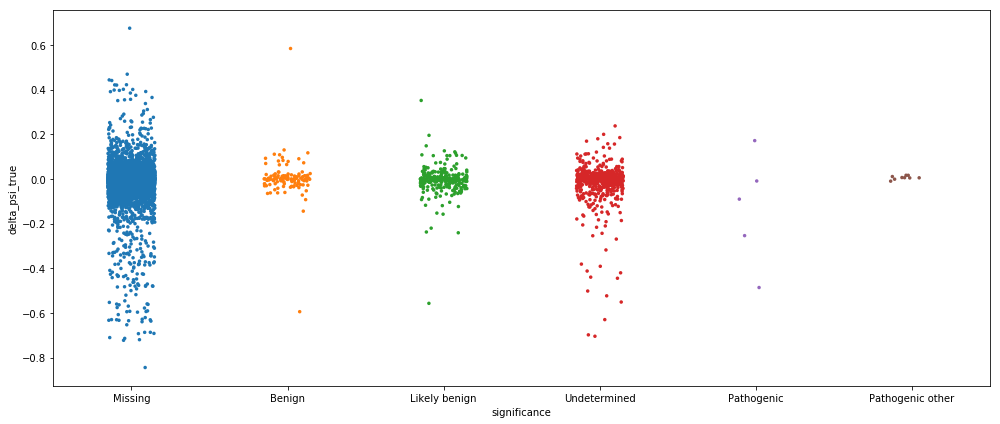

In [32]:

df_to_use = human_variant_df_filtered
df_clinvar = df_to_use.query("variant == 'snv'").copy()
df_clinvar.loc[df_clinvar.significance == 'Likely pathogenic', 'significance'] = 'Pathogenic'

#Re-annotate variants that are pathogenic for other reasons than APA
df_clinvar.loc[df_clinvar.gene == 'SPRTN.10', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'RMRP.2', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'RNU4ATAC.4', 'significance'] = 'Pathogenic UTR5'
df_clinvar.loc[df_clinvar.gene == 'RPL11.3', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'SERPINA1.5', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'TMEM107.4', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'HBB.3', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'HBB.4', 'significance'] = 'Pathogenic other'


patho_vs_benign_labels = []
patho_vs_benign_delta_pred = []
for index, row in df_clinvar.iterrows() :
    if row['significance'] == 'Benign' :
        patho_vs_benign_labels.append(0)
    elif row['significance'] == 'Pathogenic' :
        patho_vs_benign_labels.append(1)
    else :
        continue
    
    patho_vs_benign_delta_pred.append(row['delta_logodds_pred'])

patho_vs_benign_pred_auc = roc_auc_score(np.ravel(patho_vs_benign_labels), np.abs(np.ravel(patho_vs_benign_delta_pred)))
print('Pathogenic vs. Benign AUC score (based on predicted APA fold change) = ' + str(round(patho_vs_benign_pred_auc, 3)))

f = plt.figure(figsize=(14, 6))
sns.stripplot(x="significance", y="delta_logodds_true", data=df_clinvar, jitter=0.15, size=3.5, order=['Missing', 'Benign', 'Likely benign', 'Undetermined', 'Pathogenic', 'Pathogenic other'])

plt.tight_layout()
plt.show()


#APADB-scaled dPSIs
df_to_use = apadb_variant_df_filtered.copy()
df_clinvar = df_to_use.query("variant == 'snv' and native_usage > 0.01 and native_usage < 0.99").copy()
df_clinvar.loc[df_clinvar.significance == 'Likely pathogenic', 'significance'] = 'Pathogenic'

#Re-annotate variants that are pathogenic for other reasons than APA
df_clinvar.loc[df_clinvar.gene == 'SPRTN.10', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'RMRP.2', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'RNU4ATAC.4', 'significance'] = 'Pathogenic UTR5'
df_clinvar.loc[df_clinvar.gene == 'RPL11.3', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'SERPINA1.5', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'TMEM107.4', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'HBB.3', 'significance'] = 'Pathogenic other'
df_clinvar.loc[df_clinvar.gene == 'HBB.4', 'significance'] = 'Pathogenic other'


f = plt.figure(figsize=(14, 6))
sns.stripplot(x="significance", y="delta_psi_true", data=df_clinvar, jitter=0.15, size=3.5, order=['Missing', 'Benign', 'Likely benign', 'Undetermined', 'Pathogenic', 'Pathogenic other'])

plt.tight_layout()
plt.show()





<h2>Saturation Mutagenesis of Disease-Implicated PASs </h2>

UTR = F2.1
# Clinvar IDs = 
NM_000506.4(F2):c.*97G>A 1.37 (1.38)
c.*106T>A 1.41 (1.04)
c.*108C>T 2.08 (1.08)
c.*96C>T 1.17 (1.03)
NM_000506.4(F2):c.*44G>T 1.57 (1.08)
# Variants = 272 (254)
# R^2 = 0.72 (0.28)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 35 (18)
# % Significant = 12.867647058823529 (7.086614173228346)
# Significant? AUC = 0.879 (0.771)
# Direction? AUC = 0.976 (0.925)
# Direction? Accuracy = 0.943 (0.889)

Observed:


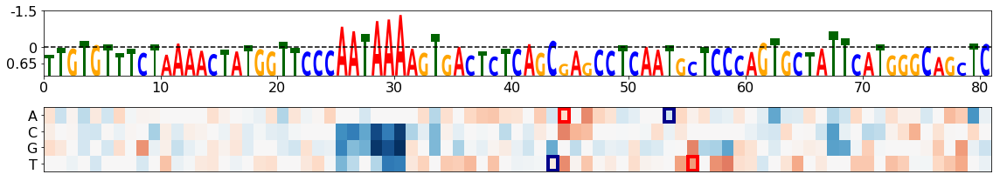

Predicted:


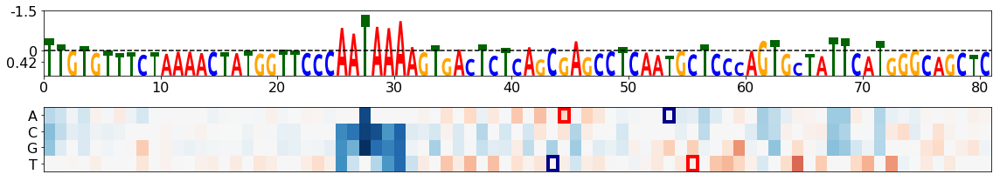

UTR = FOXP3.1
# Clinvar IDs = 
MANUAL_FOXP3_IPEX 10.14 (17.64)
# Variants = 27 (23)
# R^2 = 0.82 (0.2)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 3 (0)
# % Significant = 11.11111111111111 (0.0)
# Significant? AUC = 1.0 (nan)
# Direction? AUC = nan (nan)
# Direction? Accuracy = 1.0 (nan)

Observed:


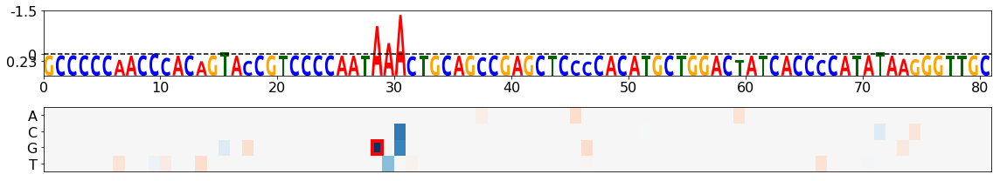

Predicted:


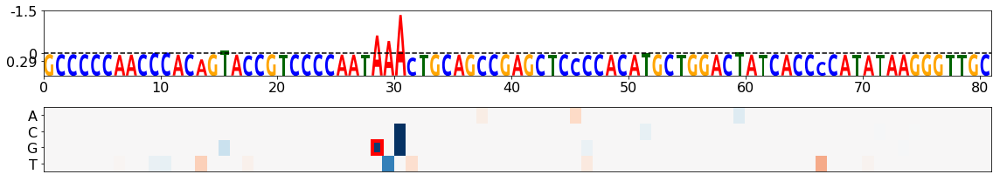

UTR = TP53.3
# Clinvar IDs = 
NM_000546.5(TP53):c.*1160T>G 1.09 (1.09)
NM_001126113.2(TP53):c.*1422G>C 1.13 (1.13)
NM_000546.5(TP53):c.*1175A>C 18.59 (23.18)
# Variants = 270 (252)
# R^2 = 0.86 (0.46)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 33 (15)
# % Significant = 12.222222222222221 (5.9523809523809526)
# Significant? AUC = 0.963 (0.918)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 0.97 (0.933)

Observed:


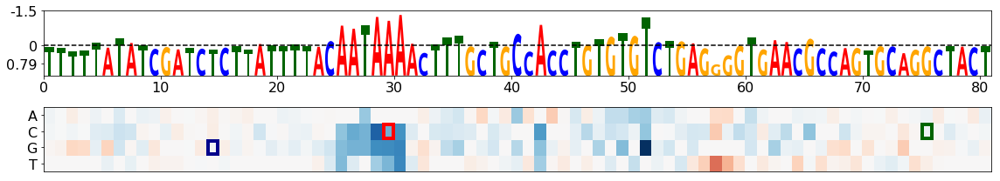

Predicted:


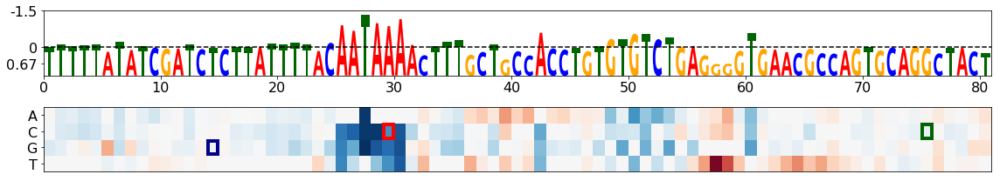

UTR = INS.1
# Clinvar IDs = 
NM_000207.2(INS):c.*28G>A 1.41 (1.19)
NM_000207.2(INS):c.*59A>G 42.46 (58.75)
NM_000207.2(INS):c.*42C>T 1.5 (1.19)
# Variants = 259 (241)
# R^2 = 0.76 (0.62)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 35 (18)
# % Significant = 13.513513513513514 (7.468879668049793)
# Significant? AUC = 0.955 (0.921)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 1.0 (1.0)

Observed:


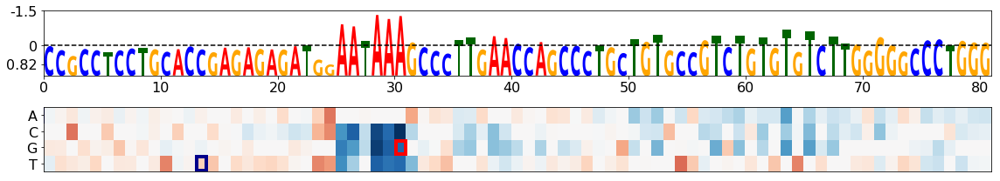

Predicted:


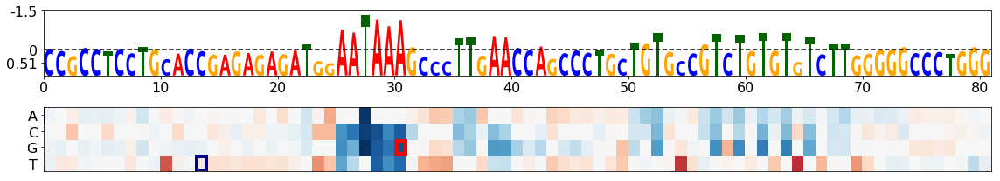

UTR = HBA2.2
# Clinvar IDs = 
c.*82G>A 1.22 (1.11)
c.*98T>C 1.89 (1.2)
c.*103G>A 1.19 (1.06)
NM_000517.4(HBA2):c.*136A>G 1.11 (1.26)
c.*104G>T 3.19 (2.09)
NM_000517.4(HBA2):c.*94A>G 76.04 (35.74)
NM_000517.4(HBA2):c.*92A>G 65.28 (28.86)
# Variants = 258 (240)
# R^2 = 0.79 (0.52)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 56 (38)
# % Significant = 21.705426356589147 (15.833333333333334)
# Significant? AUC = 0.879 (0.821)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 1.0 (1.0)

Observed:


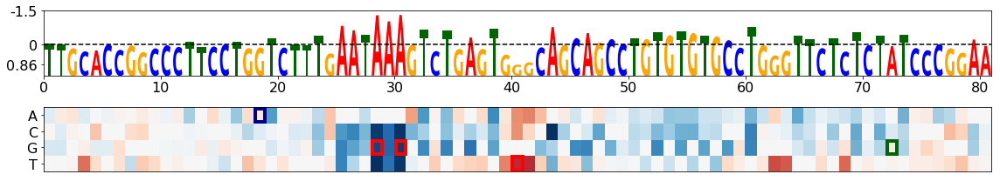

Predicted:


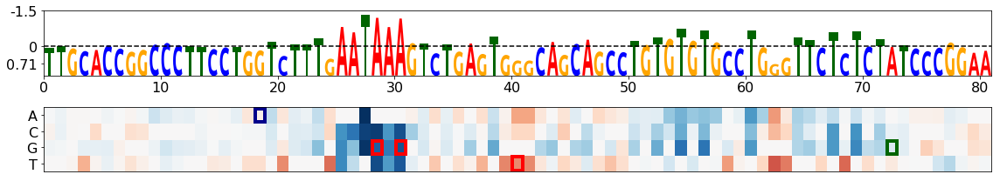

UTR = ARSA.3
# Clinvar IDs = 
c.*130C>A 1.32 (1.18)
c.*125C>G 1.07 (1.14)
c.*103C>T 1.43 (1.03)
MANUAL_ARSA_Meta_Leuko 3.1 (1.59)
# Variants = 263 (245)
# R^2 = 0.46 (0.34)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 19 (11)
# % Significant = 7.224334600760456 (4.489795918367347)
# Significant? AUC = 0.84 (0.779)
# Direction? AUC = 0.922 (1.0)
# Direction? Accuracy = 0.947 (1.0)

Observed:


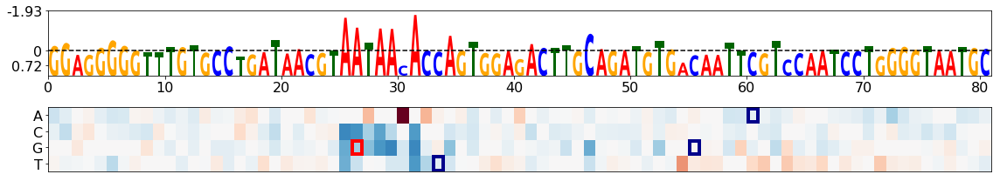

Predicted:


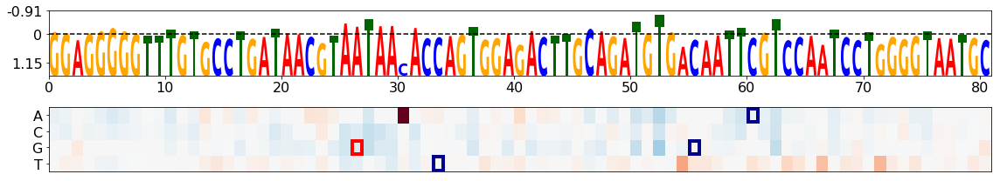

UTR = HBB.1
# Clinvar IDs = 
NM_000518.4(HBB):c.*91G>A 1.13 (1.03)
NM_000518.4(HBB):c.*96T>C 1.45 (1.19)
NM_000518.4(HBB):c.*110_*114delTAAAA 236.35 (36.09)
NM_000518.4(HBB):c.*110T>C 76.82 (30.09)
c.*129T>C 1.15 (1.03)
c.*132C>A 1.05 (1.46)
c.*132C>T 1.81 (1.26)
c.*118A>G 1.24 (1.04)
NM_000518.4(HBB):c.*113A>G 58.53 (20.64)
NM_000518.4(HBB):c.*112A>G 68.25 (14.23)
NM_000518.4(HBB):c.*111A>G 37.73 (18.62)
# Variants = 255 (237)
# R^2 = 0.92 (0.56)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 34 (17)
# % Significant = 13.333333333333334 (7.172995780590718)
# Significant? AUC = 0.95 (0.901)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 1.0 (1.0)

Observed:


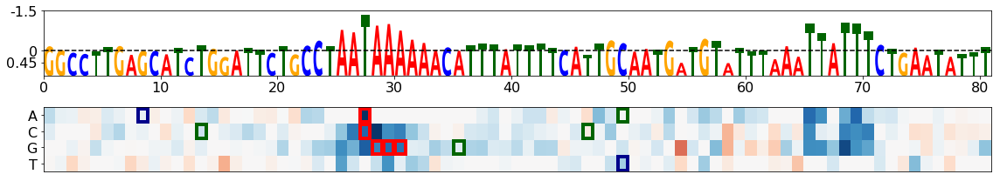

Predicted:


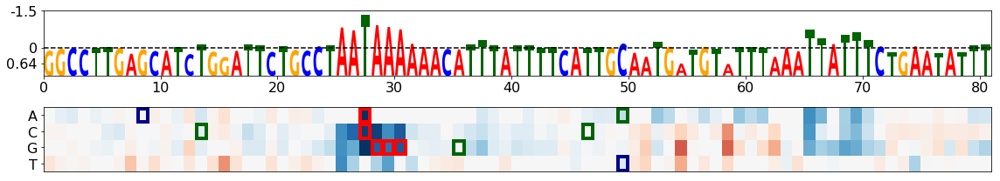

UTR = FOXC1.2
# Clinvar IDs = 
NM_001453.2(FOXC1):c.*734A>T 2.46 (2.73)
# Variants = 258 (240)
# R^2 = 0.85 (0.4)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 33 (15)
# % Significant = 12.790697674418604 (6.25)
# Significant? AUC = 0.96 (0.912)
# Direction? AUC = 0.989 (0.972)
# Direction? Accuracy = 0.97 (0.933)

Observed:


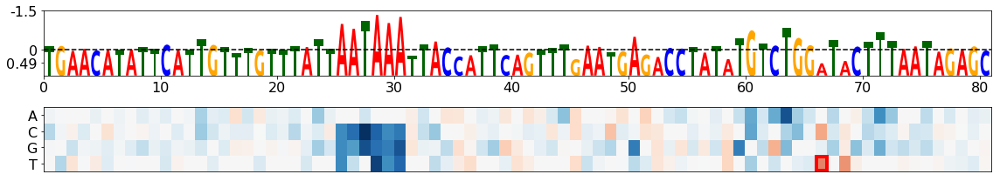

Predicted:


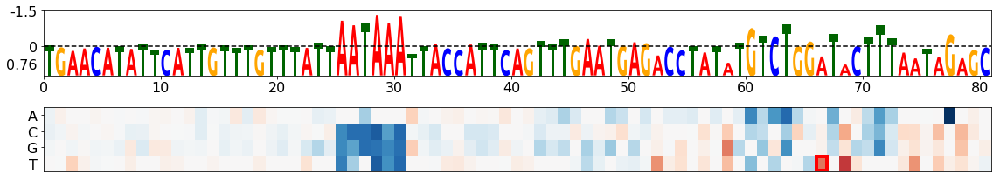

UTR = BMP1.3
# Clinvar IDs = 
NM_001199.3(BMP1):c.*241T>C 1.51 (4.12)
# Variants = 258 (240)
# R^2 = 0.46 (0.14)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 23 (13)
# % Significant = 8.914728682170542 (5.416666666666667)
# Significant? AUC = 0.688 (0.477)
# Direction? AUC = 0.962 (0.773)
# Direction? Accuracy = 0.826 (0.692)

Observed:


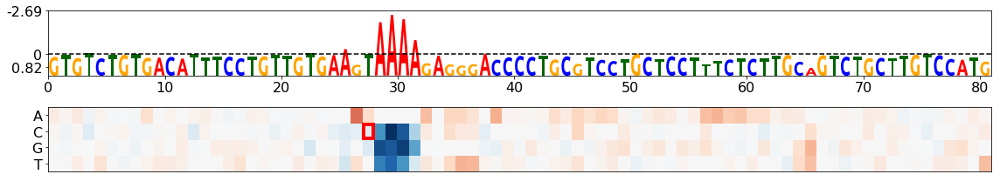

Predicted:


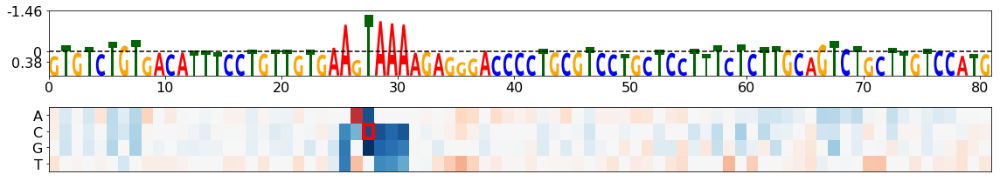

UTR = BRCA1.1
# Clinvar IDs = 
NM_007294.3(BRCA1):c.*1327G>A 1.0 (1.38)
NM_007294.3(BRCA1):c.*1332G>A 1.18 (1.58)
c.*1363A>T 73.27 (16.22)
NM_007294.3(BRCA1):c.*1323A>G 1.31 (1.1)
# Variants = 272 (254)
# R^2 = 0.88 (0.57)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 44 (26)
# % Significant = 16.176470588235293 (10.236220472440944)
# Significant? AUC = 0.928 (0.878)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 1.0 (1.0)

Observed:


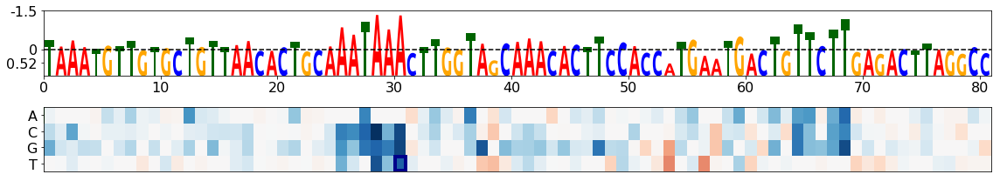

Predicted:


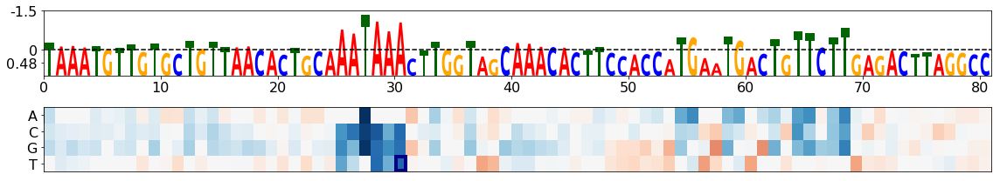

UTR = BRCA2.1
# Clinvar IDs = 
# Variants = 262 (244)
# R^2 = 0.9 (0.41)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 19 (1)
# % Significant = 7.251908396946565 (0.4098360655737705)
# Significant? AUC = 0.973 (0.494)
# Direction? AUC = 1.0 (nan)
# Direction? Accuracy = 1.0 (1.0)

Observed:


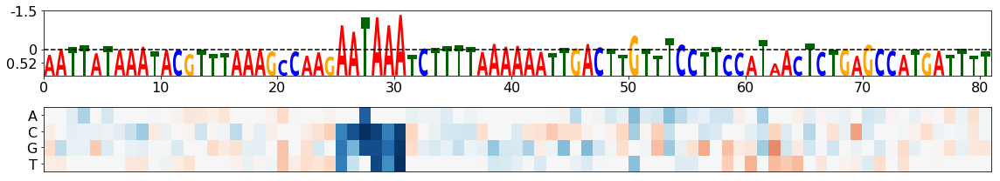

Predicted:


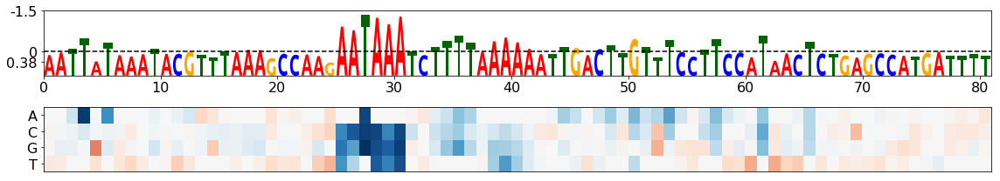

UTR = PTEN.13
# Clinvar IDs = 
# Variants = 265 (247)
# R^2 = 0.89 (0.57)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 23 (5)
# % Significant = 8.679245283018869 (2.0242914979757085)
# Significant? AUC = 0.994 (0.975)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 1.0 (1.0)

Observed:


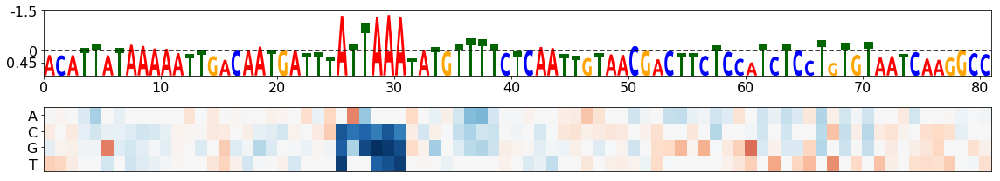

Predicted:


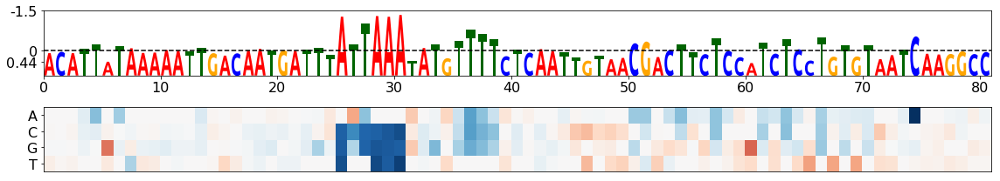

UTR = PTEN.15
# Clinvar IDs = 
c.*282G>A 1.06 (1.28)
# Variants = 266 (248)
# R^2 = 0.84 (0.2)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 29 (12)
# % Significant = 10.902255639097744 (4.838709677419355)
# Significant? AUC = 0.866 (0.679)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 0.897 (0.75)

Observed:


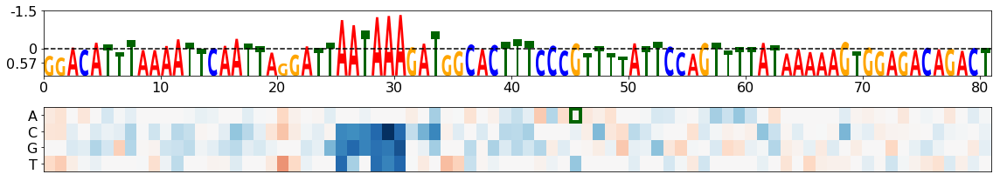

Predicted:


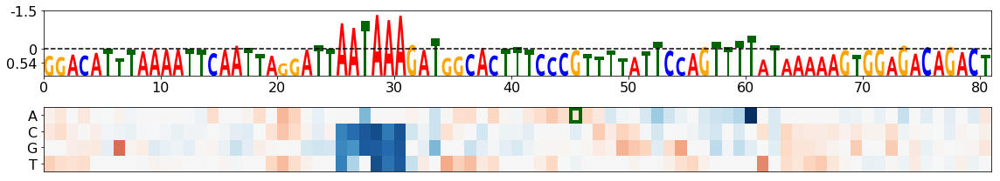

UTR = PTEN.16
# Clinvar IDs = 
c.*65T>C 1.07 (1.0)
c.*74T>C 1.13 (1.1)
c.*78T>G 1.22 (1.67)
# Variants = 260 (242)
# R^2 = 0.6 (0.8)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 26 (24)
# % Significant = 10.0 (9.917355371900827)
# Significant? AUC = 0.923 (0.933)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 0.923 (0.917)

Observed:


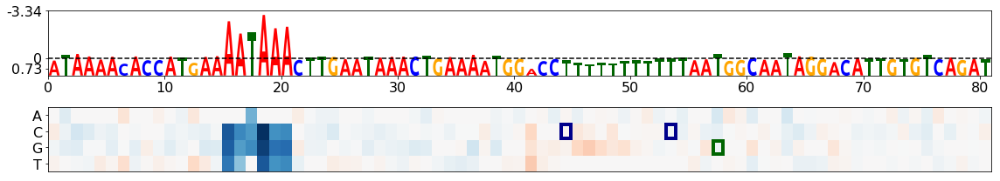

Predicted:


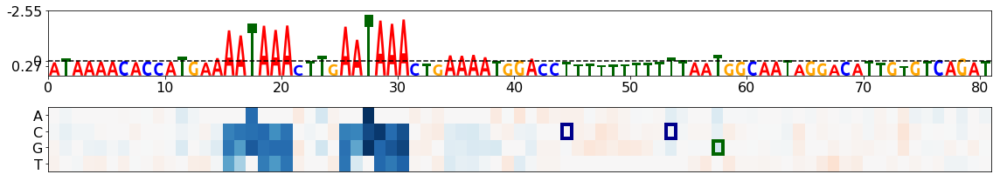

UTR = PTEN.8
# Clinvar IDs = 
# Variants = 265 (247)
# R^2 = 0.52 (0.47)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 71 (56)
# % Significant = 26.79245283018868 (22.672064777327936)
# Significant? AUC = 0.787 (0.752)
# Direction? AUC = 0.977 (0.979)
# Direction? Accuracy = 0.887 (0.857)

Observed:


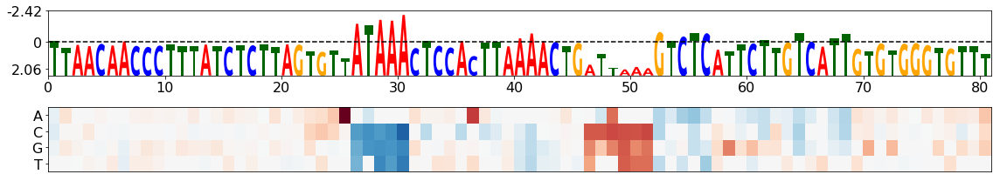

Predicted:


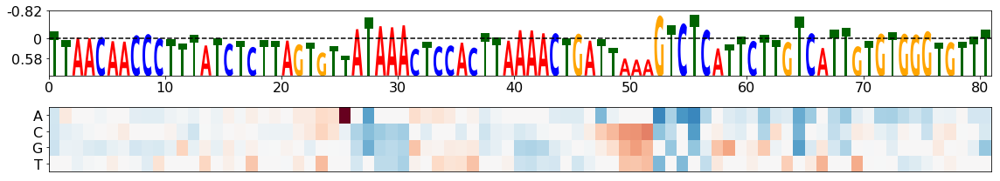

UTR = TPMT.1
# Clinvar IDs = 
NM_000367.4(TPMT):c.*2340T>C 1.37 (1.51)
# Variants = 266 (248)
# R^2 = 0.71 (0.51)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 39 (22)
# % Significant = 14.661654135338345 (8.870967741935484)
# Significant? AUC = 0.933 (0.889)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 1.0 (1.0)

Observed:


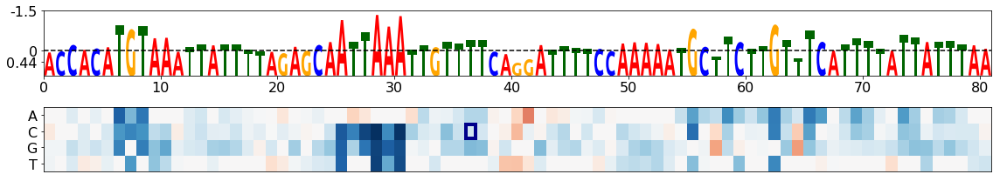

Predicted:


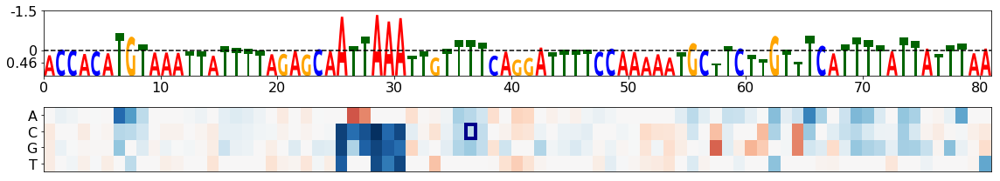

UTR = TPMT.3
# Clinvar IDs = 
# Variants = 264 (246)
# R^2 = 0.91 (0.29)

Significance filter = p < 0.001, delta > 0.693
# Significant variants = 26 (8)
# % Significant = 9.848484848484848 (3.252032520325203)
# Significant? AUC = 0.914 (0.721)
# Direction? AUC = 1.0 (1.0)
# Direction? Accuracy = 0.962 (0.875)

Observed:


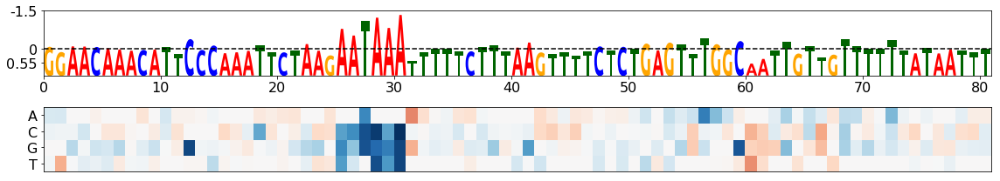

Predicted:


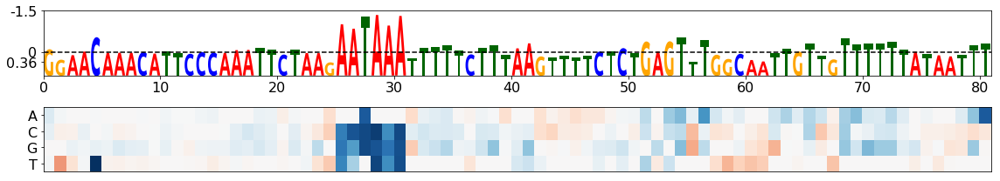

In [33]:

gene_names = [
    'F2.1',
    'FOXP3.1',
    'TP53.3',
    'INS.1',
    'HBA2.2',
    'ARSA.3',
    'HBB.1',
    'FOXC1.2',
    'BMP1.3',
    'BRCA1.1',
    'BRCA2.1',
    'PTEN.13',
    'PTEN.15',
    'PTEN.16',
    'PTEN.8',
    'TPMT.1',
    'TPMT.3'
]

delta_logodds_pred_bias = 0.0#-0.05

configs = [
    [25, 106, (16,3)]
]

save_figs = False

gene_exceptions = ['FOXP3.1']

valid_wt_seqs = human_variant_df.groupby('wt_seq').agg({'delta_logodds_true' : 'count'}).reset_index().query("delta_logodds_true > 50")['wt_seq'].unique()
df_to_use = human_variant_df.loc[human_variant_df.wt_seq.isin(valid_wt_seqs) | human_variant_df.gene.isin(gene_exceptions)]

df_to_use = df_to_use.copy().set_index('master_seq')
df_to_use['snv_pos'] = pd.to_numeric(df_to_use['snv_pos'], downcast='integer')
df_to_use['delta_logodds_pred'] = df_to_use['mean_delta_logodds_pred']

p_thresh = 0.001
delta_thresh = 0.693

fixed_scale=True

for gene_name in gene_names :
    for seq_start, seq_end, figsize in configs :
        
        #Calculate per-utr statistics

        df_gene = df_to_use.query("gene == '" + gene_name + "'")
        df_gene_nopas = df_to_use.query("gene == '" + gene_name + "' and (snv_pos < 50 or snv_pos > 55)")

        df_gene_signi = df_gene.query("delta_p_val < " + str(p_thresh) + " and (delta_logodds_true < -" + str(delta_thresh) + " or delta_logodds_true > " + str(delta_thresh) + ")")
        df_gene_signi_nopas = df_gene_nopas.query("delta_p_val < " + str(p_thresh) + " and (delta_logodds_true < -" + str(delta_thresh) + " or delta_logodds_true > " + str(delta_thresh) + ")")

        n_variants = len(df_gene)
        n_variants_nopas = len(df_gene_nopas)

        n_variants_signi = len(df_gene_signi)
        n_variants_signi_nopas = len(df_gene_signi_nopas)

        r_val, _ = pearsonr(df_gene['delta_logodds_pred'], df_gene['delta_logodds_true'])
        r2 = round(r_val * r_val, 2)
        r_val_nopas, _ = pearsonr(df_gene_nopas['delta_logodds_pred'], df_gene_nopas['delta_logodds_true'])
        r2_nopas = round(r_val_nopas * r_val_nopas, 2)

        significant_labels = np.zeros(len(df_gene))
        significant_labels[(df_gene['delta_p_val'] < p_thresh) & (np.abs(df_gene['delta_logodds_true']) > delta_thresh)] = 1
        significant_auc = np.nan
        if np.sum(significant_labels) != 0 and np.sum(significant_labels) != len(significant_labels) :
            significant_auc = round(roc_auc_score(significant_labels, np.ravel(np.abs(df_gene['delta_logodds_pred']))), 3)

        direction_acc = np.nan
        if len(df_gene_signi) > 0 :
            direction_acc = float(len(np.nonzero(np.sign(np.ravel(df_gene_signi['delta_logodds_pred'] + delta_logodds_pred_bias)) == np.sign(np.ravel(df_gene_signi['delta_logodds_true'])))[0]))
            direction_acc /= float(len(df_gene_signi))
            direction_acc = round(direction_acc, 3)
        
        significant_labels_nopas = np.zeros(len(df_gene_nopas))
        significant_labels_nopas[(df_gene_nopas['delta_p_val'] < p_thresh) & (np.abs(df_gene_nopas['delta_logodds_true']) > delta_thresh)] = 1
        significant_auc_nopas = np.nan
        if np.sum(significant_labels_nopas) != 0 and np.sum(significant_labels_nopas) != len(significant_labels_nopas) :
            significant_auc_nopas = round(roc_auc_score(significant_labels_nopas, np.ravel(np.abs(df_gene_nopas['delta_logodds_pred']))), 3)

        direction_acc_nopas = np.nan
        if len(df_gene_signi_nopas) > 0 :
            direction_acc_nopas = float(len(np.nonzero(np.sign(np.ravel(df_gene_signi_nopas['delta_logodds_pred'] + delta_logodds_pred_bias)) == np.sign(np.ravel(df_gene_signi_nopas['delta_logodds_true'])))[0]))
            direction_acc_nopas /= float(len(df_gene_signi_nopas))
            direction_acc_nopas = round(direction_acc_nopas, 3)
        
        direction_labels = np.zeros(len(df_gene_signi))
        direction_labels[df_gene_signi['delta_logodds_true'] > 0.0] = 1
        direction_auc = np.nan
        if np.sum(direction_labels) != 0 and np.sum(direction_labels) != len(direction_labels) :
            direction_auc = round(roc_auc_score(direction_labels, np.ravel(df_gene_signi['delta_logodds_pred'])), 3)

        direction_labels_nopas = np.zeros(len(df_gene_signi_nopas))
        direction_labels_nopas[df_gene_signi_nopas['delta_logodds_true'] > 0.0] = 1
        direction_auc_nopas = np.nan
        if np.sum(direction_labels_nopas) != 0 and np.sum(direction_labels_nopas) != len(direction_labels_nopas) :
            direction_auc_nopas = round(roc_auc_score(direction_labels_nopas, np.ravel(df_gene_signi_nopas['delta_logodds_pred'])), 3)

        print("UTR = " + gene_name)
        
        clinvar_ids = 'N/A'
        clinvar_id_list = []
        if not (len(df_gene['clinvar_id']) == 1 and df_gene['clinvar_id'].unique()[0] == 'Missing') :
            clinvar_ids = ''
            for clinvar_id in list(df_gene['clinvar_id'].unique()) :
                if clinvar_id != 'Missing' :
                    clinvar_id_list.append(clinvar_id)
                    snv_pos = df_gene.query("clinvar_id == '" + clinvar_id + "'")['snv_pos'].values[0]
                    snv_nt = df_gene.query("clinvar_id == '" + clinvar_id + "'").index.values[0][int(snv_pos)]
                    clinvar_ids += clinvar_id + ': ' + str(int(snv_pos))
                    clinvar_ids += ' (' + snv_nt + ')\n'

        #print("# Clinvar IDs = " + clinvar_ids)
        print("# Clinvar IDs = ")
        for clinvar_id in clinvar_id_list :
            if len(df_to_use.query("clinvar_id == '" + clinvar_id + "'")) > 0 :
                true_fold = np.exp(list(df_to_use.query("clinvar_id == '" + clinvar_id + "'")['delta_logodds_true'].values)[0])
                pred_fold = np.exp(list(df_to_use.query("clinvar_id == '" + clinvar_id + "'")['delta_logodds_pred'].values)[0])
                
                if true_fold < 1.0 :
                    true_fold = 1.0 / true_fold
                if pred_fold < 1.0 :
                    pred_fold = 1.0 / pred_fold
                
                print(clinvar_id + " " + str(round(true_fold, 2)) + " (" + str(round(pred_fold, 2)) + ")")
        
        print("# Variants = " + str(n_variants) + " (" + str(n_variants_nopas) + ")")
        print("# R^2 = " + str(r2) + " (" + str(r2_nopas) + ")")
        print("")

        print("Significance filter = p < " + str(p_thresh) + ", delta > " + str(delta_thresh))
        print("# Significant variants = " + str(n_variants_signi) + " (" + str(n_variants_signi_nopas) + ")")
        print("# % Significant = " + str(100. * n_variants_signi / n_variants) + " (" + str(100. * n_variants_signi_nopas / n_variants_nopas) + ")")
        print("# Significant? AUC = " + str(significant_auc) + " (" + str(significant_auc_nopas) + ")")
        print("# Direction? AUC = " + str(direction_auc) + " (" + str(direction_auc_nopas) + ")")
        print("# Direction? Accuracy = " + str(direction_acc) + " (" + str(direction_acc_nopas) + ")")
        print("")

        pas = df_gene['wt_seq'].values[0][50:56]
        cano_pas = True if pas in ['AATAAA', 'ATTAAA'] else False
        
        cano_pas_downscaling = 0.5
        cano_pas_mode = 'frac'
        if fixed_scale :
            cano_pas_downscaling = -1.5
            cano_pas_mode = 'value'
        
        print('Observed:')

        pas_max_val_obs = mut_map_v2(
                df_to_use,
                gene_name,
                experiment=None,
                mode='true',
                figsize=figsize,
                mark_pathogenic=True,
                mark_benign=True,
                mark_undetermined=True,
                seq_trim_start=seq_start, seq_trim_end=seq_end,
                plot_start=0, plot_end=seq_end - seq_start,
                pas_downscaling=cano_pas_downscaling if cano_pas else 1.0,
                pas_downscale_mode=cano_pas_mode if cano_pas else 'frac',
                fig_name=(gene_name.replace('.', '_') + '_Mutmap_Observed_' + str(seq_start) + '_' + str(seq_end)) if save_figs else None,
                fig_dpi=150
        )

        print('Predicted:')
        
        mut_map_v2(
                df_to_use,
                gene_name,
                experiment=None,
                mode='pred',
                figsize=figsize,
                mark_pathogenic=True,
                mark_benign=True,
                mark_undetermined=True,
                seq_trim_start=seq_start, seq_trim_end=seq_end,
                plot_start=0, plot_end=seq_end - seq_start,
                #pas_downscaling=0.5,
                pas_downscaling=pas_max_val_obs if cano_pas else 1.0,
                pas_downscale_mode='value'if cano_pas else 'frac',
                fig_name=(gene_name.replace('.', '_') + '_Mutmap_Predicted_' + str(seq_start) + '_' + str(seq_end)) if save_figs else None,
                fig_dpi=150
        )

<h2>Cleavage Alteration (Measured and Predicted) of F2 97G>A Variant</h2>

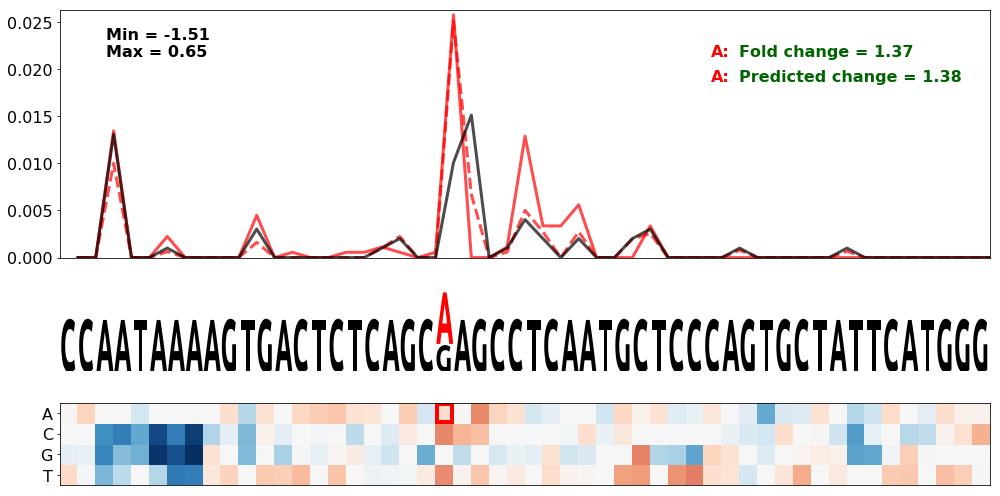

In [34]:
gene_name = 'F2.1'

snvs = [(69, 'A', 'red')]

seq_start = 48
seq_end = 100

save_figs = False

df_gene = human_variant_df.query("gene == '" + str(gene_name) + "'").copy().set_index('master_seq')
df_gene['delta_logodds_pred'] = df_gene['mean_delta_logodds_pred']

mut_map_with_cuts(
        df_gene,
        gene_name,
        snvs,
        mode='true',
        column_suffix='',
        figsize=(14, 7),
        height_ratios=[6, 2, 2],
        bg_alpha=0.999,
        plot_simple_mutmap=True,
        annotate_folds=True,
        plot_true_cuts=True,
        plot_pred_cuts=True,
        scale_pred_cuts=True,
        #fold_change_from_cut_range=[65, 80],
        ref_var_scales=[0.5, 1.0],
        border_eta = 0.06,
        seq_trim_start=seq_start, seq_trim_end=seq_end,
        plot_start=0, plot_end=seq_end-seq_start,
        plot_as_bars=False,
        pas_downscaling=0.5,
        fig_name=(gene_name.replace('.', '_') + '_Cut_Both_Pathogenic') if save_figs else None,
        fig_dpi=150
)

<h2>Complex/Interesting Cut Alteration Variants</h2>

Interesting cut alteration examples:
Gene = TPM1.7
WT seq = GAACCTTGAACAGATACAACTAATTTACATATTACTAACCAAACTTAAACATTAAACTTTTTCTACTACTTTAAATTCTAACCTGGAATGTTTCAGAGTTCTTCATTCTAATATCACCCTGAATTCCATTGAAGCTGGAAATGTCATTTTCCAAGCCCACCTGT
SNV pos = 79
SNV nt = C
ClinVar id = Missing


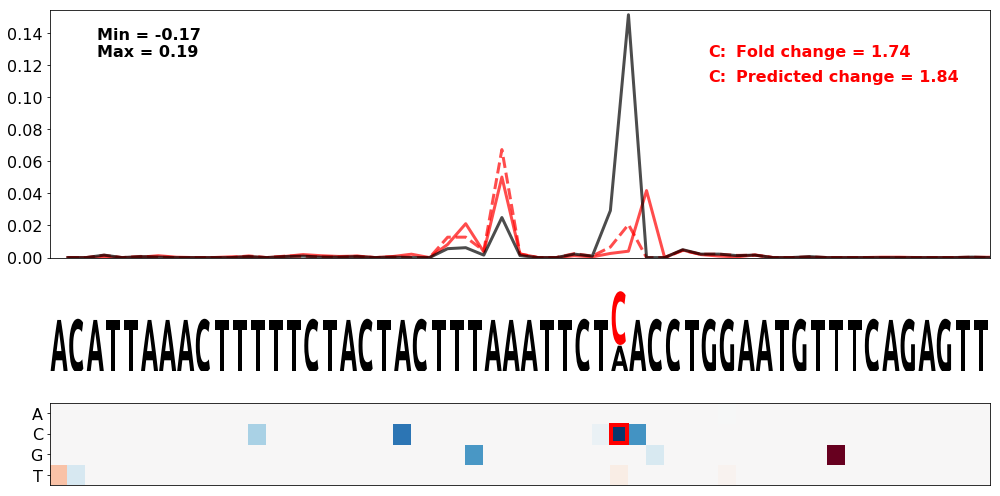

Gene = CPOX.2
WT seq = TATGATTTCTTTGTTCATATATTATGAATGTATTATTTTATTTGCTTCGTAATAAAGTTTATAAGGAAGAGCATCTCATACATATCATTATCGTGGAACACGTTGAATGTTTGTGATTCTGTGTGGCCTTTTTGGGGCTGGAAAATGTATGAATTCTTCAACTG
SNV pos = 77
SNV nt = G
ClinVar id = NM_000097.5(CPOX):c.*1105A>G


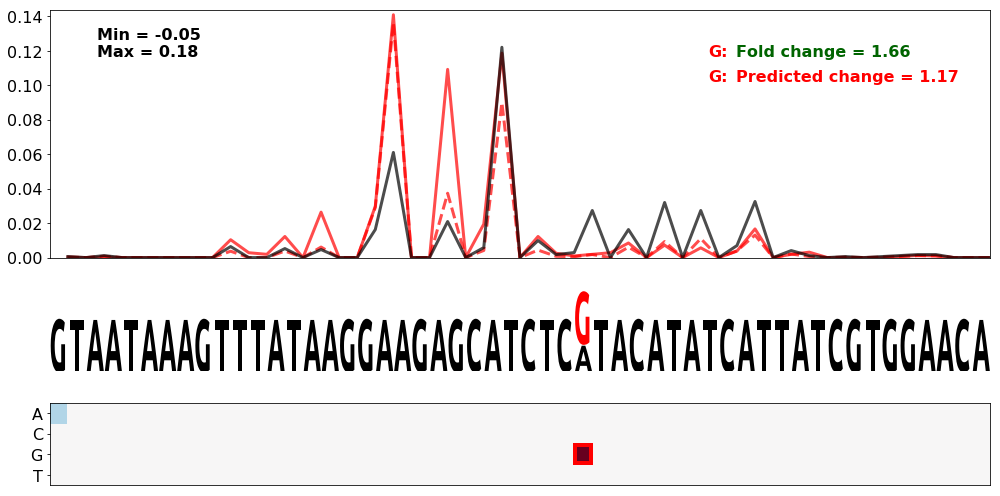

Gene = RYR2.5
WT seq = AGAAACAAGTTGATCAACGTGAGAGAAATTTCATGATAATTATTCATAGTAATAAAGTGTCGTGGGCTTAATTGTATATCTGGAGCCAGTGTCATCCACCAACAATGTGATACAATATGAACTTGACAGTAGTTTTGGGTTTTGCTCATTCTTTCAGCCACCTG
SNV pos = 75
SNV nt = G
ClinVar id = Missing


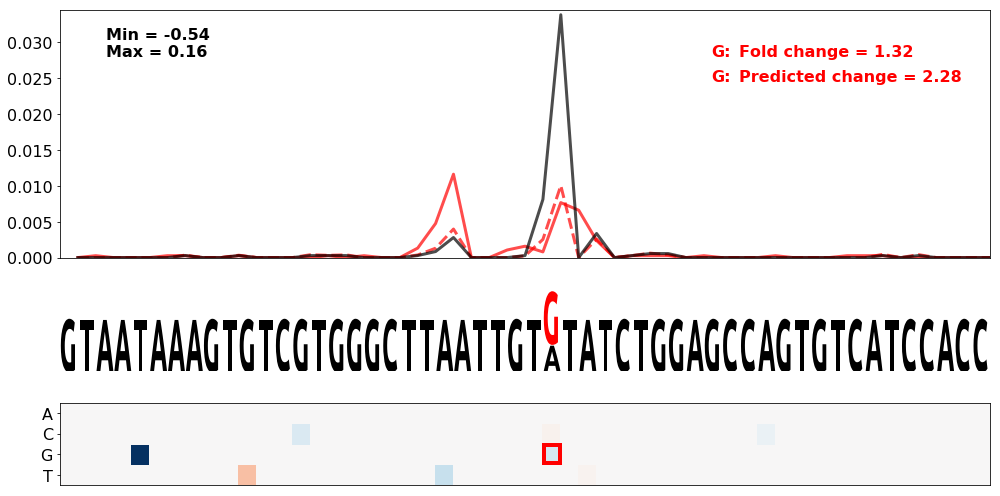

Gene = TGFBR2.6
WT seq = CACTGTAAACATTAGCTCTTTCCACTGCCTACCTGGACCCCAGTCTAGGAATTAAATCTGCACCTAACCAAGGTCCCTTGTAAGAAATGTCCATTCAAGCAGTCATTCTCTGGGTATATAATATGATTTTGACTACCTTATCTGGTGTTAAGATTTGAAGTTGG
SNV pos = 77
SNV nt = A
ClinVar id = Missing


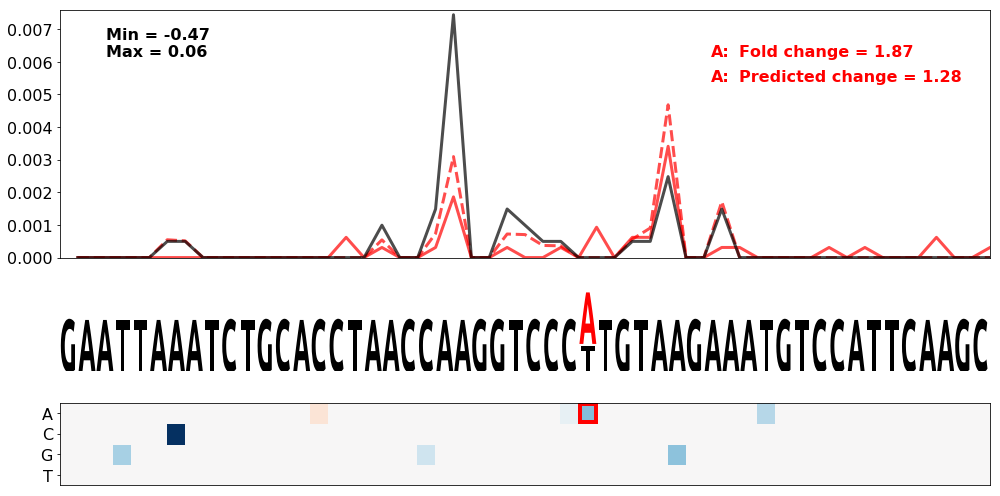

Gene = MSH2.1
WT seq = ACTGTTTGCAATTGACATAGGCAATAATAAGTGATGTGCTGAATTTTATAAATAAAATCATGTAGTTTGTGGAATTTGAGATGCATTGTAGTTCTTCGCAGTGTGACTTCAAATATTTTGGAAGAAACAAATAGCTCAGAGACCTCGTAAAATATCTTAAACTG
SNV pos = 72
SNV nt = G
ClinVar id = Missing


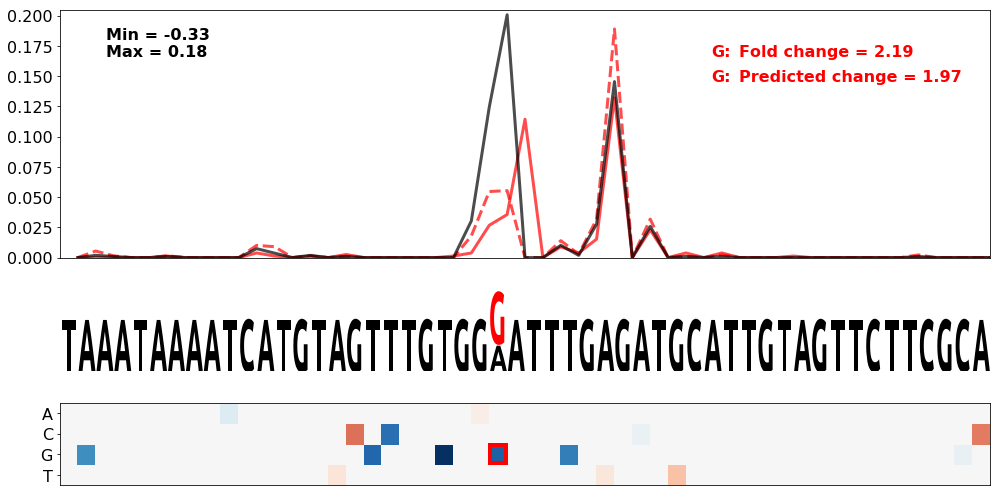

Gene = HBA2.2
WT seq = CTCCCAACGGGCCCTCCTCCCCTCCTTGCACCGGCCCTTCCTGGTCTTTGAATAAAGTCTGAGTGGGCAGCAGCCTGTGTGTGCCTGGGTTCTCTCTATCCCGGAATGTGCCAACAATGGAGGTGTTTACCTGTCTCAGACCAAGGACCTCTCTGCAGCTGCAT
SNV pos = 71
SNV nt = C
ClinVar id = Missing


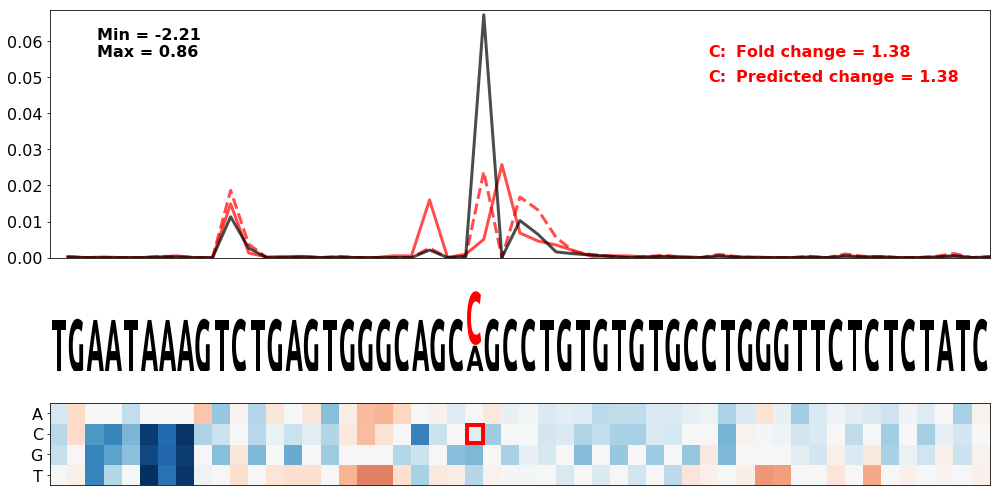

Gene = TP53.3
WT seq = CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG
SNV pos = 73
SNV nt = A
ClinVar id = Missing


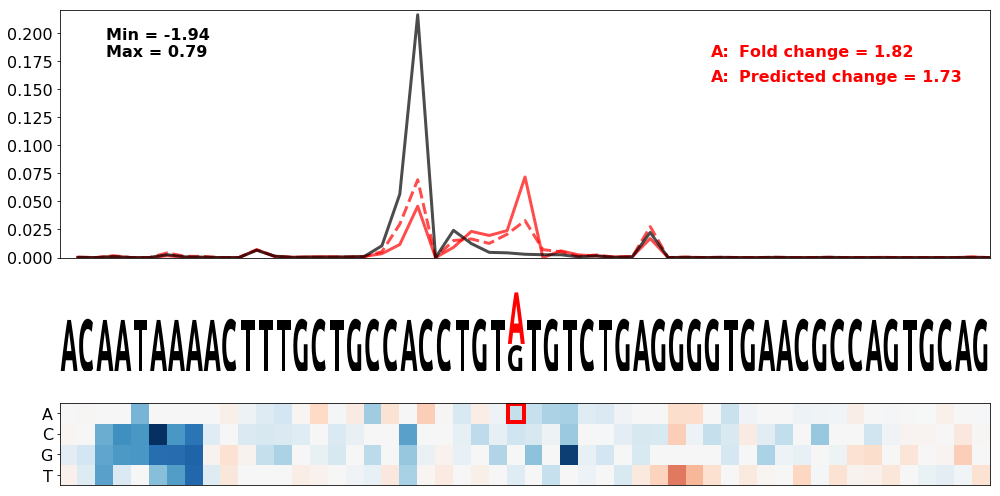

Gene = PRKAG2.2
WT seq = TGCAATTTTTTTACACATCTTTTGGTGGAGTAAACTTCACCACATCCATGAATAAACTCTCAGTTATTTTGAAATGGCAAATTTCTCATTATTTAAGTTTGGATCTGGAAAGGACATGACTTCTGAAATAGCCGCTGCTGGGTTTTAAAAGCTGAGGTCTCTCA
SNV pos = 76
SNV nt = A
ClinVar id = Missing


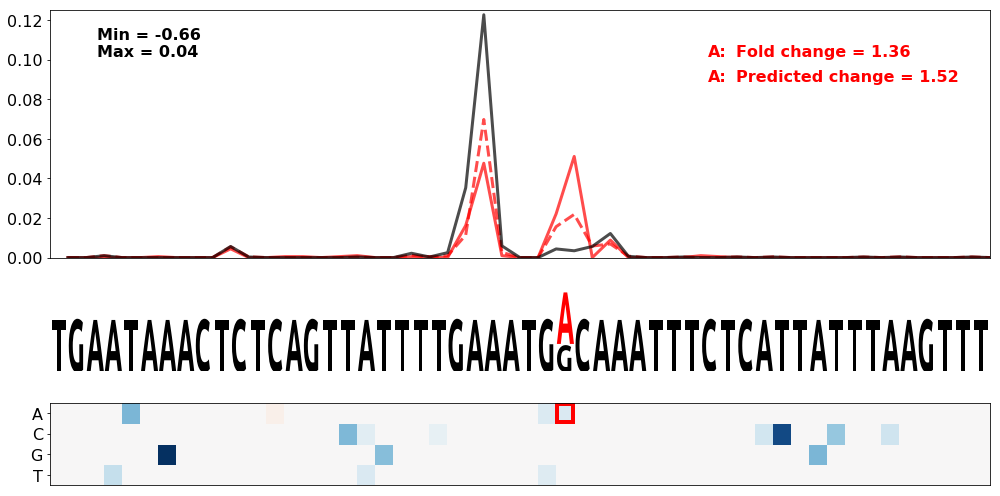

Gene = TP53.3
WT seq = CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG
SNV pos = 70
SNV nt = A
ClinVar id = Missing


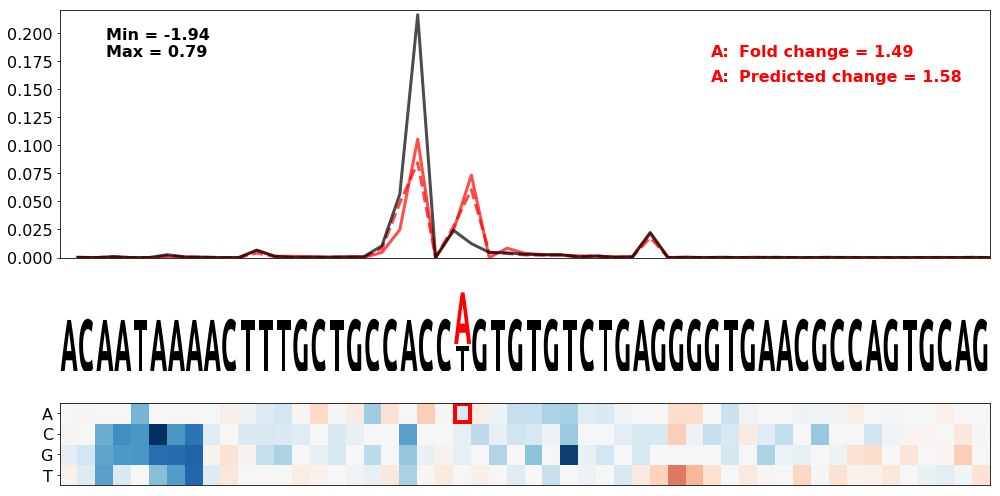

Gene = MRPS16.7
WT seq = GGTCCTTTTGAAACACTGCAGCGATCTTAATTTTGTTAGATTTGGAGTTCAATAAATGGAGTATCCTGAGTTGCCCTTGCTCTTCTGGCCTGGCCTGCACAGGGCCCAGGGAGAGATTTGTTCTTGTGTGACTTAGAGCTGGGTGTGGGTACTAATTAGCTTTT
SNV pos = 78
SNV nt = A
ClinVar id = NM_016065.3(MRPS16):c.*121G>A


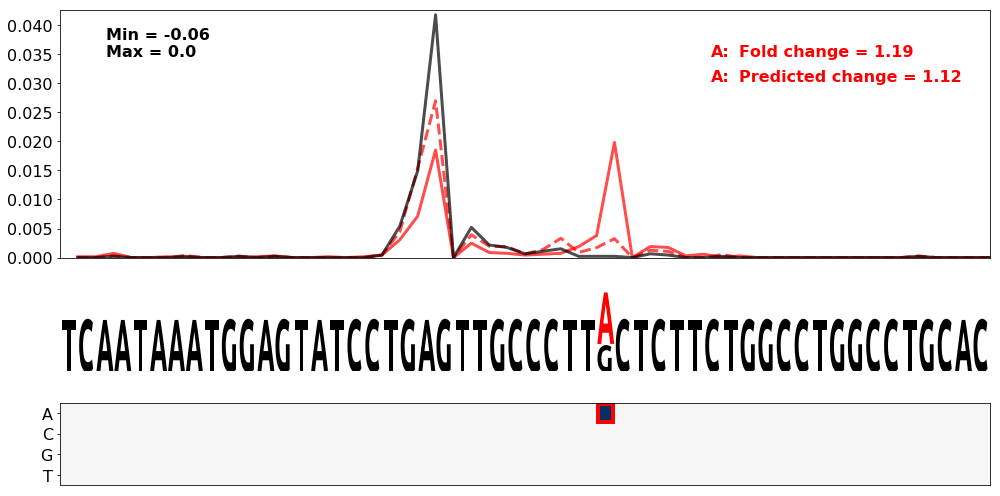

Gene = FOXC1.2
WT seq = TCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCA
SNV pos = 68
SNV nt = A
ClinVar id = Missing


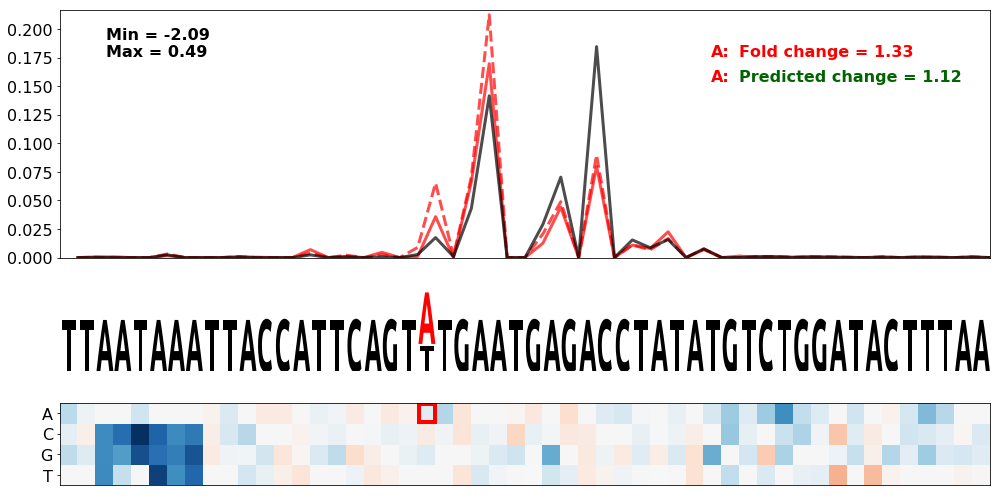

Gene = FOXC1.2
WT seq = TCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCA
SNV pos = 77
SNV nt = G
ClinVar id = Missing


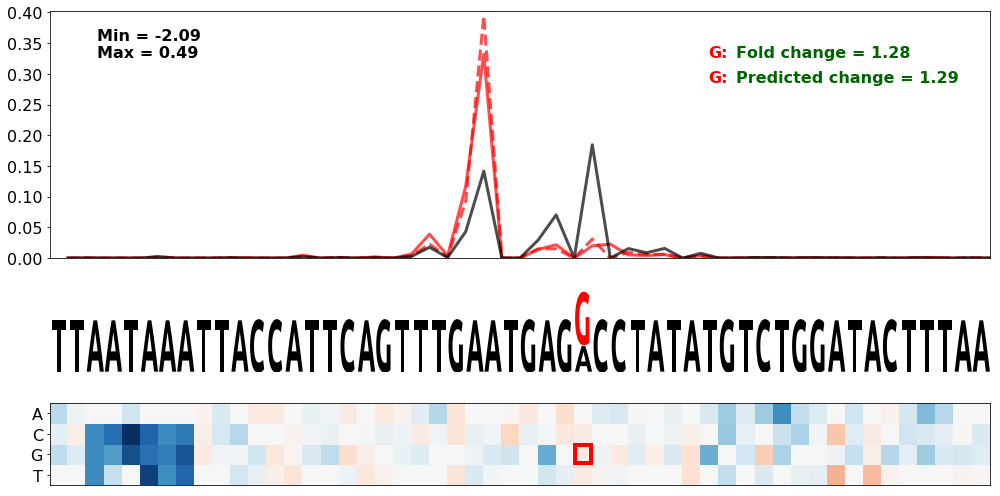

Gene = FOLR1.1
WT seq = CCCAACTATTTGGTTCCTGCTCCATGGTCGGGCCTCTGACAGCCACTTTGAATAAACCAGACACCGCACATGTGTCTTGAGAATTATTTGGATATGAATGGGAACGTGACTGTTTTGTTTTCCAATTCCCATTGATTGAAACCAGTGAGACTGGGCCAATTCCT
SNV pos = 67
SNV nt = G
ClinVar id = NM_016725.2(FOLR1):c.*122A>G


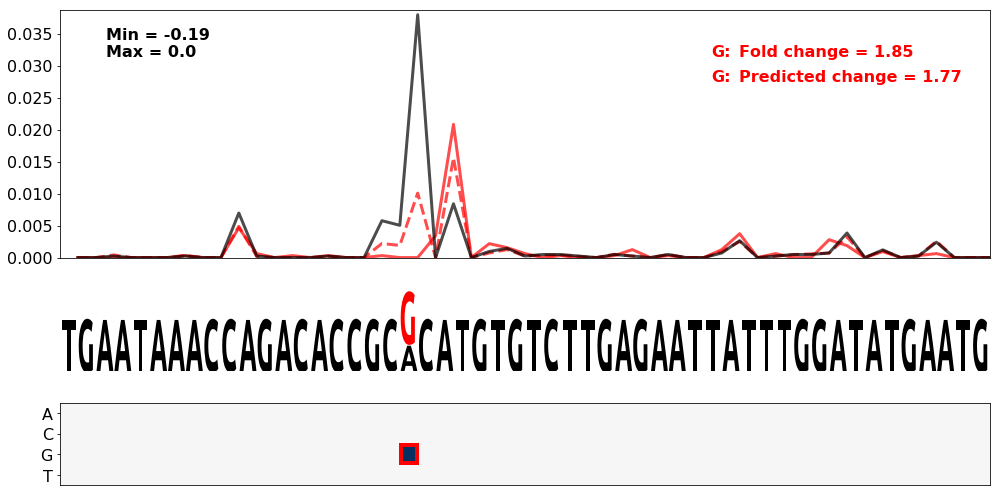

Gene = BRCA1.1
WT seq = ACTTGATTGTACAAAATACGTTTTGTAAATGTTGTGCTGTTAACACTGCAAATAAACTTGGTAGCAAACACTTCCACCATGAATGACTGTTCTTGAGACTTAGGCCAGCCGACTTTCTCAGAGCCTTTTCACTGTGCTTCAGTCTCCCACTCTGTAAAATGGGG
SNV pos = 71
SNV nt = A
ClinVar id = Missing


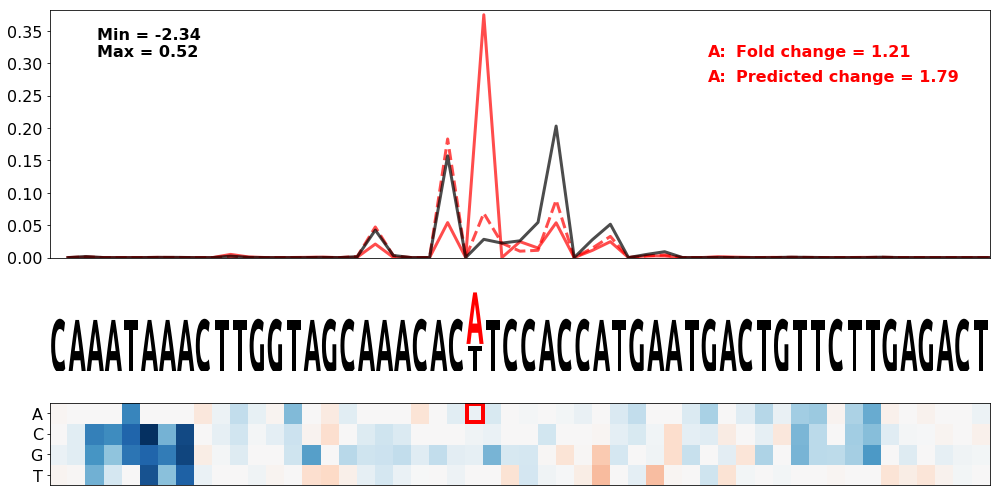

Gene = BRCA1.1
WT seq = ACTTGATTGTACAAAATACGTTTTGTAAATGTTGTGCTGTTAACACTGCAAATAAACTTGGTAGCAAACACTTCCACCATGAATGACTGTTCTTGAGACTTAGGCCAGCCGACTTTCTCAGAGCCTTTTCACTGTGCTTCAGTCTCCCACTCTGTAAAATGGGG
SNV pos = 72
SNV nt = A
ClinVar id = Missing


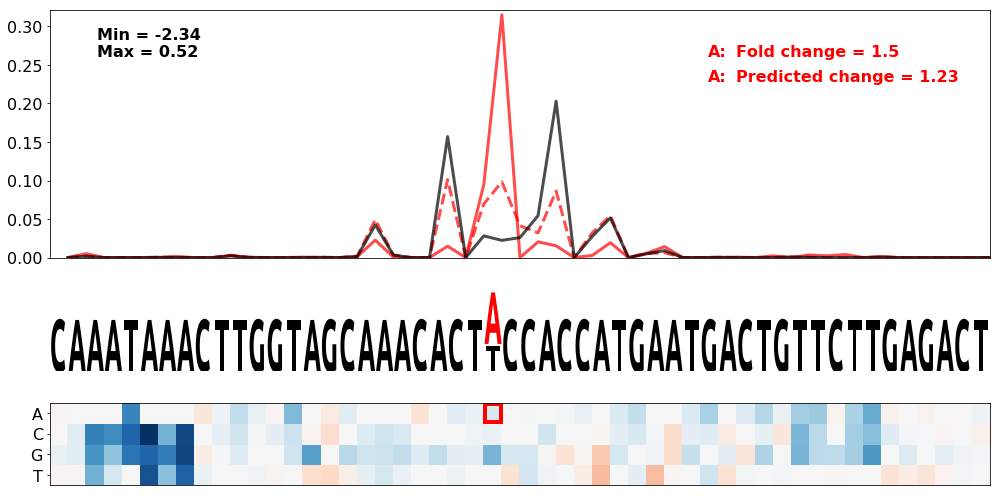

Gene = RB1.14
WT seq = ATAATTTACAGAAAGCTACAGAAATCATATTTACCAGGACACATCTGTTAAATAAAAGCATTGTTTCATGTTGGTGTACGTCTATACAGGGCTATGTATAACCGACTCCTGTTTCTCCTCCCTGCAACCACAGAACCATCACACACACACACACACACACACAC
SNV pos = 71
SNV nt = A
ClinVar id = Missing


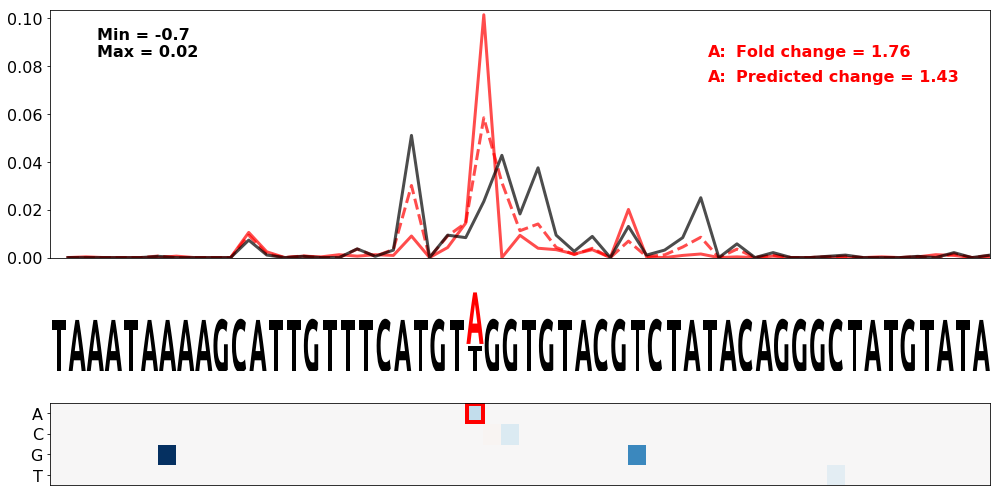

Gene = GLA.6
WT seq = AATCCCACAGGCACTGTTTTGCTTCAGCTAGAAAATACAATGCAGATGTCATTAAAAGACTTACTTTAAAATGTTTATTTTATTGCCAACTACTACTTCCTGTCCACCTTTTTCTCCATTCACTTTAAAAGCTCAAGGCTAGGTGGCTCATGCCTGTAATCCCA
SNV pos = 75
SNV nt = A
ClinVar id = Missing


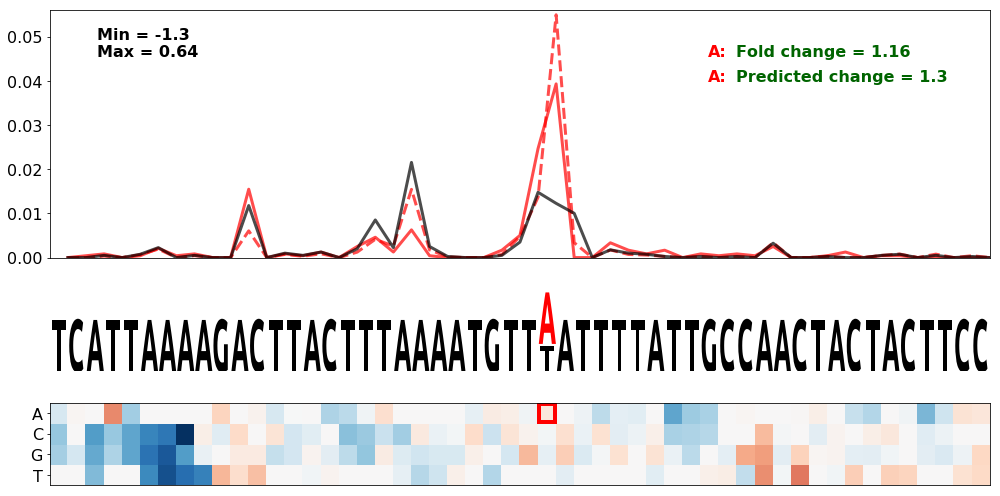

Gene = TPMT.3
WT seq = TACATTTTAATTAAACAATCTATATGGAACAAACATTCCCAAATTCTAAGAATAAATTTTTCTTTAAGTTTTCTCTGAGTTTGGCAATTGTTGTTTTTTATAATTTAATCTGTTTAAATCATCAGGTCTTATAAAATATAATGTACTTAGAGCTGGATTCATGG
SNV pos = 72
SNV nt = T
ClinVar id = Missing


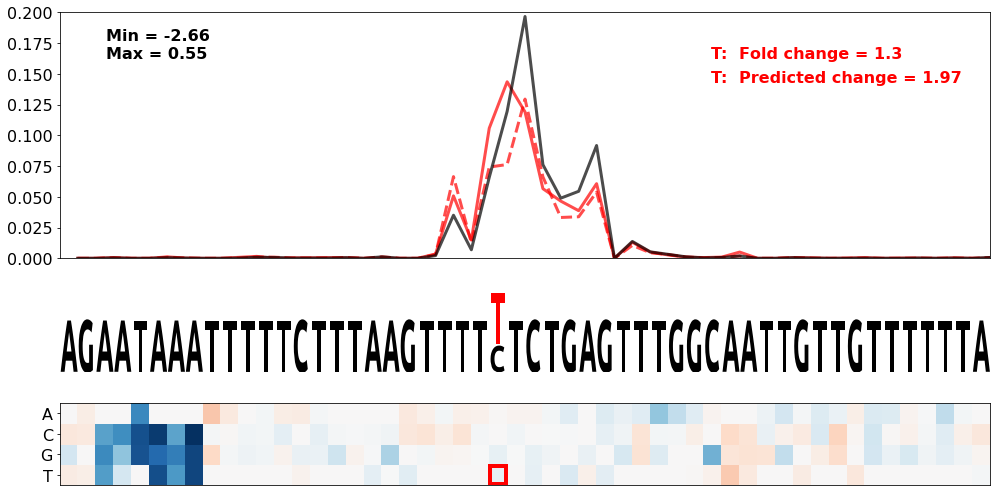

Gene = ARSA.1
WT seq = GCTAACCCAGTGTCTCCAGCTGCCTACCTGGAGAGCTCCAAGCGTAAGAAAATAAACCCTGCCTGTTGAAGCCACTGCTAGTGAGGGTTCTGTTATTTGCAGCCAAAAGCCTTGCTGGAATGTGGCCTATGAATGGTTGTGTGGCGGGCACATGTGCCTGCGTG
SNV pos = 75
SNV nt = A
ClinVar id = Missing


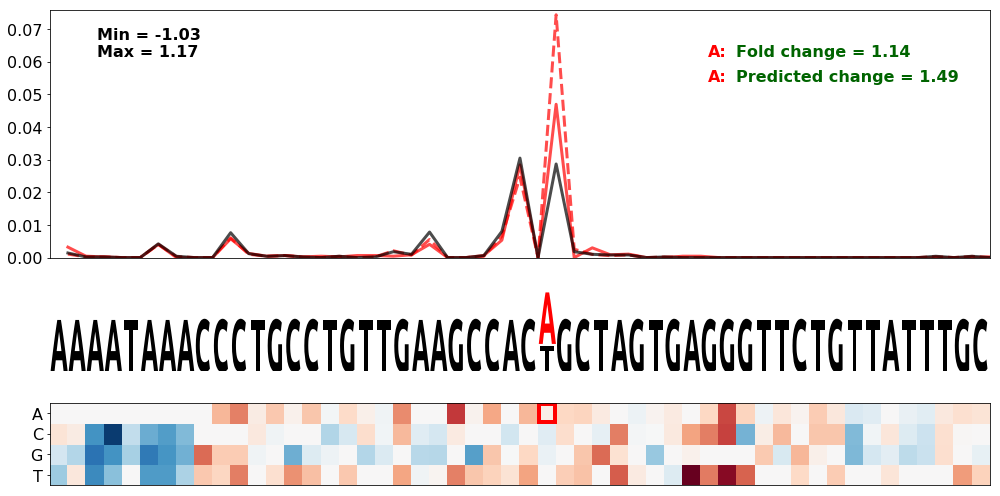

Gene = ARSA.1
WT seq = GCTAACCCAGTGTCTCCAGCTGCCTACCTGGAGAGCTCCAAGCGTAAGAAAATAAACCCTGCCTGTTGAAGCCACTGCTAGTGAGGGTTCTGTTATTTGCAGCCAAAAGCCTTGCTGGAATGTGGCCTATGAATGGTTGTGTGGCGGGCACATGTGCCTGCGTG
SNV pos = 73
SNV nt = T
ClinVar id = Missing


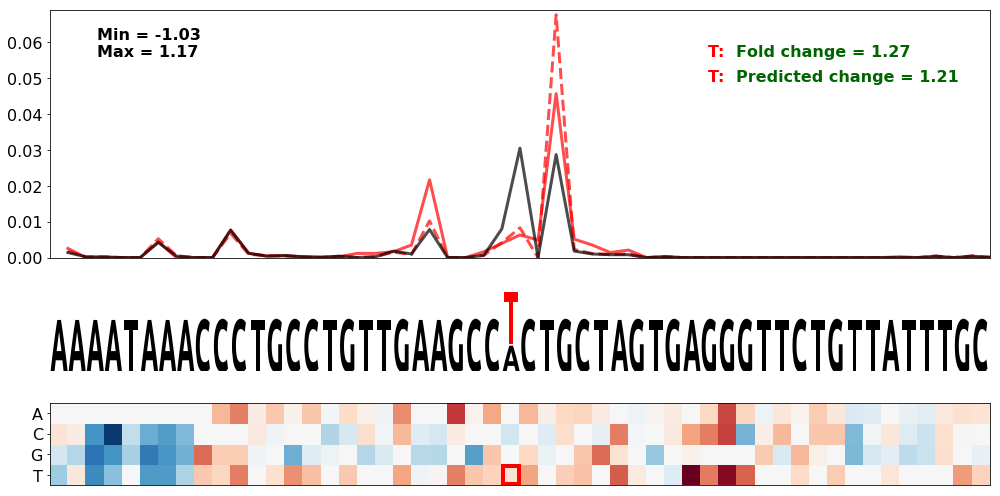

Gene = ARSA.1
WT seq = GCTAACCCAGTGTCTCCAGCTGCCTACCTGGAGAGCTCCAAGCGTAAGAAAATAAACCCTGCCTGTTGAAGCCACTGCTAGTGAGGGTTCTGTTATTTGCAGCCAAAAGCCTTGCTGGAATGTGGCCTATGAATGGTTGTGTGGCGGGCACATGTGCCTGCGTG
SNV pos = 73
SNV nt = C
ClinVar id = Missing


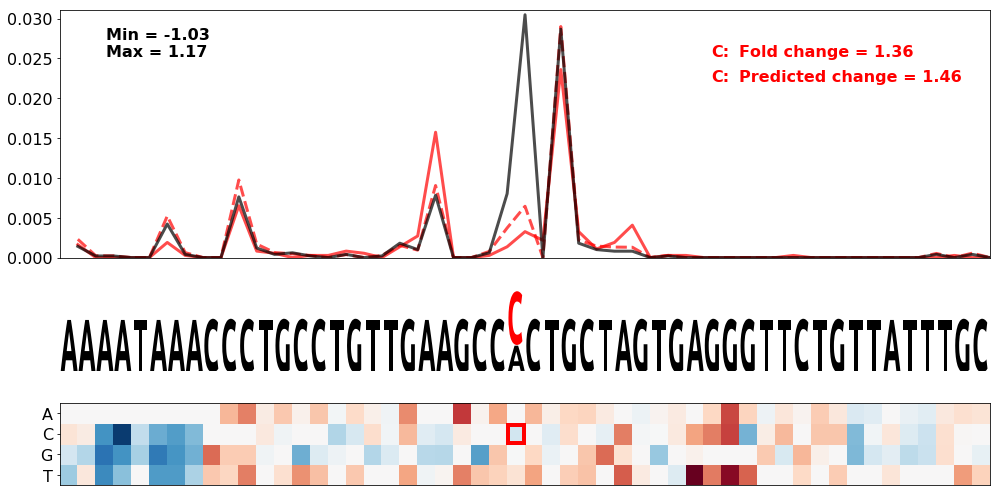

In [35]:
print('Interesting cut alteration examples:')

experiment_name = 'cut_alteration'

gene_names = [
    'TPM1.7',
    'CPOX.2',
    'RYR2.5',
    'TGFBR2.6',
    'MSH2.1',
    'HBA2.2',
    'TP53.3',
    'PRKAG2.2',
    'TP53.3',
    'MRPS16.7',
    'FOXC1.2',
    'FOXC1.2',
    'FOLR1.1',
    'BRCA1.1',
    'BRCA1.1',
    'RB1.14',
    'GLA.6',
    'TPMT.3',
    'ARSA.1',
    'ARSA.1',
    'ARSA.1'
]

snv_list = [
    [(79, 'C', 'red')],
    [(77, 'G', 'red')],
    [(75, 'G', 'red')],
    [(77, 'A', 'red')],
    [(72, 'G', 'red')],
    [(71, 'C', 'red')],
    [(73, 'A', 'red')],
    [(76, 'A', 'red')],
    [(70, 'A', 'red')],
    [(78, 'A', 'red')],
    [(68, 'A', 'red')],
    [(77, 'G', 'red')],
    [(67, 'G', 'red')],
    [(71, 'A', 'red')],
    [(72, 'A', 'red')],
    [(71, 'A', 'red')],
    [(75, 'A', 'red')],
    [(72, 'T', 'red')],
    [(75, 'A', 'red')],
    [(73, 'T', 'red')],
    [(73, 'C', 'red')]
]

wt_seq_list = [
    'GAACCTTGAACAGATACAACTAATTTACATATTACTAACCAAACTTAAACATTAAACTTTTTCTACTACTTTAAATTCTAACCTGGAATGTTTCAGAGTTCTTCATTCTAATATCACCCTGAATTCCATTGAAGCTGGAAATGTCATTTTCCAAGCCCACCTGT',
    'TATGATTTCTTTGTTCATATATTATGAATGTATTATTTTATTTGCTTCGTAATAAAGTTTATAAGGAAGAGCATCTCATACATATCATTATCGTGGAACACGTTGAATGTTTGTGATTCTGTGTGGCCTTTTTGGGGCTGGAAAATGTATGAATTCTTCAACTG',
    'AGAAACAAGTTGATCAACGTGAGAGAAATTTCATGATAATTATTCATAGTAATAAAGTGTCGTGGGCTTAATTGTATATCTGGAGCCAGTGTCATCCACCAACAATGTGATACAATATGAACTTGACAGTAGTTTTGGGTTTTGCTCATTCTTTCAGCCACCTG',
    'CACTGTAAACATTAGCTCTTTCCACTGCCTACCTGGACCCCAGTCTAGGAATTAAATCTGCACCTAACCAAGGTCCCTTGTAAGAAATGTCCATTCAAGCAGTCATTCTCTGGGTATATAATATGATTTTGACTACCTTATCTGGTGTTAAGATTTGAAGTTGG',
    'ACTGTTTGCAATTGACATAGGCAATAATAAGTGATGTGCTGAATTTTATAAATAAAATCATGTAGTTTGTGGAATTTGAGATGCATTGTAGTTCTTCGCAGTGTGACTTCAAATATTTTGGAAGAAACAAATAGCTCAGAGACCTCGTAAAATATCTTAAACTG',
    'CTCCCAACGGGCCCTCCTCCCCTCCTTGCACCGGCCCTTCCTGGTCTTTGAATAAAGTCTGAGTGGGCAGCAGCCTGTGTGTGCCTGGGTTCTCTCTATCCCGGAATGTGCCAACAATGGAGGTGTTTACCTGTCTCAGACCAAGGACCTCTCTGCAGCTGCAT',
    'CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG',
    'TGCAATTTTTTTACACATCTTTTGGTGGAGTAAACTTCACCACATCCATGAATAAACTCTCAGTTATTTTGAAATGGCAAATTTCTCATTATTTAAGTTTGGATCTGGAAAGGACATGACTTCTGAAATAGCCGCTGCTGGGTTTTAAAAGCTGAGGTCTCTCA',
    'CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG',
    'GGTCCTTTTGAAACACTGCAGCGATCTTAATTTTGTTAGATTTGGAGTTCAATAAATGGAGTATCCTGAGTTGCCCTTGCTCTTCTGGCCTGGCCTGCACAGGGCCCAGGGAGAGATTTGTTCTTGTGTGACTTAGAGCTGGGTGTGGGTACTAATTAGCTTTT',
    'TCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCA',
    'TCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCA',
    'CCCAACTATTTGGTTCCTGCTCCATGGTCGGGCCTCTGACAGCCACTTTGAATAAACCAGACACCGCACATGTGTCTTGAGAATTATTTGGATATGAATGGGAACGTGACTGTTTTGTTTTCCAATTCCCATTGATTGAAACCAGTGAGACTGGGCCAATTCCT',
    'ACTTGATTGTACAAAATACGTTTTGTAAATGTTGTGCTGTTAACACTGCAAATAAACTTGGTAGCAAACACTTCCACCATGAATGACTGTTCTTGAGACTTAGGCCAGCCGACTTTCTCAGAGCCTTTTCACTGTGCTTCAGTCTCCCACTCTGTAAAATGGGG',
    'ACTTGATTGTACAAAATACGTTTTGTAAATGTTGTGCTGTTAACACTGCAAATAAACTTGGTAGCAAACACTTCCACCATGAATGACTGTTCTTGAGACTTAGGCCAGCCGACTTTCTCAGAGCCTTTTCACTGTGCTTCAGTCTCCCACTCTGTAAAATGGGG',
    'ATAATTTACAGAAAGCTACAGAAATCATATTTACCAGGACACATCTGTTAAATAAAAGCATTGTTTCATGTTGGTGTACGTCTATACAGGGCTATGTATAACCGACTCCTGTTTCTCCTCCCTGCAACCACAGAACCATCACACACACACACACACACACACAC',
    'AATCCCACAGGCACTGTTTTGCTTCAGCTAGAAAATACAATGCAGATGTCATTAAAAGACTTACTTTAAAATGTTTATTTTATTGCCAACTACTACTTCCTGTCCACCTTTTTCTCCATTCACTTTAAAAGCTCAAGGCTAGGTGGCTCATGCCTGTAATCCCA',
    'TACATTTTAATTAAACAATCTATATGGAACAAACATTCCCAAATTCTAAGAATAAATTTTTCTTTAAGTTTTCTCTGAGTTTGGCAATTGTTGTTTTTTATAATTTAATCTGTTTAAATCATCAGGTCTTATAAAATATAATGTACTTAGAGCTGGATTCATGG',
    'GCTAACCCAGTGTCTCCAGCTGCCTACCTGGAGAGCTCCAAGCGTAAGAAAATAAACCCTGCCTGTTGAAGCCACTGCTAGTGAGGGTTCTGTTATTTGCAGCCAAAAGCCTTGCTGGAATGTGGCCTATGAATGGTTGTGTGGCGGGCACATGTGCCTGCGTG',
    'GCTAACCCAGTGTCTCCAGCTGCCTACCTGGAGAGCTCCAAGCGTAAGAAAATAAACCCTGCCTGTTGAAGCCACTGCTAGTGAGGGTTCTGTTATTTGCAGCCAAAAGCCTTGCTGGAATGTGGCCTATGAATGGTTGTGTGGCGGGCACATGTGCCTGCGTG',
    'GCTAACCCAGTGTCTCCAGCTGCCTACCTGGAGAGCTCCAAGCGTAAGAAAATAAACCCTGCCTGTTGAAGCCACTGCTAGTGAGGGTTCTGTTATTTGCAGCCAAAAGCCTTGCTGGAATGTGGCCTATGAATGGTTGTGTGGCGGGCACATGTGCCTGCGTG'
]

seq_start = 48
seq_end = 100

save_figs = False

for gene_name, snvs, specific_seq in zip(gene_names, snv_list, wt_seq_list) :
    df_sel = human_variant_df.copy().set_index('master_seq')
    if specific_seq is not None :
        df_sel = human_variant_df.query("wt_seq == '" + specific_seq + "'").copy().set_index('master_seq')

    df_sel['delta_logodds_pred'] = df_sel['mean_delta_logodds_pred']
    
    print('Gene = ' + gene_name)
    print('WT seq = ' + specific_seq)
    print('SNV pos = ' + str(snvs[0][0]))
    print('SNV nt = ' + str(snvs[0][1]))
    print('ClinVar id = ' + str(df_sel.loc[df_sel.index.str.slice(snvs[0][0], snvs[0][0]+1) == snvs[0][1]].query("gene == '" + gene_name + "' and snv_pos == " + str(snvs[0][0]))['clinvar_id'].values[0]))
    
    fig_name = None
    if save_figs :
        fig_name = experiment_name + '_' + gene_name + '_' + str(snvs[0][0]) + '_' + str(snvs[0][1]) + '_Both'
    mut_map_with_cuts(
            df_sel,
            gene_name,
            snvs,
            mode='true',
            column_suffix='',
            figsize=(14, 7),
            height_ratios=[6, 2, 2],
            bg_alpha=0.999,
            plot_simple_mutmap=True,
            annotate_folds=True,
            plot_true_cuts=True,
            plot_pred_cuts=True,
            scale_pred_cuts=True,
            fold_change_from_cut_range=[60, 90],
            ref_var_scales=[0.5, 1.0],
            border_eta = 0.06,
            seq_trim_start=seq_start, seq_trim_end=seq_end,
            plot_start=0, plot_end=seq_end-seq_start,
            plot_as_bars=False,
            pas_downscaling=0.5,
            fig_name=fig_name,
            fig_dpi=150
    )

<h2>Rare Functional Variant analysis</h2>

In [6]:
var_df = human_variant_df_filtered.query("variant == 'snv' and snv_pos != -1").copy()

mer6_weights_doubledope = np.load('apa_6mer_weights/apa_6mer_v_general3_antimisprime_orig_pasaligned_margin_doubledope_weights.npy')[1:]
mer6_weights_simple = np.load('apa_6mer_weights/apa_6mer_v_general3_antimisprime_orig_pasaligned_margin_simple_weights.npy')[1:]
mer6_weights_tomm5 = np.load('apa_6mer_weights/apa_6mer_v_general3_antimisprime_orig_pasaligned_margin_tomm5_weights.npy')[1:]

mer6_weights_use = (mer6_weights_tomm5[:4096] + mer6_weights_simple[:4096]) / 2.
mer6_weights_pas = mer6_weights_doubledope[4096:2*4096]
mer6_weights_dse = (mer6_weights_tomm5[2*4096:] + mer6_weights_simple[2*4096:]) / 2.

var_df = append_6mer_delta_logodds_scores(var_df, mer6_weights_use, mer6_weights_pas, mer6_weights_dse)
var_df['delta_logodds_pred'] = var_df['mean_delta_logodds_pred']


n variants = 12348
n variants (stat. signi.) = 3771
n variants (stat. signi. & strong preds) = 2330
n variants (stat. signi. & strong preds & correct APARENT) = 2180
n variants (stat. signi. & strong preds & disagree) = 257


/home/johli/anaconda3/envs/aparent/lib/python3.6/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  return getattr(obj, method)(*args, **kwds)


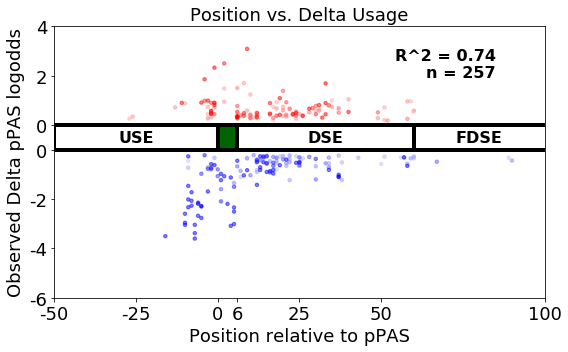

n variants (stat. signi. & strong preds & disagree) = 35


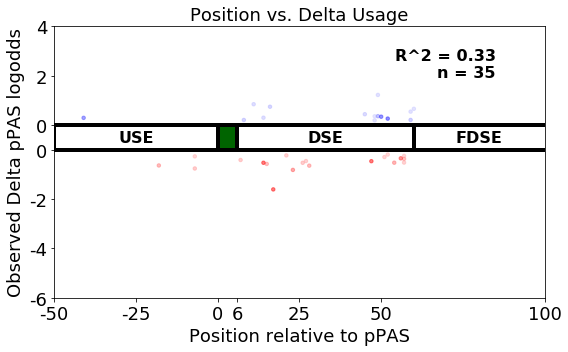

In [7]:
save_figs = False

p_thresh = 0.00001

print('n variants = ' + str(len(var_df)))

#Filter on significant variants
discrep_index = (var_df['delta_p_val'] < p_thresh)
print('n variants (stat. signi.) = ' + str(len(var_df.loc[discrep_index])))

#Filter on > 0.1 predicted log fold change
discrep_index = discrep_index & (np.abs(var_df['delta_6mer_score']) > 0.11)
discrep_index = discrep_index & (np.abs(var_df['delta_logodds_pred']) > 0.115)
print('n variants (stat. signi. & strong preds) = ' + str(len(var_df.loc[discrep_index])))

#Calculate the number of correctly predicted variants (using APARENT)
discrep_index_correct = discrep_index & (np.sign(var_df['delta_logodds_true']) == np.sign(var_df['delta_logodds_pred']))
print('n variants (stat. signi. & strong preds & correct APARENT) = ' + str(len(var_df.loc[discrep_index_correct])))

#Filter on sign of APARENT prediction not equal to sign of hexamer predictions, APARENT correct
discrep_index = discrep_index & ((np.sign(var_df['delta_logodds_true']) != np.sign(var_df['delta_6mer_score'])) & (np.sign(var_df['delta_logodds_true']) == np.sign(var_df['delta_logodds_pred'])))
print('n variants (stat. signi. & strong preds & disagree) = ' + str(len(var_df.loc[discrep_index])))

#Plot position scatter of variants
discrep_df = var_df.iloc[np.nonzero(discrep_index)[0]].copy()
fig_name = None
if save_figs :
    fig_name = 'rare_variants_neural_net_agrees_with_obs'
plot_position_delta_scatter(discrep_df, min_pred_filter=0.0, figsize=(8, 5), fig_name=fig_name, fig_dpi=150, annotate=None)

discrep_index = (var_df['delta_p_val'] < p_thresh)
discrep_index = discrep_index & (np.abs(var_df['delta_6mer_score']) > 0.11)
discrep_index = discrep_index & (np.abs(var_df['delta_logodds_pred']) > 0.115)

#Filter on sign of APARENT prediction not equal to sign of hexamer predictions, hexamer model correct
discrep_index = discrep_index & ((np.sign(var_df['delta_logodds_true']) == np.sign(var_df['delta_6mer_score'])) & (np.sign(var_df['delta_logodds_true']) != np.sign(var_df['delta_logodds_pred'])))
print('n variants (stat. signi. & strong preds & disagree) = ' + str(len(var_df.loc[discrep_index])))

discrep_df = var_df.iloc[np.nonzero(discrep_index)[0]].copy()

#Plot position scatter of variants
fig_name = None
if save_figs :
    fig_name = 'rare_variants_6mer_model_agrees_with_obs'
plot_position_delta_scatter(discrep_df, min_pred_filter=0.0, figsize=(8, 5), fig_name=fig_name, fig_dpi=150, annotate=None)


<h2>Gain/Loss of canonical CSE Hexamer (AATAAA/ATTAAA)</h2>

Gain of Motif (Neural Net model)


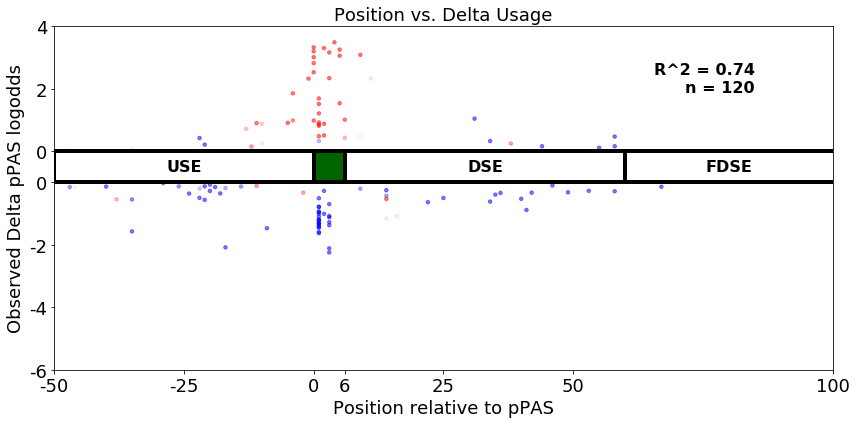

Gain of Motif (Hexamer model)


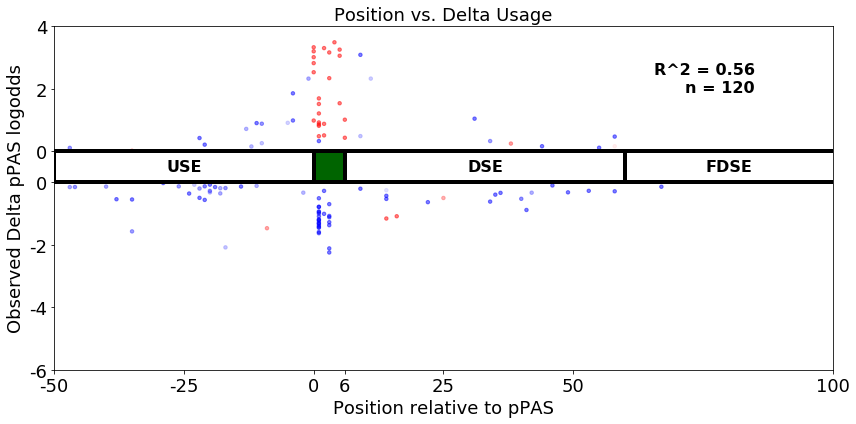


# Gain of ['AATAAA', 'ATTAAA'] = 120
# Neural net / Observation agreement = 103
# Neural net / 6-mer model agreement = 100
## Gain of motif in USE = 39
### Gain of motif, Loss of function = 26
### Gain of motif, Gain of function = 13
### Neural net / 6-mer model agreement = 26
## Gain of motif in DSE = 31
### Gain of motif, Loss of function = 19
### Gain of motif, Gain of function = 12
### Neural net / 6-mer model agreement = 24
Loss of Motif (Neural Net model)


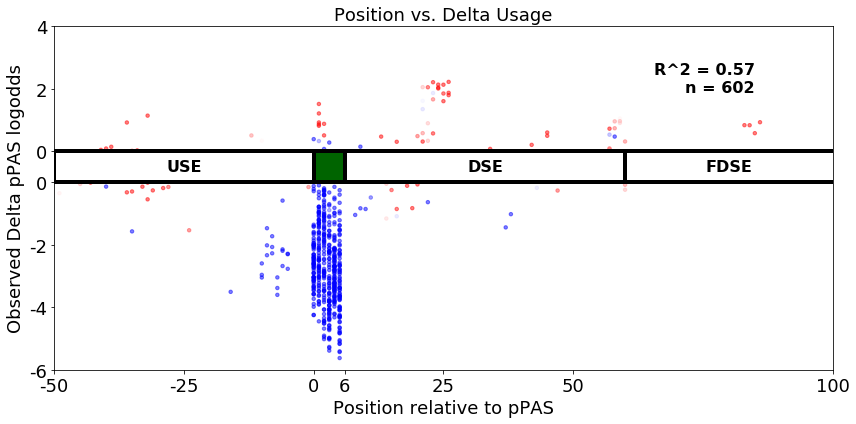

Loss of Motif (Hexamer model)


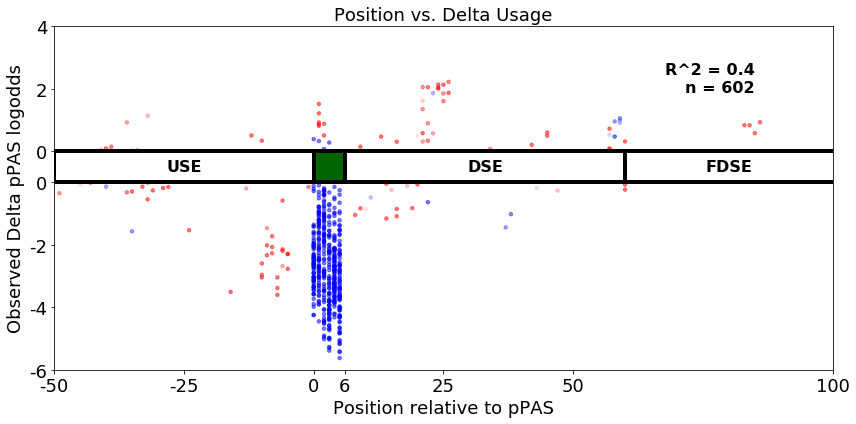


# Loss of ['AATAAA', 'ATTAAA'] = 602
# Neural net / Observation agreement = 567
# Neural net / 6-mer model agreement = 566
## Loss of motif in USE = 45
### Loss of motif, Loss of function = 36
### Loss of motif, Gain of function = 9
### Neural net / 6-mer model agreement = 23
## Loss of motif in DSE = 63
### Loss of motif, Loss of function = 19
### Loss of motif, Gain of function = 44
### Neural net / 6-mer model agreement = 49


In [9]:
#Gain/Loss of de novo canonical PAS (CSE Hexamer)
motifs = ['AATAAA', 'ATTAAA']
plot_gain_loss_of_motifs(var_df, motifs, name_prefix='canonical_pas', plot_logos=False, save_figs=False)


Gain of canonical competing CSE:
Gene = PTEN.15
WT seq = ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA
SNV pos = 88
SNV nt = T
ClinVar id = Missing


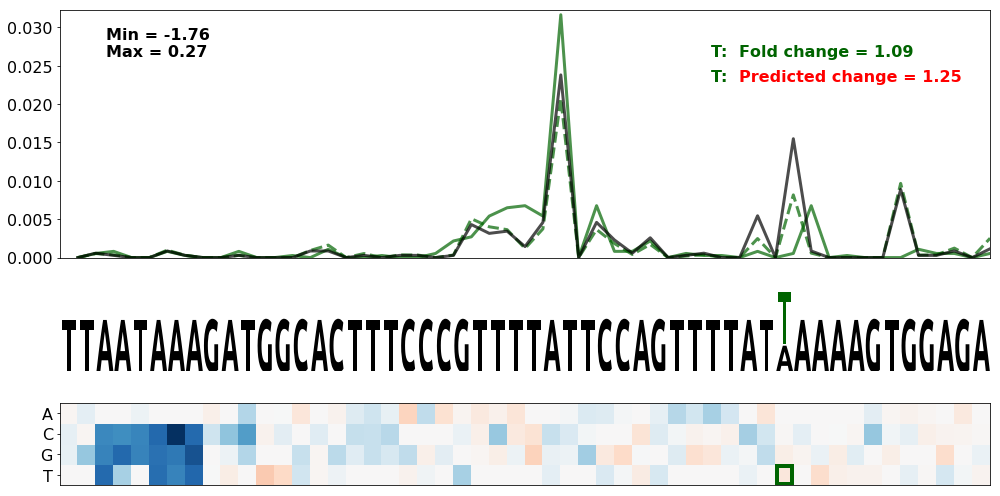

Gene = SMAD4.1
WT seq = AGCTTTAGGTCTAAAGACGATGGTGAATTATGTAGGTTTAAGTTGTTGGAATTAAAACTAAAAGCTTCTTTTGATAAAAGTCGTTATAACATTTTGTGACTCTATTAATAGAAGTGGCTTTTTCTTTGCTTTCCAGGTTTTTGGGCGAGTTTTAAAGAAGTATT
SNV pos = 75
SNV nt = T
ClinVar id = Missing


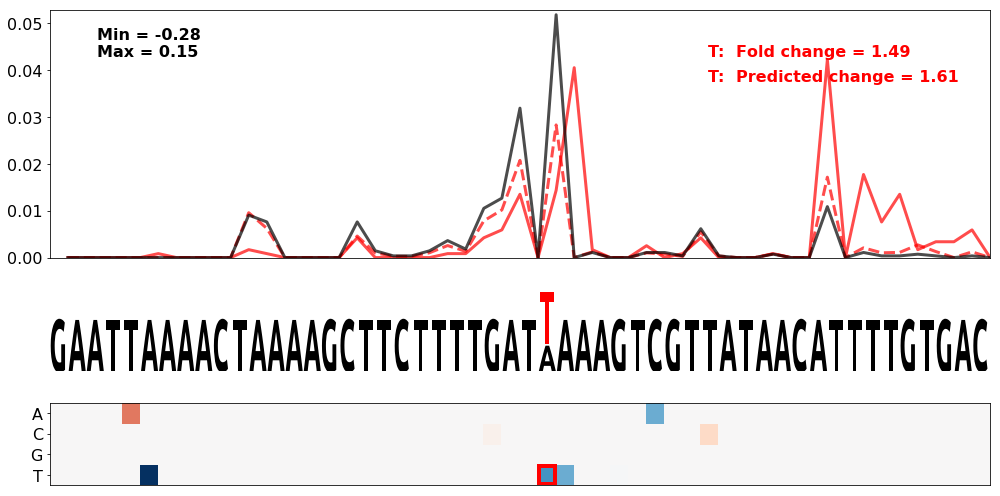

Loss of canonical competing CSE:
Gene = COL3A1.1
WT seq = TGTAAGCTTGTATGTGGTTGTTGATCTTTTTTTTCCTTACAGACACCCATAATAAAATATCATATTAAAATTCTCCTGTTTTTTGTCACTTTTCAAAGATTTAAAAAATGCACGTCTACATTAAGGAACTCCAGTAATCTTGAAAAAGTATATTGAATTCTAAC
SNV pos = 68
SNV nt = C
ClinVar id = Missing


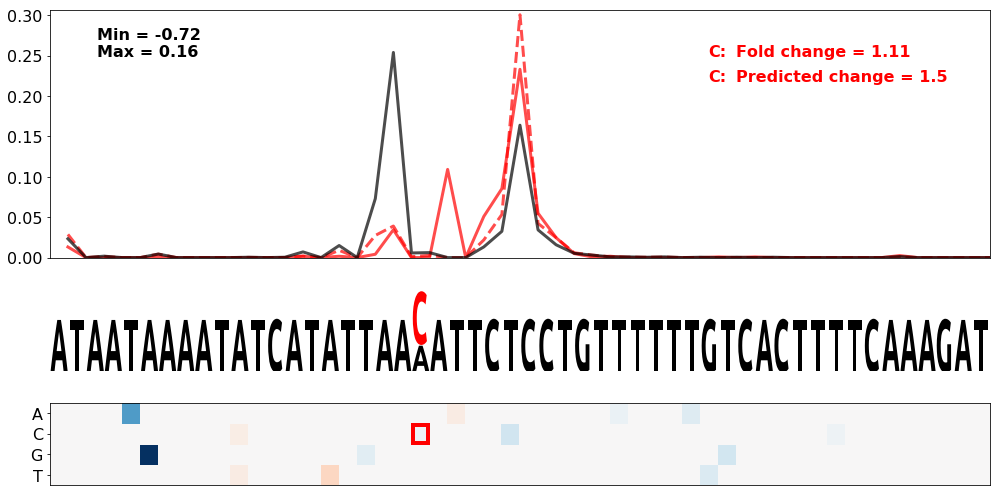

Gene = PTEN.12
WT seq = TTTGTTAACAACCCTTTATCTCTTAGTGTTATAAACTCCACTTAAAACTGATTAAAGTCTCATTCTTGTCATTGTGTGGGTGTTTTATTAAATGAGAGTTTATAATTCAAATTGCTTAAGTCCATTGAAGTTTTAATTAATGGGCAGCCAAATGTGAATACAAA
SNV pos = 87
SNV nt = G
ClinVar id = Missing


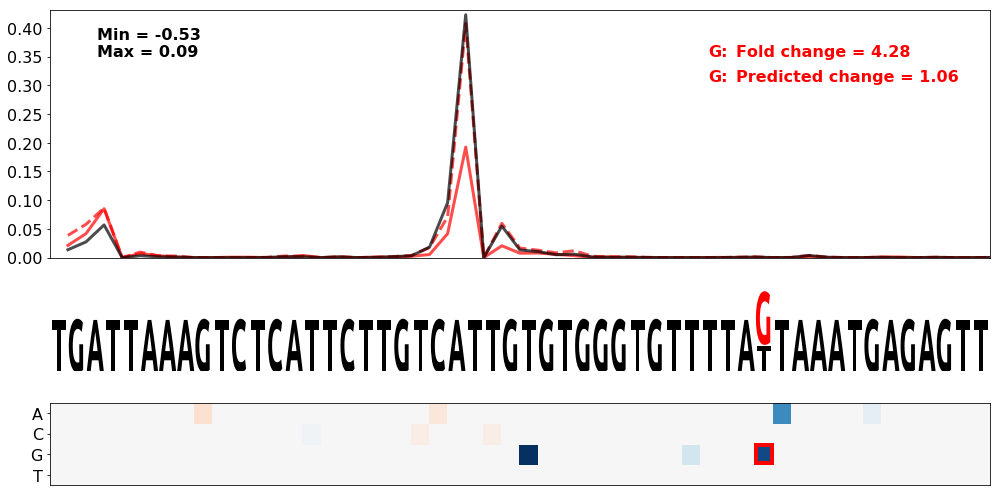

Gene = COL3A1.1
WT seq = TGTAAGCTTGTATGTGGTTGTTGATCTTTTTTTTCCTTACAGACACCCATAATAAAATATCATATTAAAATTCTCCTGTTTTTTGTCACTTTTCAAAGATTTAAAAAATGCACGTCTACATTAAGGAACTCCAGTAATCTTGAAAAAGTATATTGAATTCTAAC
SNV pos = 63
SNV nt = T
ClinVar id = Missing


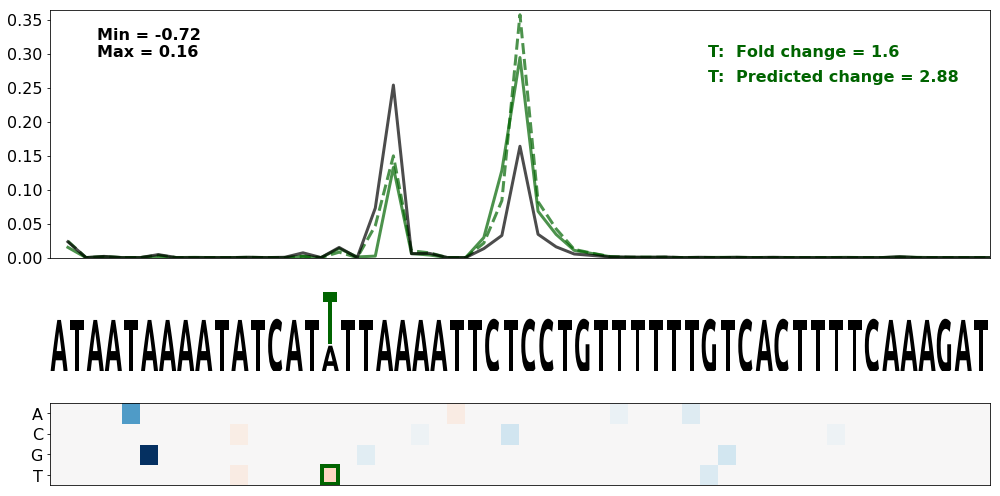

Gene = TMEM43.3
WT seq = AAAATTTGAAAGCTTTGGAAAACCAAATTTGTAATATCATTGTATTTTTTATTAAAAGTTTTGTAATAAATTTCTAAATTATCTTCTGGTGTGGGACTTTAACAAACATCCTATTTTTAGTTTCAGATTTTTTTTTTTTGGCATTCTTTCCAAAATGTCTGTAA
SNV pos = 66
SNV nt = G
ClinVar id = Missing


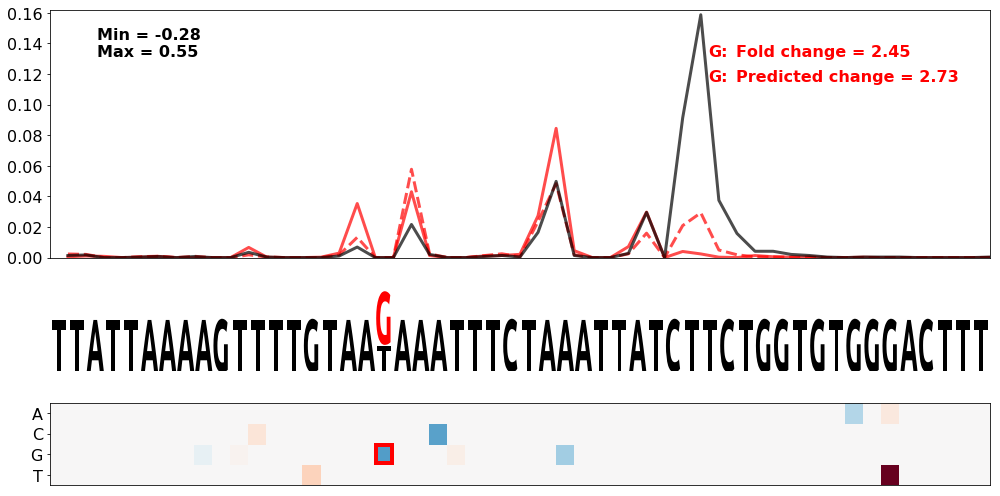

Gene = TMEM43.3
WT seq = AAAATTTGAAAGCTTTGGAAAACCAAATTTGTAATATCATTGTATTTTTTATTAAAAGTTTTGTAATAAATTTCTAAATTATCTTCTGGTGTGGGACTTTAACAAACATCCTATTTTTAGTTTCAGATTTTTTTTTTTTGGCATTCTTTCCAAAATGTCTGTAA
SNV pos = 69
SNV nt = C
ClinVar id = Missing


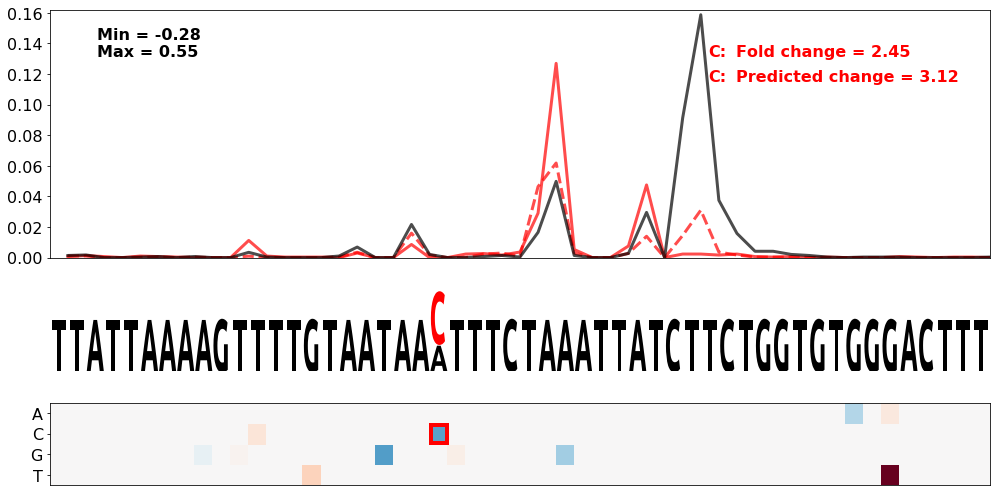

In [13]:
print('Gain of canonical competing CSE:')

experiment_name = 'gain_of_cse'

gene_names = [
    'PTEN.15',
    'SMAD4.1'
]

snv_list = [
    [(88, 'T', 'darkgreen')],
    [(75, 'T', 'red')]
]

wt_seq_list = [
    'ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA',
    'AGCTTTAGGTCTAAAGACGATGGTGAATTATGTAGGTTTAAGTTGTTGGAATTAAAACTAAAAGCTTCTTTTGATAAAAGTCGTTATAACATTTTGTGACTCTATTAATAGAAGTGGCTTTTTCTTTGCTTTCCAGGTTTTTGGGCGAGTTTTAAAGAAGTATT'
]

plot_variant_selection(human_variant_df, gene_names, snv_list, wt_seq_list, experiment_name, fold_change_from_cut_range=[60, 90], seq_start=48, seq_end=100, save_figs=False)

print('Loss of canonical competing CSE:')

experiment_name = 'loss_of_cse'

gene_names = [
    'COL3A1.1',
    'PTEN.12',
    'COL3A1.1',
    'TMEM43.3',
    'TMEM43.3'
]

snv_list = [
    [(68, 'C', 'red')],
    [(87, 'G', 'red')],
    [(63, 'T', 'darkgreen')],
    [(66, 'G', 'red')],
    [(69, 'C', 'red')]
]

wt_seq_list = [
    'TGTAAGCTTGTATGTGGTTGTTGATCTTTTTTTTCCTTACAGACACCCATAATAAAATATCATATTAAAATTCTCCTGTTTTTTGTCACTTTTCAAAGATTTAAAAAATGCACGTCTACATTAAGGAACTCCAGTAATCTTGAAAAAGTATATTGAATTCTAAC',
    'TTTGTTAACAACCCTTTATCTCTTAGTGTTATAAACTCCACTTAAAACTGATTAAAGTCTCATTCTTGTCATTGTGTGGGTGTTTTATTAAATGAGAGTTTATAATTCAAATTGCTTAAGTCCATTGAAGTTTTAATTAATGGGCAGCCAAATGTGAATACAAA',
    'TGTAAGCTTGTATGTGGTTGTTGATCTTTTTTTTCCTTACAGACACCCATAATAAAATATCATATTAAAATTCTCCTGTTTTTTGTCACTTTTCAAAGATTTAAAAAATGCACGTCTACATTAAGGAACTCCAGTAATCTTGAAAAAGTATATTGAATTCTAAC',
    'AAAATTTGAAAGCTTTGGAAAACCAAATTTGTAATATCATTGTATTTTTTATTAAAAGTTTTGTAATAAATTTCTAAATTATCTTCTGGTGTGGGACTTTAACAAACATCCTATTTTTAGTTTCAGATTTTTTTTTTTTGGCATTCTTTCCAAAATGTCTGTAA',
    'AAAATTTGAAAGCTTTGGAAAACCAAATTTGTAATATCATTGTATTTTTTATTAAAAGTTTTGTAATAAATTTCTAAATTATCTTCTGGTGTGGGACTTTAACAAACATCCTATTTTTAGTTTCAGATTTTTTTTTTTTGGCATTCTTTCCAAAATGTCTGTAA'
]

plot_variant_selection(human_variant_df, gene_names, snv_list, wt_seq_list, experiment_name, fold_change_from_cut_range=[60, 90], seq_start=48, seq_end=100, save_figs=False)


<h2>Gain/Loss of cryptic CSE Hexamer (NATAAA/ANTAAA)</h2>

Gain of Motif (Neural Net model)


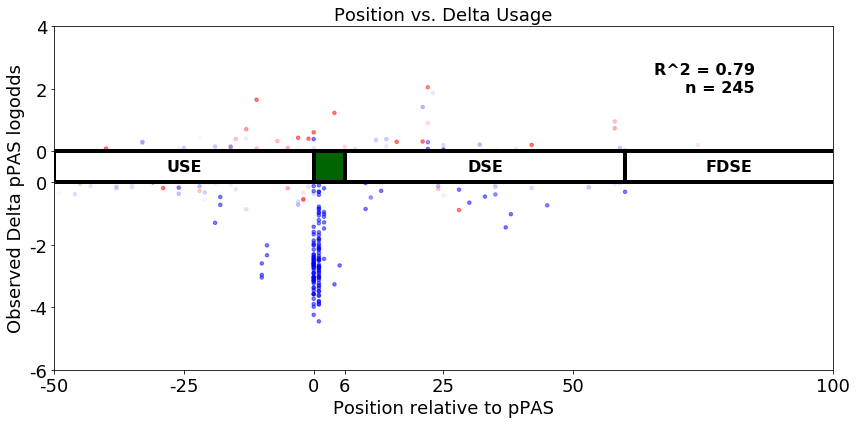

Gain of Motif (Hexamer model)


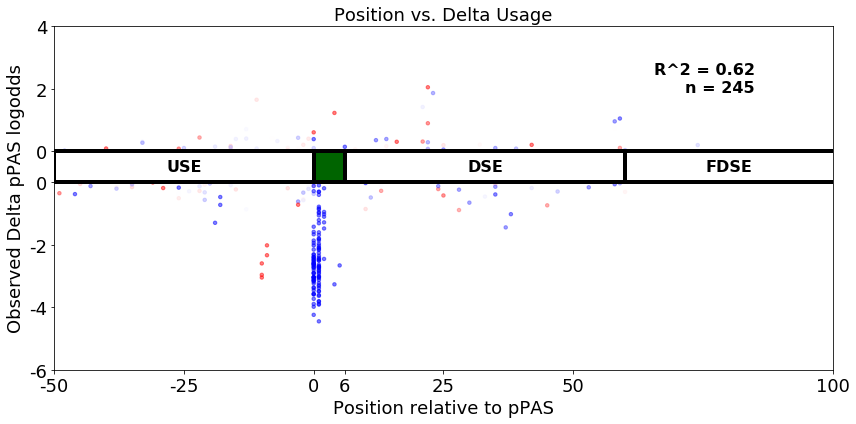


# Gain of ['TATAAA', 'GATAAA', 'CATAAA', 'ACTAAA', 'AGTAAA'] = 245
# Neural net / Observation agreement = 200
# Neural net / 6-mer model agreement = 209
## Gain of motif in USE = 67
### Gain of motif, Loss of function = 42
### Gain of motif, Gain of function = 25
### Neural net / 6-mer model agreement = 45
## Gain of motif in DSE = 50
### Gain of motif, Loss of function = 24
### Gain of motif, Gain of function = 26
### Neural net / 6-mer model agreement = 37
Loss of Motif (Neural Net model)


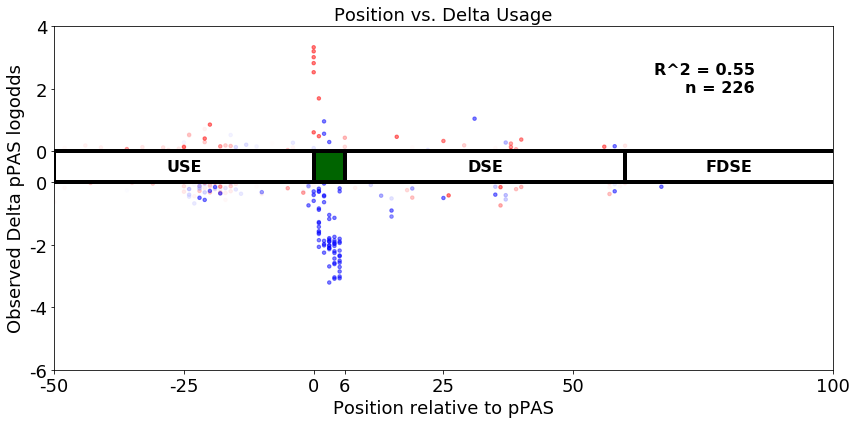

Loss of Motif (Hexamer model)


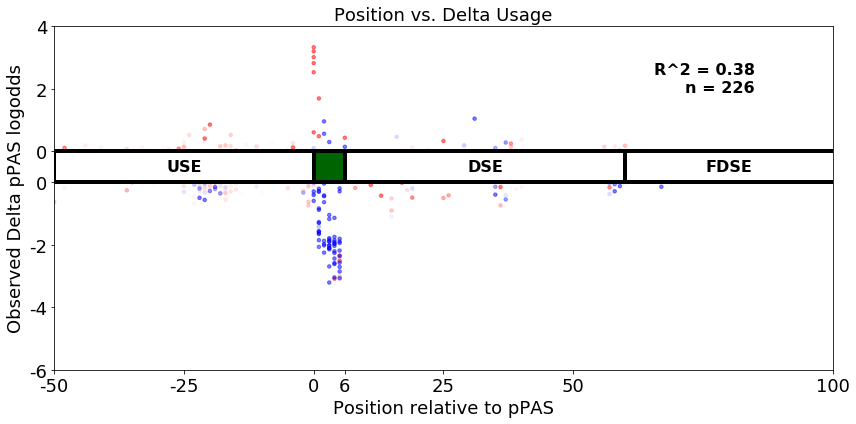


# Loss of ['TATAAA', 'GATAAA', 'CATAAA', 'ACTAAA', 'AGTAAA'] = 226
# Neural net / Observation agreement = 167
# Neural net / 6-mer model agreement = 174
## Loss of motif in USE = 96
### Loss of motif, Loss of function = 67
### Loss of motif, Gain of function = 29
### Neural net / 6-mer model agreement = 65
## Loss of motif in DSE = 49
### Loss of motif, Loss of function = 29
### Loss of motif, Gain of function = 20
### Neural net / 6-mer model agreement = 33


In [11]:
#Gain/Loss of de novo cryptic PAS (CSE Hexamer)
motifs = ['TATAAA', 'GATAAA', 'CATAAA', 'ACTAAA', 'AGTAAA']
plot_gain_loss_of_motifs(var_df, motifs, name_prefix='cryptic_pas', plot_logos=False, save_figs=False)


Gain of cryptic competing CSE:
Gene = PTEN.24
WT seq = GAGTTAAGTAATTTCACTGAAATTGATTGCTTTTTGTGTCTTGGAGTCAAAATAAATAACTGAAATCTACTATACTTGGCTCATGCTTAATTAATATACTTAGACCATATTTCGGATGAATTATTCACAGAATCTAAAGGAGTATCCTCGTGTTCTTACCTTCT
SNV pos = 72
SNV nt = A
ClinVar id = Missing


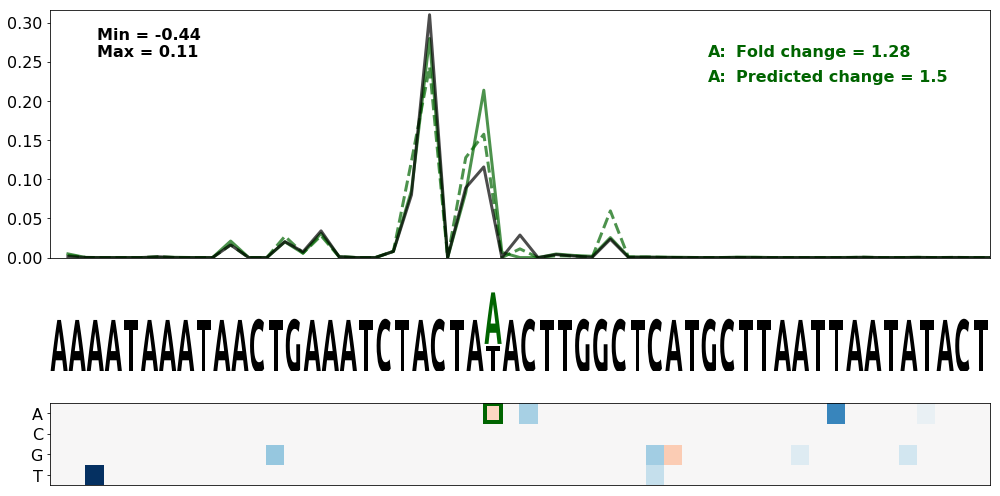

Gene = DOCK8.2
WT seq = ATTTGAGAATTAAATTATATATTTTTAATATGACTGTGACCTTGACTGATAATAAAGATGTAATAAGAATTGCAAGCTAAATGTTTCCCTTTGCAACTCATGCTTTGTGTTTTGTTTTGATGACCTACTCGCTCGTAATGTTTTGTAAGGCACTTCAGAGAGAA
SNV pos = 75
SNV nt = A
ClinVar id = NM_203447.3(DOCK8):c.*1031G>A


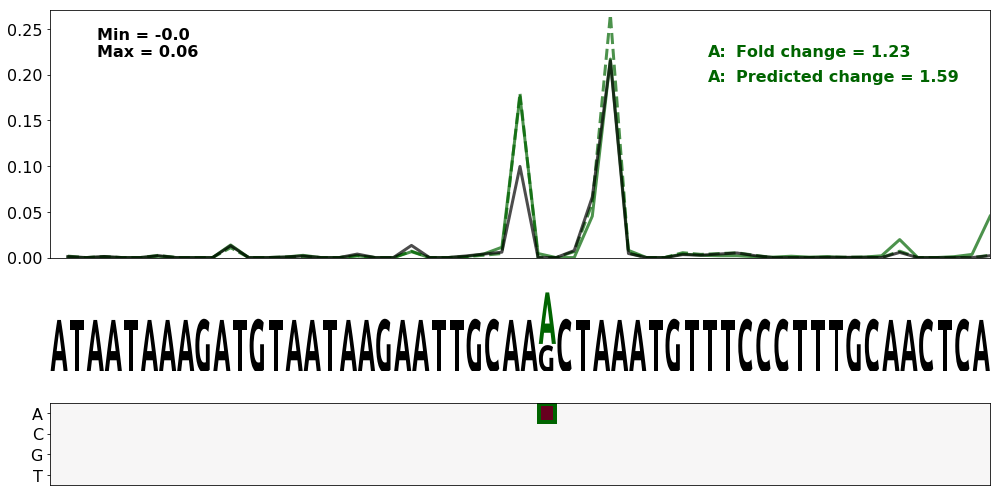

Gene = SMAD4.1
WT seq = AGCTTTAGGTCTAAAGACGATGGTGAATTATGTAGGTTTAAGTTGTTGGAATTAAAACTAAAAGCTTCTTTTGATAAAAGTCGTTATAACATTTTGTGACTCTATTAATAGAAGTGGCTTTTTCTTTGCTTTCCAGGTTTTTGGGCGAGTTTTAAAGAAGTATT
SNV pos = 72
SNV nt = C
ClinVar id = Missing


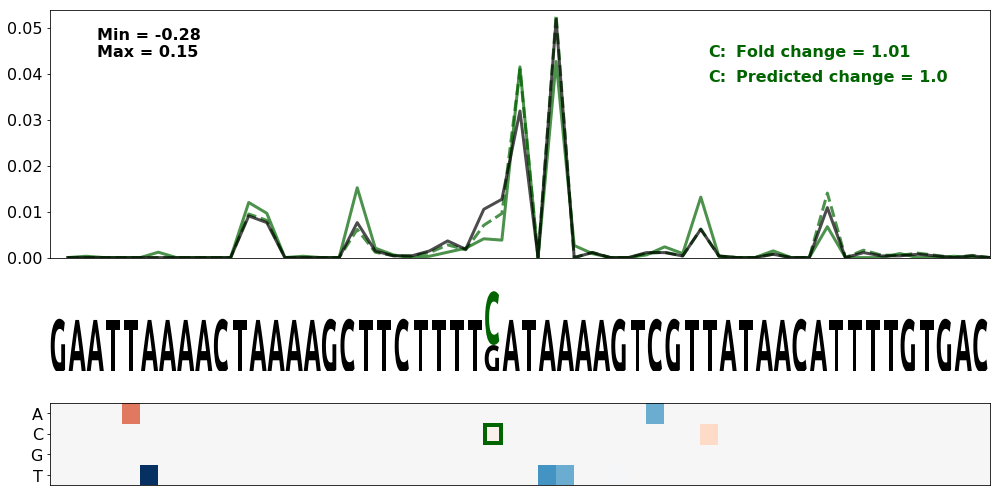

Gene = ATP7B.1
WT seq = TTTTTGTCAGATAATCATTTCTACTTCAAAAACATTTCATGCAATATTAGAATAAAGTTCCTGTCATTCCTCTAAAAATCTGCCTGTGAGTGAGATGCGTGGTCAGAGGCCAGTGCCGTCTTGTCTTCACGAGGGCTTCTGTGAGGCACTGGCTTGGCTTCATG
SNV pos = 74
SNV nt = T
ClinVar id = Missing


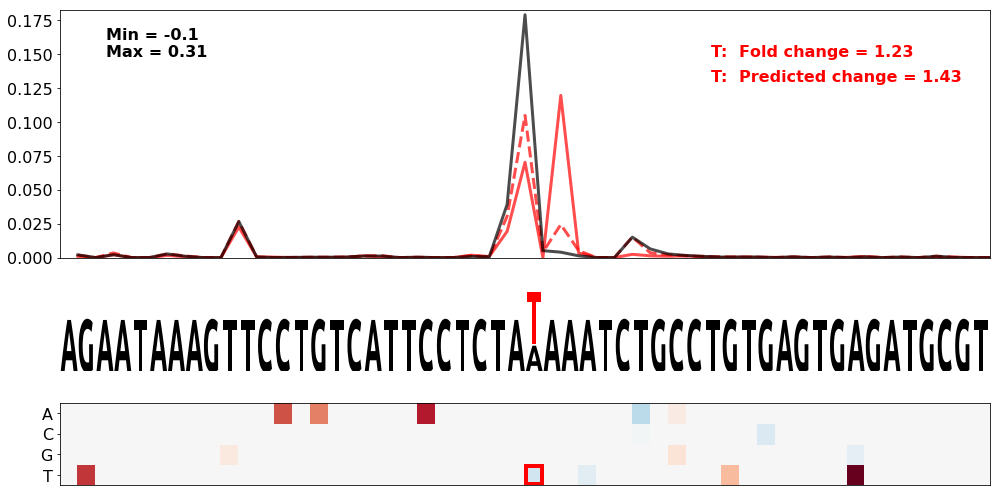

Gene = BRCA2.1
WT seq = TGTATAATATCATGTTTTCAAATCTAATTATAAATACGTTTAAAGCCAAGAATAAATCTTTTAAAAAATTGACTTGTTTCCTTCCATAACTCTGAGCCATGATTTTTCTGTTCTGTAAAAAGCATTAACAAAATTGTCTATTTTGCTACTCCCTGTAACTTAAG
SNV pos = 63
SNV nt = T
ClinVar id = Missing


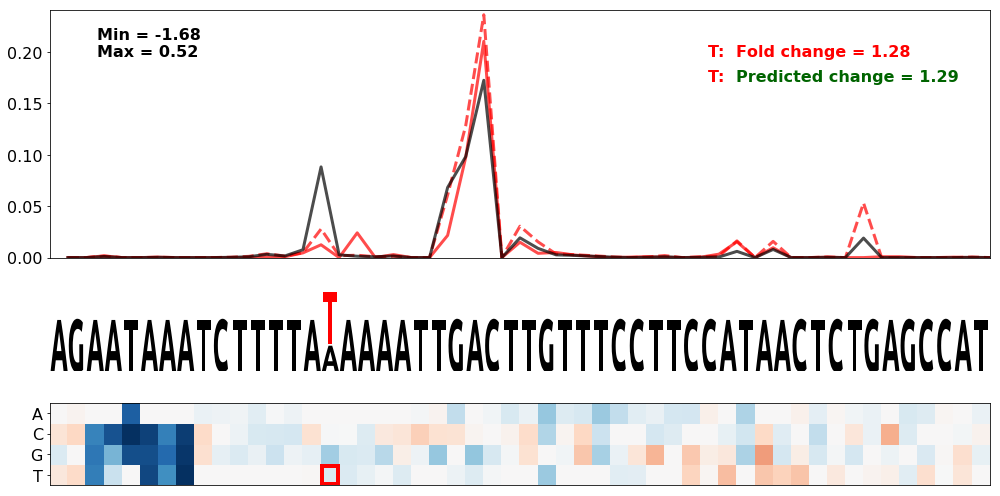

Gene = TPMT.1
WT seq = CCTAAAATCTCAAGATGGAAGATATACCACATGTAAATTATTTTAGAGCAATTAAATTGTTTTCAGGATTTTCCAAAAATGCTTCTTGTTTCATTTTATTATTTAAGTAACAGATTATCTGAGCCTCTGTGCCCTGCACACAGTGGTTTATAAATGCCTTGCCC
SNV pos = 75
SNV nt = T
ClinVar id = Missing


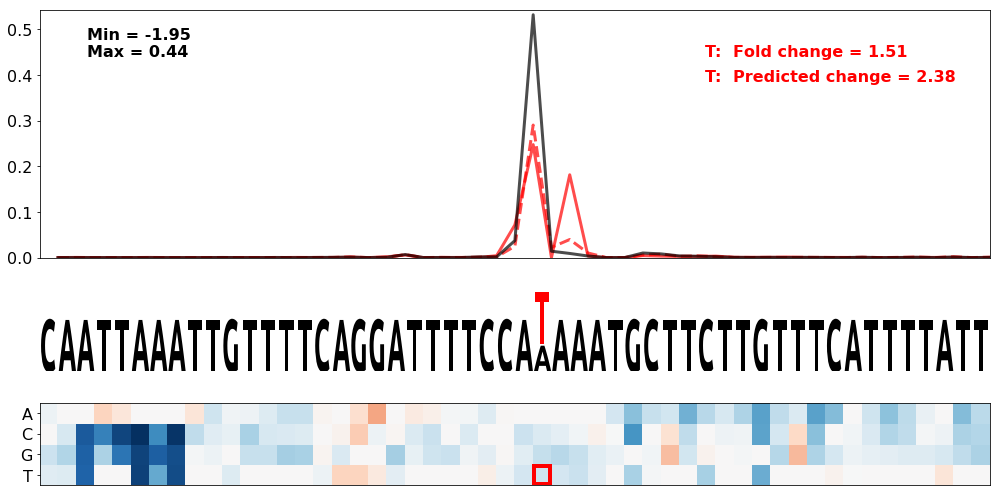

Gene = BRCA1.1
WT seq = ACTTGATTGTACAAAATACGTTTTGTAAATGTTGTGCTGTTAACACTGCAAATAAACTTGGTAGCAAACACTTCCACCATGAATGACTGTTCTTGAGACTTAGGCCAGCCGACTTTCTCAGAGCCTTTTCACTGTGCTTCAGTCTCCCACTCTGTAAAATGGGG
SNV pos = 80
SNV nt = A
ClinVar id = Missing


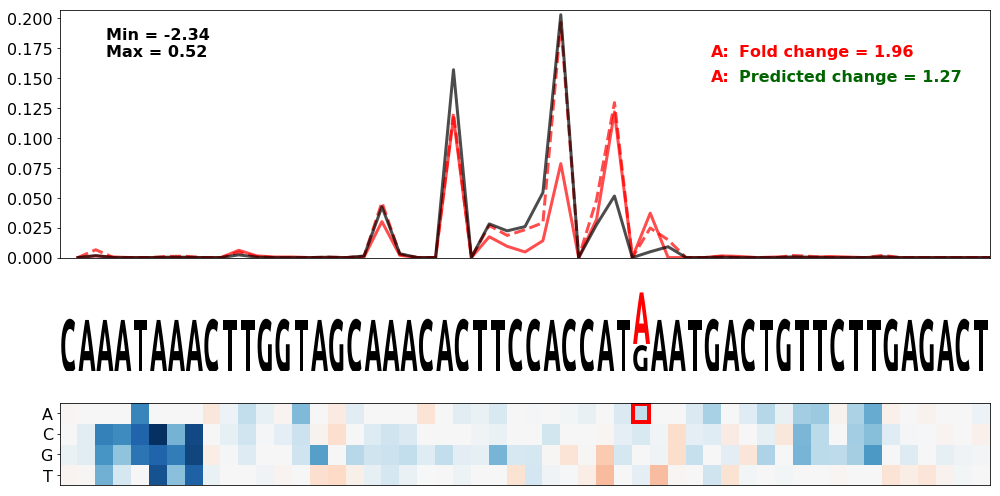

Loss of cryptic competing CSE:
Gene = SMAD4.1
WT seq = AGCTTTAGGTCTAAAGACGATGGTGAATTATGTAGGTTTAAGTTGTTGGAATTAAAACTAAAAGCTTCTTTTGATAAAAGTCGTTATAACATTTTGTGACTCTATTAATAGAAGTGGCTTTTTCTTTGCTTTCCAGGTTTTTGGGCGAGTTTTAAAGAAGTATT
SNV pos = 75
SNV nt = T
ClinVar id = Missing


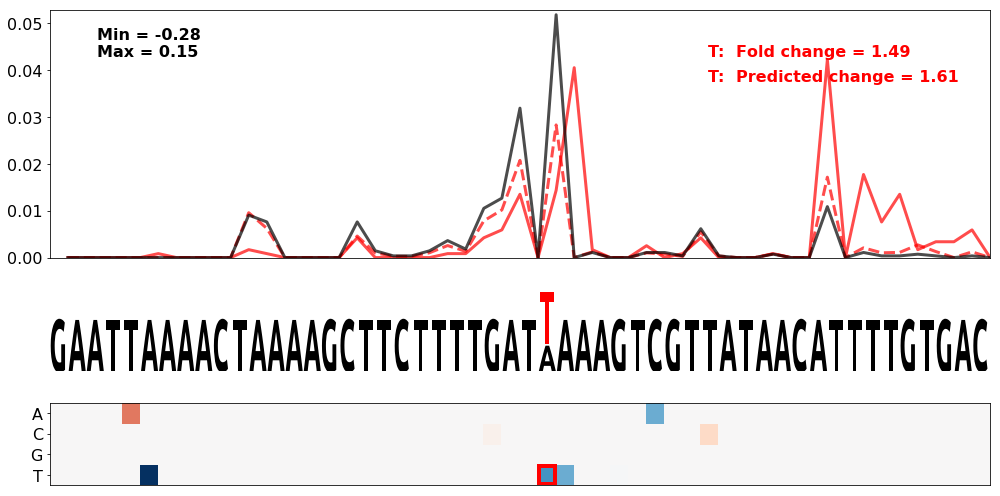

Gene = SMAD4.1
WT seq = AGCTTTAGGTCTAAAGACGATGGTGAATTATGTAGGTTTAAGTTGTTGGAATTAAAACTAAAAGCTTCTTTTGATAAAAGTCGTTATAACATTTTGTGACTCTATTAATAGAAGTGGCTTTTTCTTTGCTTTCCAGGTTTTTGGGCGAGTTTTAAAGAAGTATT
SNV pos = 76
SNV nt = T
ClinVar id = Missing


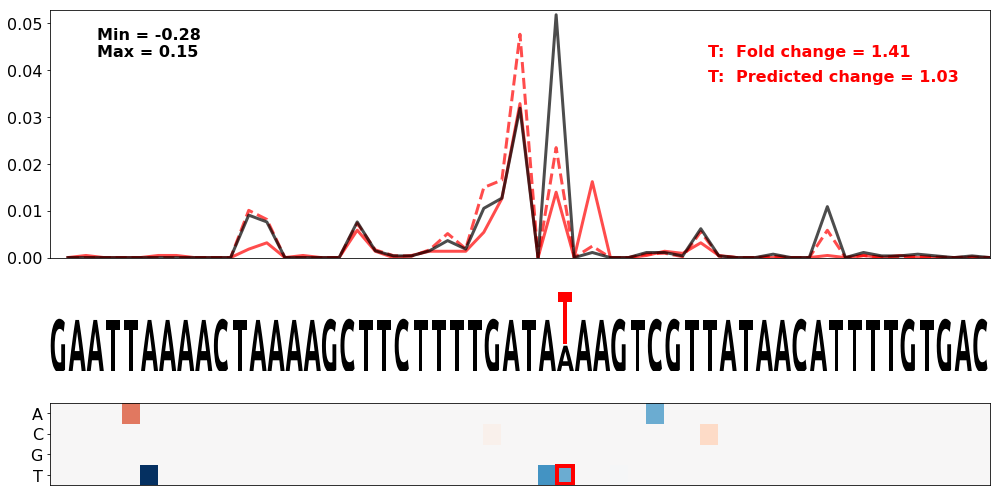

Gene = PTEN.15
WT seq = ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA
SNV pos = 89
SNV nt = C
ClinVar id = Missing


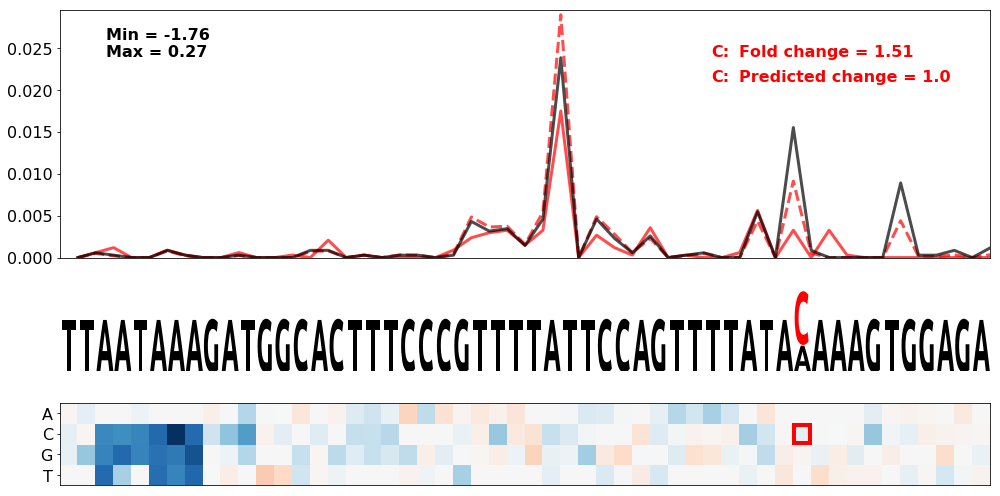

Gene = TMEM43.11
WT seq = AGTGAATTTGAGAATTAAATAATACTTGTAAAACACTTAGGACAGTATCAAATAAATGGTGAGTGATAAATGTGACCTGTTTTTGTTGTTACGGACTCTGAGAGAGGGCCCGATTCAGATCAGAGGGTCAGGGAAAGCCCTCTGAAGAAATGGGGTTCAAGCAA
SNV pos = 68
SNV nt = C
ClinVar id = Missing


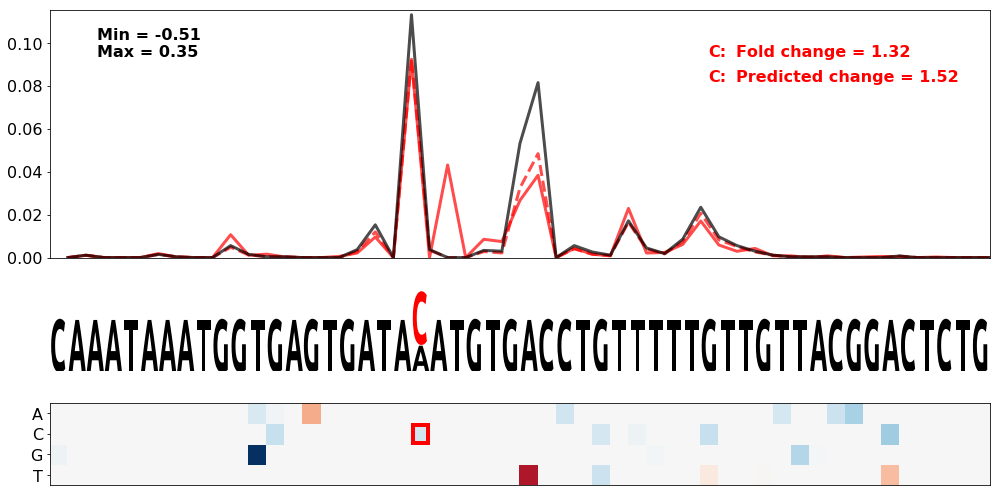

Gene = PTEN.15
WT seq = ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA
SNV pos = 88
SNV nt = G
ClinVar id = Missing


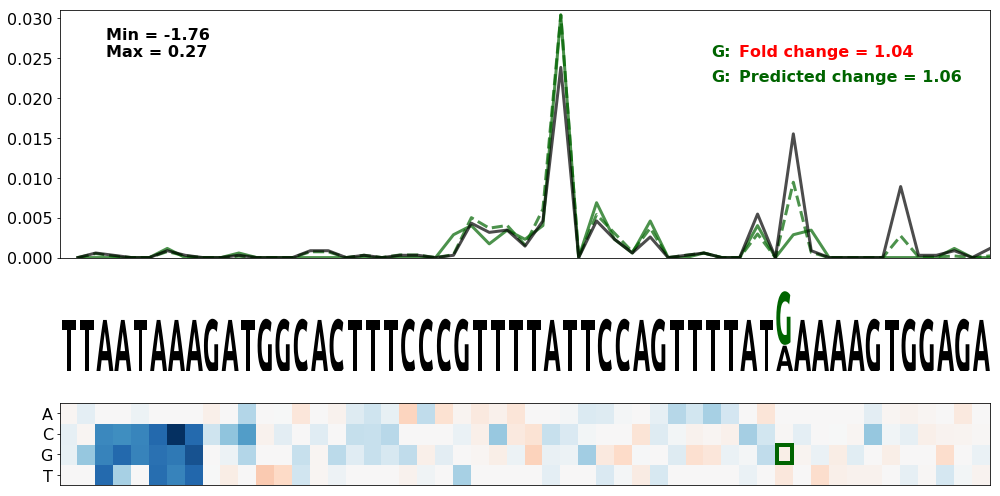

Gene = PTEN.15
WT seq = ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA
SNV pos = 88
SNV nt = T
ClinVar id = Missing


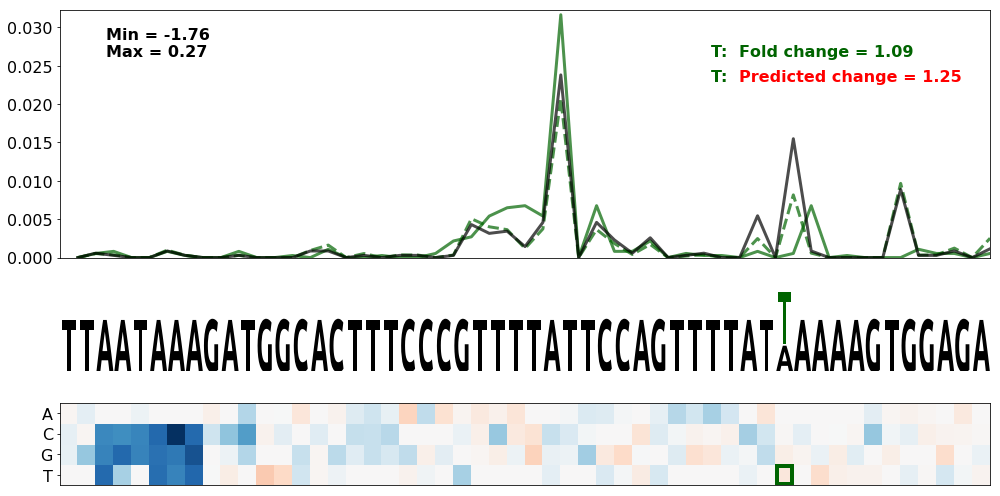

Gene = PTEN.15
WT seq = ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA
SNV pos = 87
SNV nt = A
ClinVar id = Missing


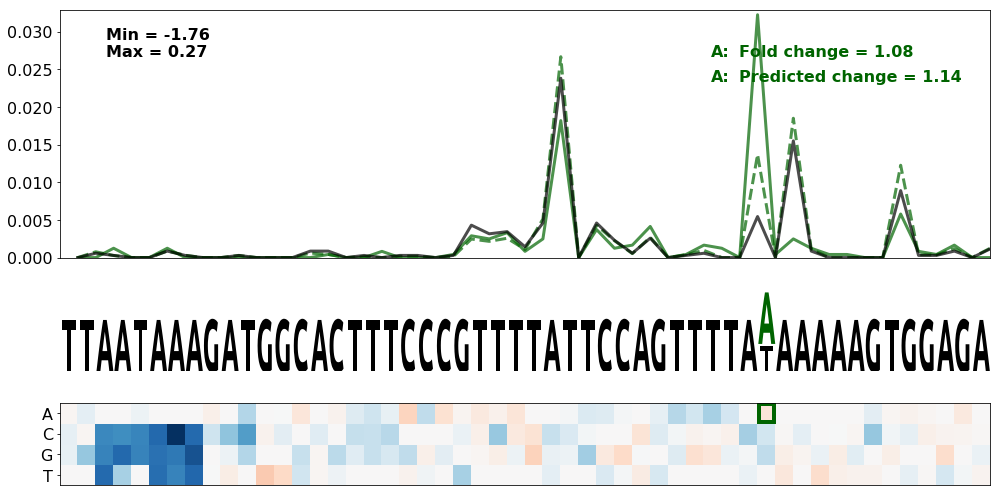

Gene = TPM1.20
WT seq = AACCCTCTGCTGAGTAACCAAGCCTTTAATTTTGTGTTTTTATGAAAGGAATTAAAATACCCACGATAAATATTTACCACAACCTGTGTCAAATAAATGGGAAATTAAACACAGATTGTACAATGTGAGCTTGGGAGTTAATGGCCCAGATTTTACTGTTAGGC
SNV pos = 66
SNV nt = A
ClinVar id = Missing


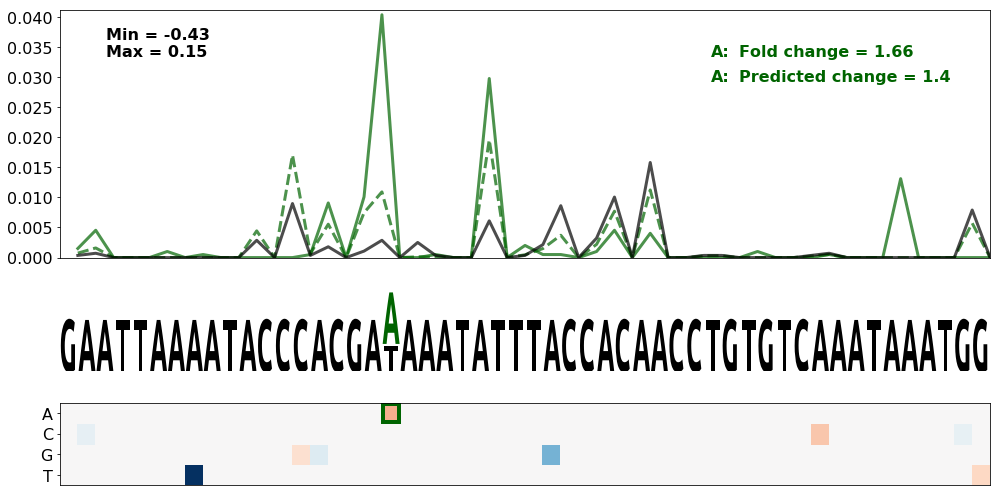

In [12]:
print('Gain of cryptic competing CSE:')

experiment_name = 'gain_of_cryptic_cse'

gene_names = [
    'PTEN.24',
    'DOCK8.2',
    'SMAD4.1',
    'ATP7B.1',
    'BRCA2.1',
    'TPMT.1',
    'BRCA1.1'
]

snv_list = [
    [(72, 'A', 'darkgreen')],
    [(75, 'A', 'darkgreen')],
    [(72, 'C', 'darkgreen')],
    [(74, 'T', 'red')],
    [(63, 'T', 'red')],
    [(75, 'T', 'red')],
    [(80, 'A', 'red')]
]

wt_seq_list = [
    'GAGTTAAGTAATTTCACTGAAATTGATTGCTTTTTGTGTCTTGGAGTCAAAATAAATAACTGAAATCTACTATACTTGGCTCATGCTTAATTAATATACTTAGACCATATTTCGGATGAATTATTCACAGAATCTAAAGGAGTATCCTCGTGTTCTTACCTTCT',
    'ATTTGAGAATTAAATTATATATTTTTAATATGACTGTGACCTTGACTGATAATAAAGATGTAATAAGAATTGCAAGCTAAATGTTTCCCTTTGCAACTCATGCTTTGTGTTTTGTTTTGATGACCTACTCGCTCGTAATGTTTTGTAAGGCACTTCAGAGAGAA',
    'AGCTTTAGGTCTAAAGACGATGGTGAATTATGTAGGTTTAAGTTGTTGGAATTAAAACTAAAAGCTTCTTTTGATAAAAGTCGTTATAACATTTTGTGACTCTATTAATAGAAGTGGCTTTTTCTTTGCTTTCCAGGTTTTTGGGCGAGTTTTAAAGAAGTATT',
    'TTTTTGTCAGATAATCATTTCTACTTCAAAAACATTTCATGCAATATTAGAATAAAGTTCCTGTCATTCCTCTAAAAATCTGCCTGTGAGTGAGATGCGTGGTCAGAGGCCAGTGCCGTCTTGTCTTCACGAGGGCTTCTGTGAGGCACTGGCTTGGCTTCATG',
    'TGTATAATATCATGTTTTCAAATCTAATTATAAATACGTTTAAAGCCAAGAATAAATCTTTTAAAAAATTGACTTGTTTCCTTCCATAACTCTGAGCCATGATTTTTCTGTTCTGTAAAAAGCATTAACAAAATTGTCTATTTTGCTACTCCCTGTAACTTAAG',
    'CCTAAAATCTCAAGATGGAAGATATACCACATGTAAATTATTTTAGAGCAATTAAATTGTTTTCAGGATTTTCCAAAAATGCTTCTTGTTTCATTTTATTATTTAAGTAACAGATTATCTGAGCCTCTGTGCCCTGCACACAGTGGTTTATAAATGCCTTGCCC',
    'ACTTGATTGTACAAAATACGTTTTGTAAATGTTGTGCTGTTAACACTGCAAATAAACTTGGTAGCAAACACTTCCACCATGAATGACTGTTCTTGAGACTTAGGCCAGCCGACTTTCTCAGAGCCTTTTCACTGTGCTTCAGTCTCCCACTCTGTAAAATGGGG'
]

plot_variant_selection(human_variant_df, gene_names, snv_list, wt_seq_list, experiment_name, fold_change_from_cut_range=[60, 90], seq_start=48, seq_end=100, save_figs=False)

print('Loss of cryptic competing CSE:')

experiment_name = 'loss_of_cryptic_cse'

gene_names = [
    'SMAD4.1',
    'SMAD4.1',
    'PTEN.15',
    'TMEM43.11',
    'PTEN.15',
    'PTEN.15',
    'PTEN.15',
    'TPM1.20'
]

snv_list = [
    [(75, 'T', 'red')],
    [(76, 'T', 'red')],
    [(89, 'C', 'red')],
    [(68, 'C', 'red')],
    [(88, 'G', 'darkgreen')],
    [(88, 'T', 'darkgreen')],
    [(87, 'A', 'darkgreen')],
    [(66, 'A', 'darkgreen')]
]

wt_seq_list = [
    'AGCTTTAGGTCTAAAGACGATGGTGAATTATGTAGGTTTAAGTTGTTGGAATTAAAACTAAAAGCTTCTTTTGATAAAAGTCGTTATAACATTTTGTGACTCTATTAATAGAAGTGGCTTTTTCTTTGCTTTCCAGGTTTTTGGGCGAGTTTTAAAGAAGTATT',
    'AGCTTTAGGTCTAAAGACGATGGTGAATTATGTAGGTTTAAGTTGTTGGAATTAAAACTAAAAGCTTCTTTTGATAAAAGTCGTTATAACATTTTGTGACTCTATTAATAGAAGTGGCTTTTTCTTTGCTTTCCAGGTTTTTGGGCGAGTTTTAAAGAAGTATT',
    'ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA',
    'AGTGAATTTGAGAATTAAATAATACTTGTAAAACACTTAGGACAGTATCAAATAAATGGTGAGTGATAAATGTGACCTGTTTTTGTTGTTACGGACTCTGAGAGAGGGCCCGATTCAGATCAGAGGGTCAGGGAAAGCCCTCTGAAGAAATGGGGTTCAAGCAA',
    'ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA',
    'ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA',
    'ATGTATATACCTTTTTGTGTCAAAAGGACATTTAAAATTCAATTAGGATTAATAAAGATGGCACTTTCCCGTTTTATTCCAGTTTTATAAAAAGTGGAGACAGACTGATGTGTATACGTAGGAATTTTTTCCTTTTGTGTTCTGTCACCAACTGAAGTGGCTAA',
    'AACCCTCTGCTGAGTAACCAAGCCTTTAATTTTGTGTTTTTATGAAAGGAATTAAAATACCCACGATAAATATTTACCACAACCTGTGTCAAATAAATGGGAAATTAAACACAGATTGTACAATGTGAGCTTGGGAGTTAATGGCCCAGATTTTACTGTTAGGC'
]

plot_variant_selection(human_variant_df, gene_names, snv_list, wt_seq_list, experiment_name, fold_change_from_cut_range=[60, 90], seq_start=48, seq_end=100, save_figs=False)


<h2>Gain/Loss of CFIm25 Binding site (TGTA)</h2>

Gain of Motif (Neural Net model)


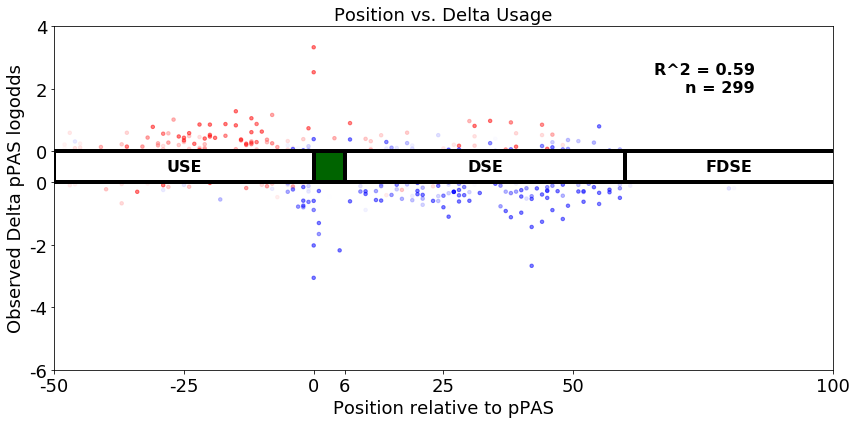

Gain of Motif (Hexamer model)


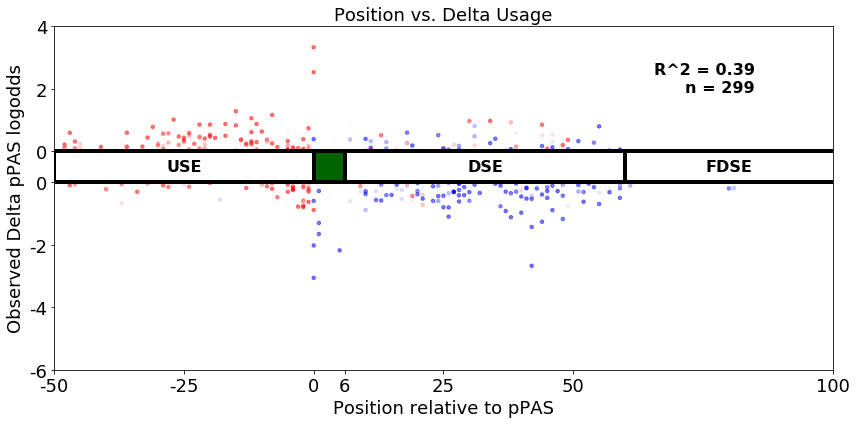


# Gain of ['TGTA'] = 299
# Neural net / Observation agreement = 233
# Neural net / 6-mer model agreement = 243
## Gain of motif in USE = 122
### Gain of motif, Loss of function = 39
### Gain of motif, Gain of function = 83
### Neural net / 6-mer model agreement = 95
## Gain of motif in DSE = 164
### Gain of motif, Loss of function = 109
### Gain of motif, Gain of function = 55
### Neural net / 6-mer model agreement = 138
Loss of Motif (Neural Net model)


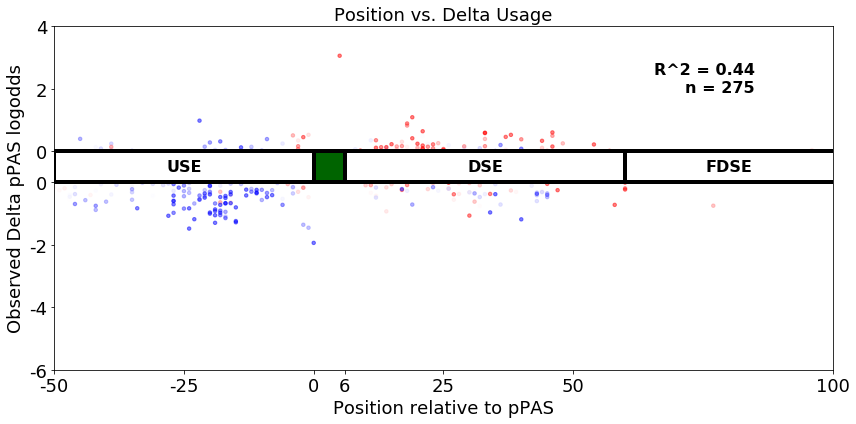

Loss of Motif (Hexamer model)


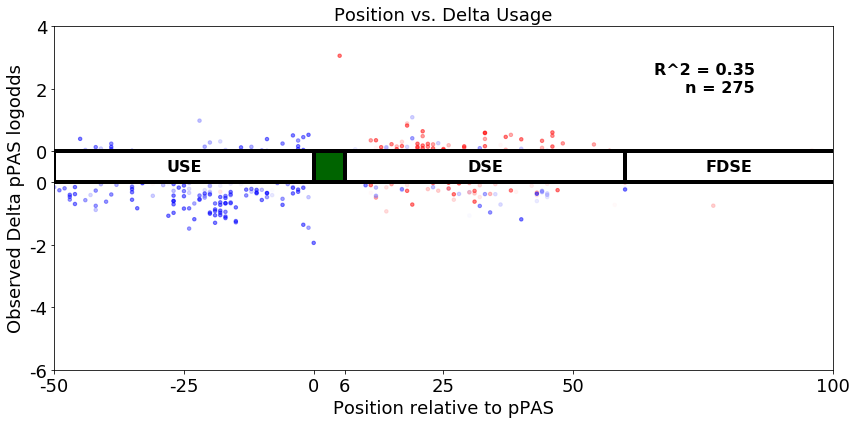


# Loss of ['TGTA'] = 275
# Neural net / Observation agreement = 199
# Neural net / 6-mer model agreement = 220
## Loss of motif in USE = 151
### Loss of motif, Loss of function = 123
### Loss of motif, Gain of function = 28
### Neural net / 6-mer model agreement = 132
## Loss of motif in DSE = 122
### Loss of motif, Loss of function = 61
### Loss of motif, Gain of function = 61
### Neural net / 6-mer model agreement = 86


In [8]:
#Gain/Loss of TGTA
motifs = ['TGTA']
gain_of_motif_df, loss_of_motif_df = plot_gain_loss_of_motifs(var_df, motifs, name_prefix='tgta', plot_logos=False, save_figs=False)


Gain of overlapping CSE:
Gene = INS.1
WT seq = CAGCCCGCAGGCAGCCCCACACCCGCCGCCTCCTGCACCGAGAGAGATGGAATAAAGCCCTTGAACCAGCCCTGCTGTGCCGTCTGTGTGTCTTGGGGGCCCTGGGCCAAGCCCCACTTCCCGGCACTGTTGTGAGCCCCTCCCAGCTCTCTCCACGCTCTCTG
SNV pos = 49
SNV nt = T
ClinVar id = Missing


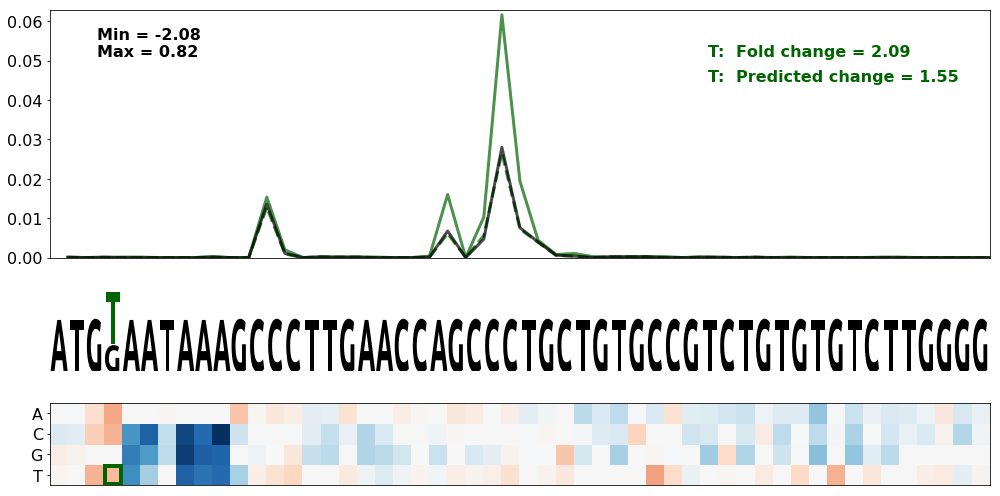

Gene = SNRNP200.3
WT seq = TATAGCATTTTCAGGCATGTTCCTGGTAGTTCTTTTGAGTCTGACATTCTAATAAAATAATTTGTAGAAACCATTTGTCTTTGTAGTGATTCCAAATTAAAAGTTTTCTTTCTCCAACCTGAGGGCACGGCCAAAAAGATCTGGTTATTTTTTAGCCAGGAACG
SNV pos = 48
SNV nt = G
ClinVar id = NM_014014.4(SNRNP200):c.*257C>G


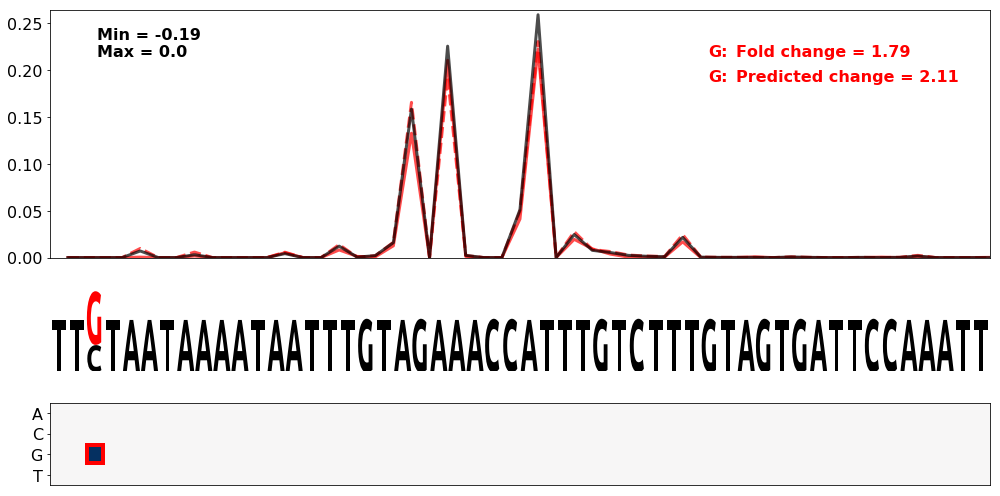

In [16]:
print('Gain of overlapping TGTA/CSE:')

experiment_name = 'gain_of_overlapping_tgta'

gene_names = [
    'INS.1',
    'SNRNP200.3'
]

snv_list = [
    [(49, 'T', 'darkgreen')],
    [(48, 'G', 'red')],
]

wt_seq_list = [
    'CAGCCCGCAGGCAGCCCCACACCCGCCGCCTCCTGCACCGAGAGAGATGGAATAAAGCCCTTGAACCAGCCCTGCTGTGCCGTCTGTGTGTCTTGGGGGCCCTGGGCCAAGCCCCACTTCCCGGCACTGTTGTGAGCCCCTCCCAGCTCTCTCCACGCTCTCTG',
    'TATAGCATTTTCAGGCATGTTCCTGGTAGTTCTTTTGAGTCTGACATTCTAATAAAATAATTTGTAGAAACCATTTGTCTTTGTAGTGATTCCAAATTAAAAGTTTTCTTTCTCCAACCTGAGGGCACGGCCAAAAAGATCTGGTTATTTTTTAGCCAGGAACG'
]

plot_variant_selection(human_variant_df, gene_names, snv_list, wt_seq_list, experiment_name, seq_start=46, seq_end=98, save_figs=False)


In [10]:
#Load position nmer weights and build decoder dicts

simple_pos_weights = np.load('apa_4mer_pos_weights/simple_position_nmer_weights.npy')

mer4_dict, mer4_list = {}, []
bases = list('ACGT')

#Build dictionary of 4-mer -> index
i4 = 0
for b1 in bases :
    for b2 in bases :
        for b3 in bases :
            for b4 in bases :
                mer4_dict[b1 + b2 + b3 + b4] = i4
                mer4_list.append(b1 + b2 + b3 + b4)
                i4 += 1


Wildtype Isoform Abundance vs. Variant Effect


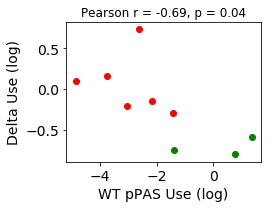

Wildtype Isoform Abundance vs. Variant Effect (4mer scores subtracted from effect size)


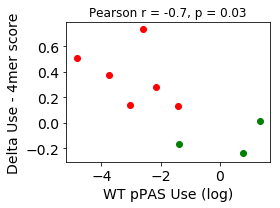

In [13]:
#Compare delta log fold change against wildtype isoform abundance
save_figs = False

tgta_boundary_df = gain_of_motif_df.query("snv_pos >= 47 and snv_pos <= 49")

slice_index = tgta_boundary_df.index.str.slice(47, 50).str.contains('TGT')
slice_index = slice_index & (~tgta_boundary_df.wt_seq.str.slice(0, 45).str.contains('AATAAA'))
slice_index = slice_index & (~tgta_boundary_df.wt_seq.str.slice(0, 45).str.contains('ATTAAA'))
slice_index = slice_index & (~tgta_boundary_df.wt_seq.str.slice(0, 45).str.contains('TATAAA'))
slice_index = slice_index & (~tgta_boundary_df.wt_seq.str.slice(0, 45).str.contains('CATAAA'))
slice_index = slice_index & (~tgta_boundary_df.wt_seq.str.slice(0, 45).str.contains('GATAAA'))
slice_index = slice_index & (~tgta_boundary_df.wt_seq.str.slice(0, 45).str.contains('AGTAAA'))
tgta_boundary_df = tgta_boundary_df[slice_index]

has_up_tgta = tgta_boundary_df.wt_seq.str.slice(0, 45).str.contains('TGTA') | tgta_boundary_df.wt_seq.str.slice(57, 110).str.contains('TGTA')
not_up_tgta = ~(tgta_boundary_df.wt_seq.str.slice(0, 45).str.contains('TGTA') | tgta_boundary_df.wt_seq.str.slice(57, 110).str.contains('TGTA'))

r_val, p_val = pearsonr(tgta_boundary_df['pooled_proximal_logodds_ref'], tgta_boundary_df['delta_logodds_true'])

print("Wildtype Isoform Abundance vs. Variant Effect")

f = plt.figure(figsize=(4, 3))

plt.scatter(tgta_boundary_df['pooled_proximal_logodds_ref'].loc[has_up_tgta], tgta_boundary_df['delta_logodds_true'].loc[has_up_tgta], c='green')
plt.scatter(tgta_boundary_df['pooled_proximal_logodds_ref'].loc[not_up_tgta], tgta_boundary_df['delta_logodds_true'].loc[not_up_tgta], c='red')

plt.xlabel('WT pPAS Use (log)', fontsize=14)
plt.ylabel('Delta Use (log)', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('Pearson r = ' + str(round(r_val, 2)) + ', p = ' + str(round(p_val, 2)))

plt.tight_layout()

if save_figs :
    fig_name = 'gain_of_overlapping_tgta_scatter'
    plt.savefig(fig_name + '.png', transparent=True, dpi=150)
    plt.savefig(fig_name + '.eps')

plt.show()

#Subtract 4mer delta score from measured variant delta fold change
linear_boundary_delta = np.zeros(len(tgta_boundary_df))

i = 0
for index, row in tgta_boundary_df.iterrows() :
    
    var_score = 0
    ref_score = 0
    for offset in range(-3, 3 + 1) :
        var_mer = index[46 + offset: 50 + offset]
        ref_mer = row['wt_seq'][46 + offset: 50 + offset]
        
        rel_pos = 46 + offset
        
        var_score += simple_pos_weights[rel_pos * 256 + mer4_dict[var_mer]]
        ref_score += simple_pos_weights[rel_pos * 256 + mer4_dict[ref_mer]]
    
    linear_boundary_delta[i] = var_score - ref_score
    
    i += 1

r_val, p_val = pearsonr(tgta_boundary_df['pooled_proximal_logodds_ref'], tgta_boundary_df['delta_logodds_true'] - linear_boundary_delta)

print("Wildtype Isoform Abundance vs. Variant Effect (4mer scores subtracted from effect size)")

f = plt.figure(figsize=(4, 3))

plt.scatter(tgta_boundary_df['pooled_proximal_logodds_ref'].loc[has_up_tgta], tgta_boundary_df['delta_logodds_true'].loc[has_up_tgta] - linear_boundary_delta[has_up_tgta], c='green')
plt.scatter(tgta_boundary_df['pooled_proximal_logodds_ref'].loc[not_up_tgta], tgta_boundary_df['delta_logodds_true'].loc[not_up_tgta] - linear_boundary_delta[not_up_tgta], c='red')

plt.xlabel('WT pPAS Use (log)', fontsize=14)
plt.ylabel('Delta Use - 4mer score', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('Pearson r = ' + str(round(r_val, 2)) + ', p = ' + str(round(p_val, 2)))

plt.tight_layout()

if save_figs :
    fig_name = 'gain_of_overlapping_tgta_scatter_multi_4mer_correction'
    plt.savefig(fig_name + '.png', transparent=True, dpi=150)
    plt.savefig(fig_name + '.eps')

plt.show()





<h2>Gain/Loss of CstF Binding site (TGTCT/TGTGT)</h2>

Gain of Motif (Neural Net model)


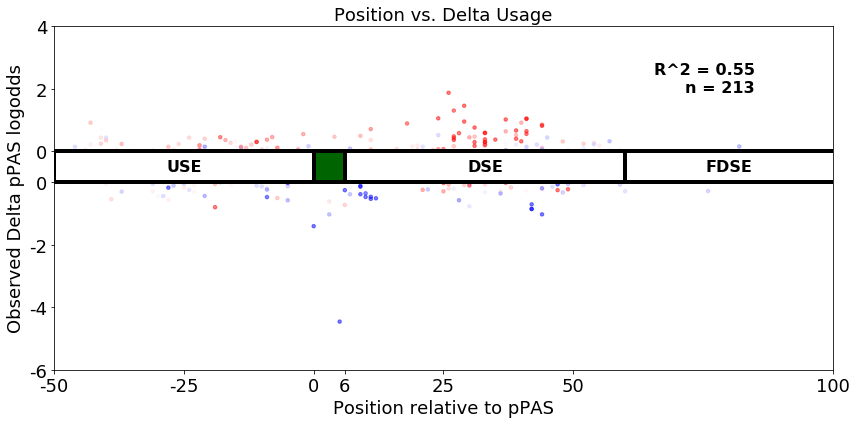

Gain of Motif (Hexamer model)


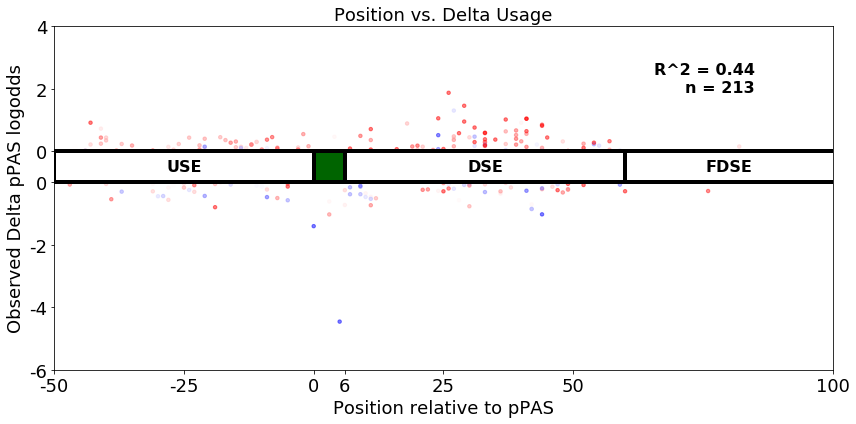


# Gain of ['TGTCT', 'TGTGT'] = 213
# Neural net / Observation agreement = 151
# Neural net / 6-mer model agreement = 150
## Gain of motif in USE = 83
### Gain of motif, Loss of function = 34
### Gain of motif, Gain of function = 49
### Neural net / 6-mer model agreement = 60
## Gain of motif in DSE = 125
### Gain of motif, Loss of function = 50
### Gain of motif, Gain of function = 75
### Neural net / 6-mer model agreement = 88
Loss of Motif (Neural Net model)


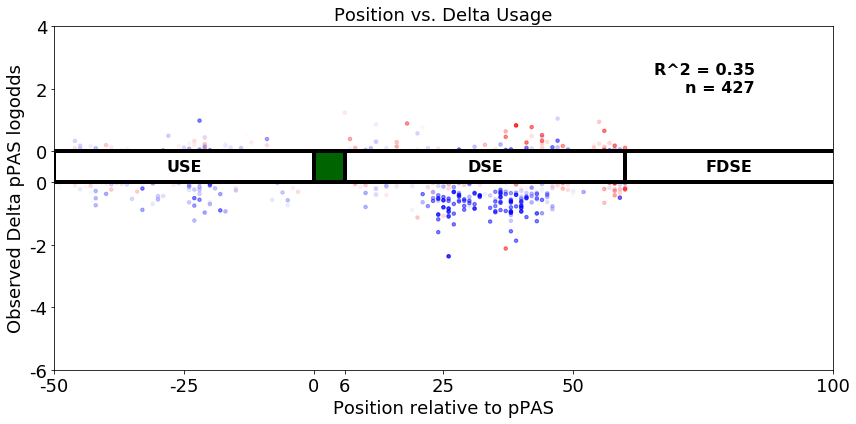

Loss of Motif (Hexamer model)


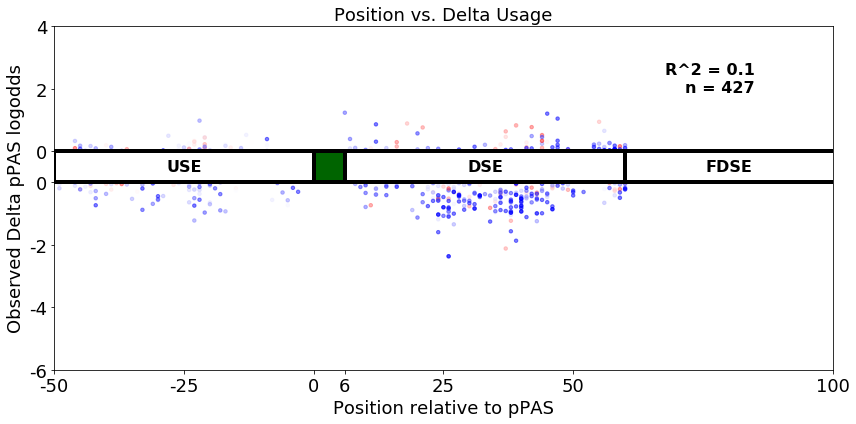


# Loss of ['TGTCT', 'TGTGT'] = 427
# Neural net / Observation agreement = 303
# Neural net / 6-mer model agreement = 332
## Loss of motif in USE = 115
### Loss of motif, Loss of function = 70
### Loss of motif, Gain of function = 45
### Neural net / 6-mer model agreement = 97
## Loss of motif in DSE = 312
### Loss of motif, Loss of function = 229
### Loss of motif, Gain of function = 83
### Neural net / 6-mer model agreement = 235


In [17]:
#Gain/Loss of CSTF site (CSE Hexamer)
motifs = ['TGTCT', 'TGTGT']
plot_gain_loss_of_motifs(var_df, motifs, name_prefix='tgtct', plot_logos=False, save_figs=False)


Gain of TGT[C/G]T:
Gene = PRKAG2.1
WT seq = CTATCGATTAAAATTCTACATGCAGTTTTCCACTTAGCTATTTCTCCCCAAATAAAGAAGTACATGAATTTCATCTCTTTTCCGGTATCAGGAAAAAAAGTCAGGGTTTAATTCATAAACTCTCTCTCTCCACTATTAAGTATGAATATATGTATTTATTATTT
SNV pos = 74
SNV nt = G
ClinVar id = Missing


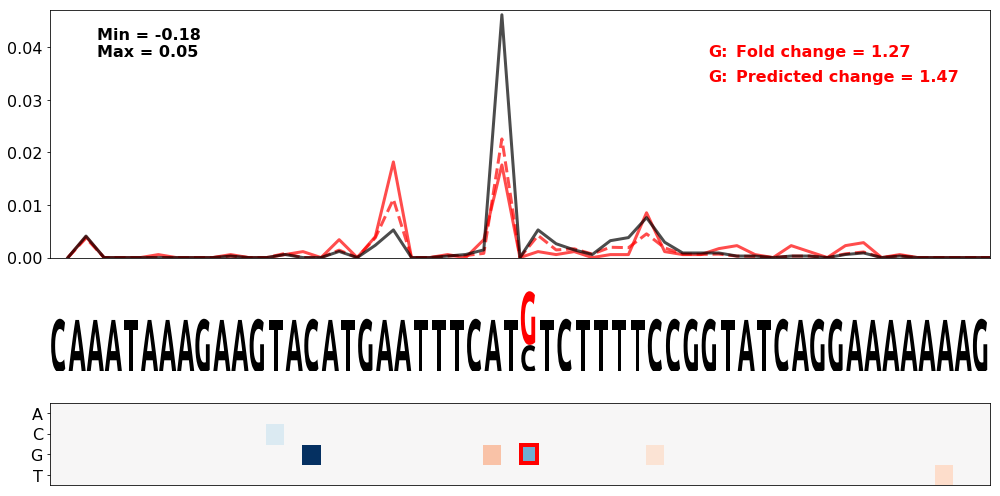

Gene = RYR2.5
WT seq = AGAAACAAGTTGATCAACGTGAGAGAAATTTCATGATAATTATTCATAGTAATAAAGTGTCGTGGGCTTAATTGTATATCTGGAGCCAGTGTCATCCACCAACAATGTGATACAATATGAACTTGACAGTAGTTTTGGGTTTTGCTCATTCTTTCAGCCACCTG
SNV pos = 75
SNV nt = G
ClinVar id = Missing


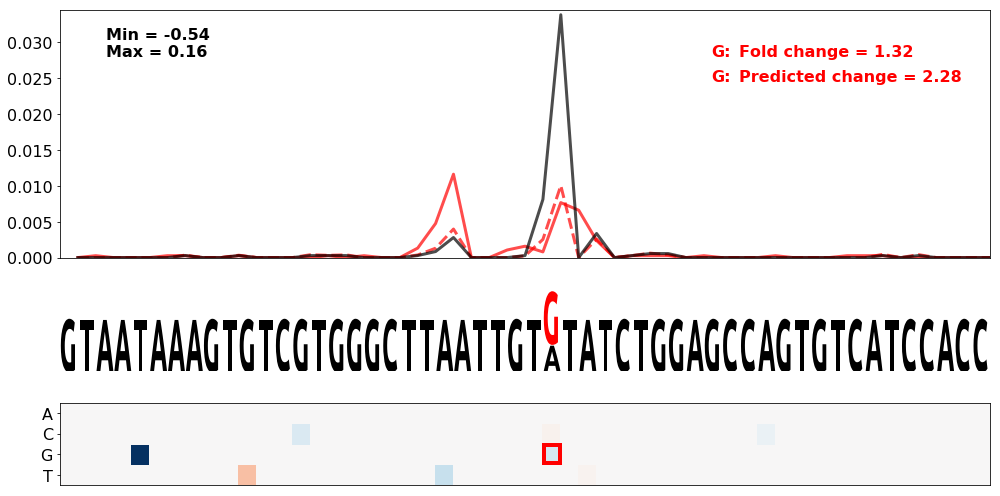

Gene = TP53.3
WT seq = CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG
SNV pos = 73
SNV nt = C
ClinVar id = Missing


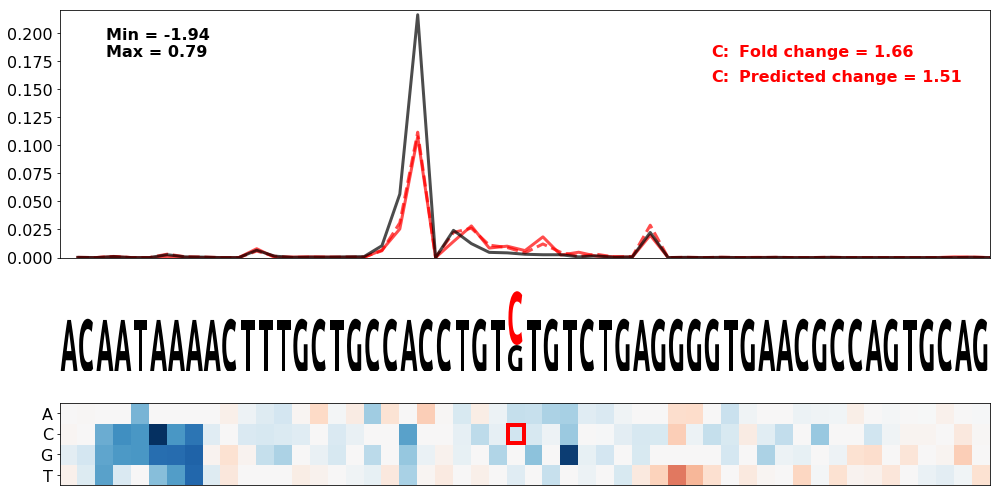

Loss of TGT[C/G]T:
Gene = PTEN.13
WT seq = GCTATCAACAAAGAATGGGCTTGAAACATTATAAAAATTGACAATGATTTATTAAATATGTTTTCTCAATTGTAACGACTTCTCCATCTCCTGTGTAATCAAGGCCAGTGCTAAAATTCAGATGCTGTTAGTACCTACATCAGTCAACAACTTACACTTATTTT
SNV pos = 92
SNV nt = T
ClinVar id = Missing


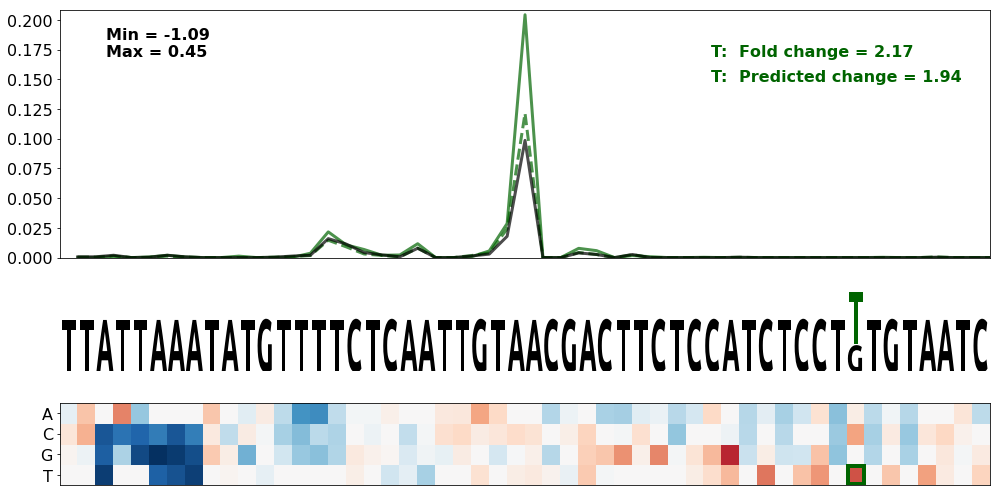

Gene = PTEN.8
WT seq = AGATGTCCATTTGTTATTGTGTTTGTTAACAACCCTTTATCTCTTAGTGTTATAAACTCCACTTAAAACTGATTAAAGTCTCATTCTTGTCATTGTGTGGGTGTTTTATTAAATGAGAGTTTATAATTCAAATTGCTTAAGTCCATTGAAGTTTTAATTAATGG
SNV pos = 95
SNV nt = G
ClinVar id = Missing


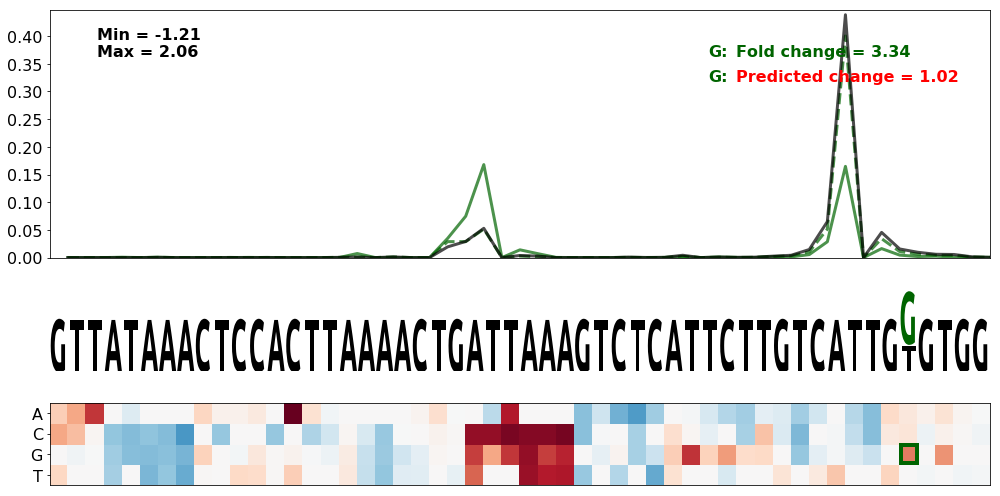

Gene = INS.1
WT seq = CAGCCCGCAGGCAGCCCCACACCCGCCGCCTCCTGCACCGAGAGAGATGGAATAAAGCCCTTGAACCAGCCCTGCTGTGCCGTCTGTGTGTCTTGGGGGCCCTGGGCCAAGCCCCACTTCCCGGCACTGTTGTGAGCCCCTCCCAGCTCTCTCCACGCTCTCTG
SNV pos = 89
SNV nt = T
ClinVar id = Missing


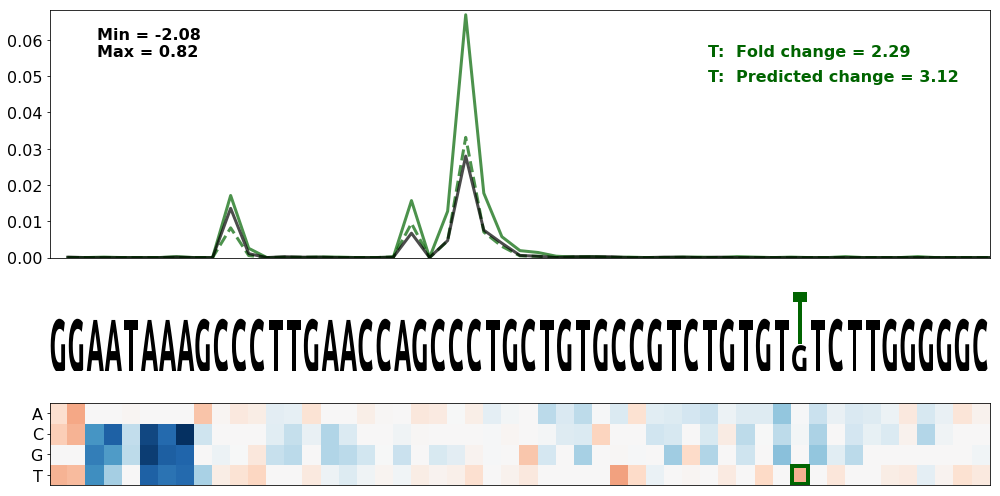

In [24]:
print('Gain of TGT[C/G]T:')

experiment_name = 'gain_of_tgtct'

gene_names = [
    'PRKAG2.1',
    'RYR2.5',
    'TP53.3'
]

snv_list = [
    [(74, 'G', 'red')],
    [(75, 'G', 'red')],
    [(73, 'C', 'red')]
]

wt_seq_list = [
    'CTATCGATTAAAATTCTACATGCAGTTTTCCACTTAGCTATTTCTCCCCAAATAAAGAAGTACATGAATTTCATCTCTTTTCCGGTATCAGGAAAAAAAGTCAGGGTTTAATTCATAAACTCTCTCTCTCCACTATTAAGTATGAATATATGTATTTATTATTT',
    'AGAAACAAGTTGATCAACGTGAGAGAAATTTCATGATAATTATTCATAGTAATAAAGTGTCGTGGGCTTAATTGTATATCTGGAGCCAGTGTCATCCACCAACAATGTGATACAATATGAACTTGACAGTAGTTTTGGGTTTTGCTCATTCTTTCAGCCACCTG',
    'CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG'
]

plot_variant_selection(human_variant_df, gene_names, snv_list, wt_seq_list, experiment_name, fold_change_from_cut_range=[60, 90], seq_start=48, seq_end=100, save_figs=False)

print('Loss of TGT[C/G]T:')

experiment_name = 'loss_of_tgtct'

gene_names = [
    'PTEN.13',
    'PTEN.8',
    'INS.1'
]

snv_list = [
    [(92, 'T', 'darkgreen')],
    [(95, 'G', 'darkgreen')],
    [(89, 'T', 'darkgreen')]
]

wt_seq_list = [
    'GCTATCAACAAAGAATGGGCTTGAAACATTATAAAAATTGACAATGATTTATTAAATATGTTTTCTCAATTGTAACGACTTCTCCATCTCCTGTGTAATCAAGGCCAGTGCTAAAATTCAGATGCTGTTAGTACCTACATCAGTCAACAACTTACACTTATTTT',
    'AGATGTCCATTTGTTATTGTGTTTGTTAACAACCCTTTATCTCTTAGTGTTATAAACTCCACTTAAAACTGATTAAAGTCTCATTCTTGTCATTGTGTGGGTGTTTTATTAAATGAGAGTTTATAATTCAAATTGCTTAAGTCCATTGAAGTTTTAATTAATGG',
    'CAGCCCGCAGGCAGCCCCACACCCGCCGCCTCCTGCACCGAGAGAGATGGAATAAAGCCCTTGAACCAGCCCTGCTGTGCCGTCTGTGTGTCTTGGGGGCCCTGGGCCAAGCCCCACTTCCCGGCACTGTTGTGAGCCCCTCCCAGCTCTCTCCACGCTCTCTG'
]

plot_variant_selection(human_variant_df, gene_names, snv_list, wt_seq_list, experiment_name, seq_start=48, seq_end=100, save_figs=False)


<h2>DSE Secondary Structure Variants</h2>

In [8]:
#Calculate mean cut position in variant and wildtype DSEs
var_df['avg_pos_true_ref'] = var_df['cut_prob_true_ref'].apply(lambda p: np.sum(np.arange(len(p[57:110])) * (p[57:110] / np.sum(p[57:110]))))
var_df['avg_pos_true_var'] = var_df['cut_prob_true_var'].apply(lambda p: np.sum(np.arange(len(p[57:110])) * (p[57:110] / np.sum(p[57:110]))))

pas_dict = {'AATAAA' : True, 'ATTAAA' : True, 'TATAAA' : True, 'GATAAA' : True, 'CATAAA' : True, 'AGTAAA' : True, 'ACTAAA' : True, 'AAGAAA' : True, 'AGGAAA' : True, 'AACAAA' : True, 'AATAAT' : True}

#Filter out variants creating de novo CSE hexamers in the DSE
#Reason: The shift in cut position is not due to 2ary structure but new CSEs
keep_index = []
i = 0
for _, row in var_df.iterrows() :
    snv_pos = row['snv_pos']

    var_region = row['master_seq'][57:105]
    ref_region = row['wt_seq'][57:105]

    pas_found = False
    for pas in pas_dict :
        if pas in var_region or pas in ref_region :
            pas_found = True
            break

    if not pas_found :
        keep_index.append(i)

    i += 1

var_df_no_pas = var_df.iloc[keep_index].copy()
var_df_no_pas['delta_pos_true'] = var_df_no_pas['avg_pos_true_var'] - var_df_no_pas['avg_pos_true_ref']


In [9]:
#Store/load folded wildtype/variant sequences
#var_df_no_pas[['master_seq', 'wt_seq']].to_csv('folding/array_cut_var_seqs.csv', sep=',')
var_df_no_pas_fold = pd.read_csv('folding/array_cut_var_seqs_folded.csv', sep=',')
var_df_no_pas = var_df_no_pas.join(var_df_no_pas_fold.set_index('master_seq'), on='master_seq', rsuffix='folded')

In [10]:
#Filter variants on large delta MFEs calculated from ViennaRNA fold
keep_index = []

i = 0
for _, row in var_df_no_pas.iterrows() :
    mfe_var = row['mfe_var']
    mfe_ref = row['mfe_wt']
    delta_mfe = row['delta_mfe']
    
    if delta_mfe < -2 and mfe_var < -4.0 :
        keep_index.append(i)
    
    i += 1

var_df_foldchange = var_df_no_pas.iloc[keep_index]


Folding alteration variants:
Gene = MLH1.2
SNV pos = 69
SNV nt = A
ClinVar id = Missing


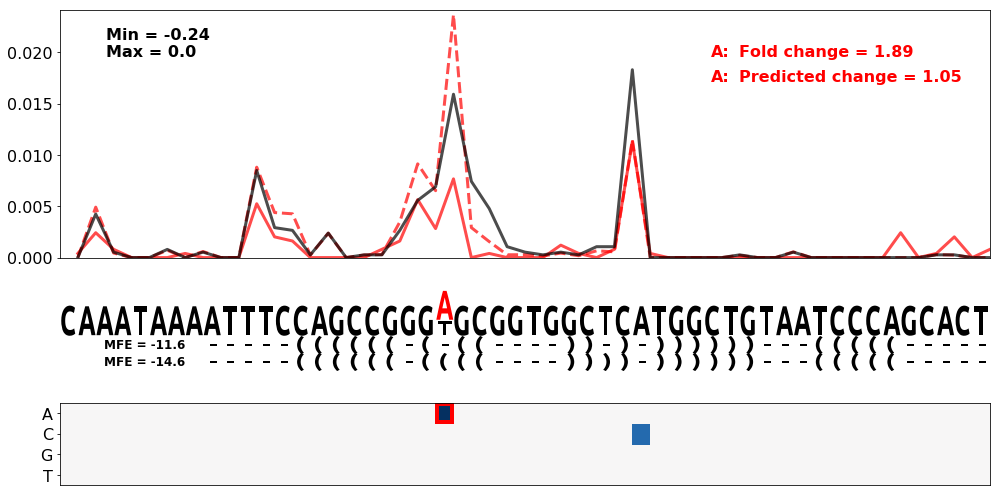

Gene = ARSA.3
SNV pos = 83
SNV nt = G
ClinVar id = Missing


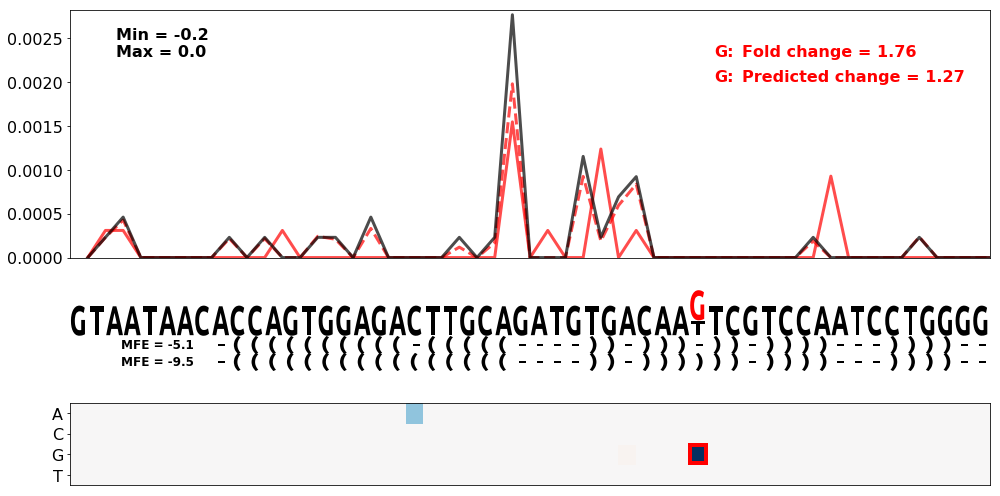

Gene = TP53.3
WT seq = CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG
SNV pos = 76
SNV nt = G
ClinVar id = Missing


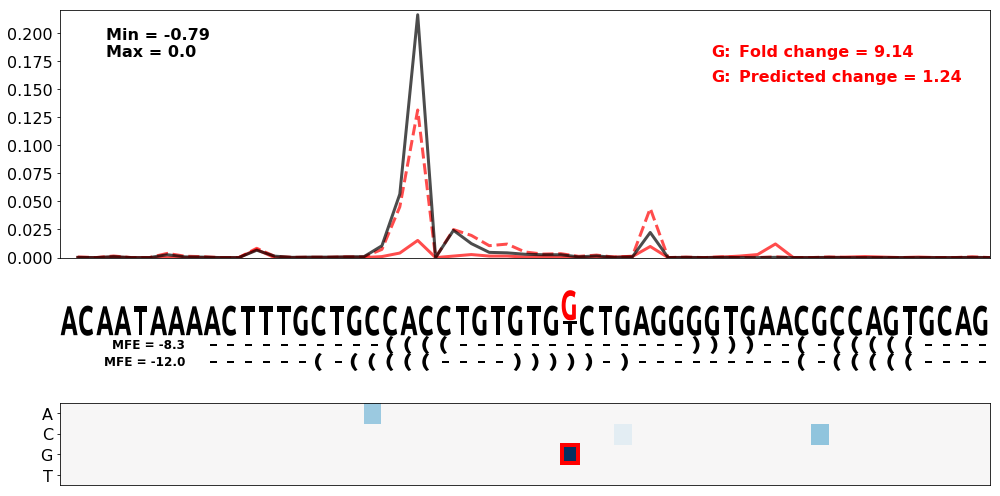

Gene = PTEN.16
SNV pos = 107
SNV nt = G
ClinVar id = Missing


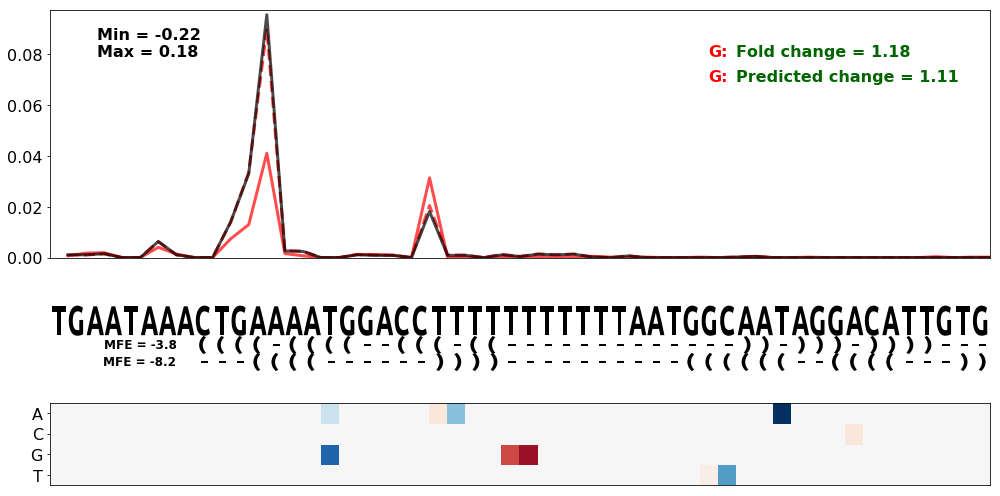

Gene = NF2.3
SNV pos = 97
SNV nt = G
ClinVar id = Missing


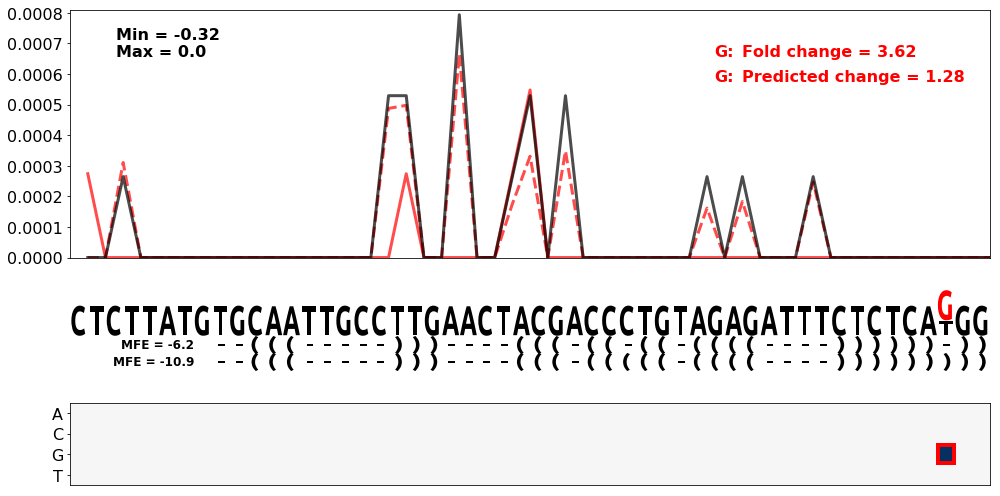

Gene = LDLR.4
SNV pos = 66
SNV nt = G
ClinVar id = Missing


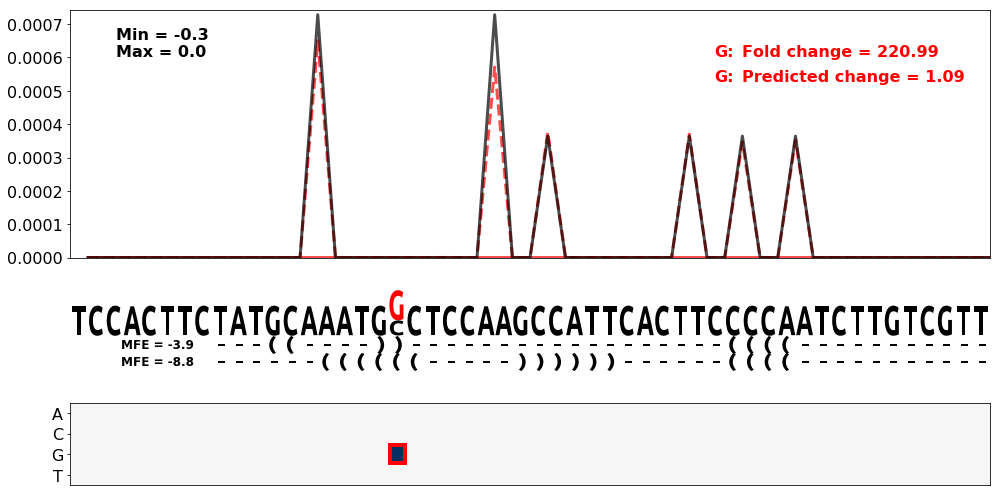

Gene = PEX5.3
SNV pos = 74
SNV nt = C
ClinVar id = NM_001131025.1(PEX5):c.*1259G>C


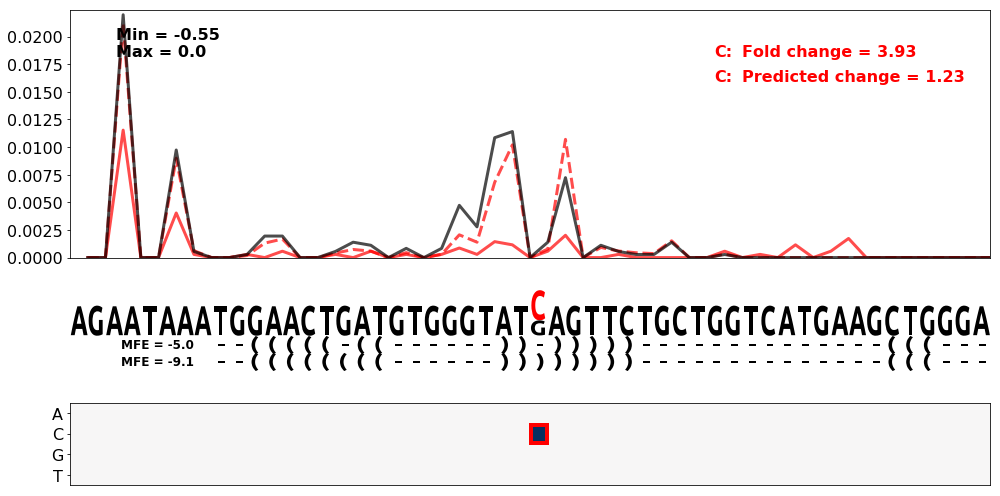

Gene = BRCA1.1
SNV pos = 72
SNV nt = A
ClinVar id = Missing


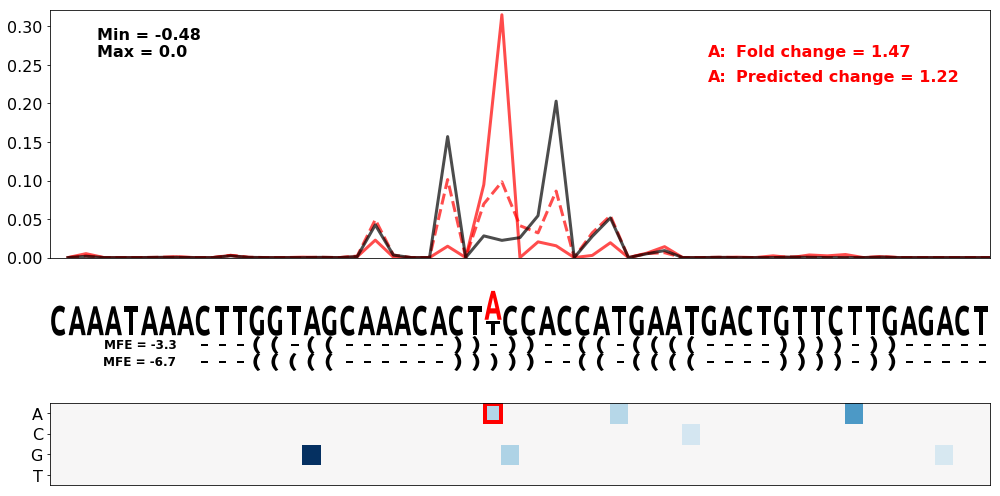

Gene = TP53.3
WT seq = CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG
SNV pos = 65
SNV nt = A
ClinVar id = Missing


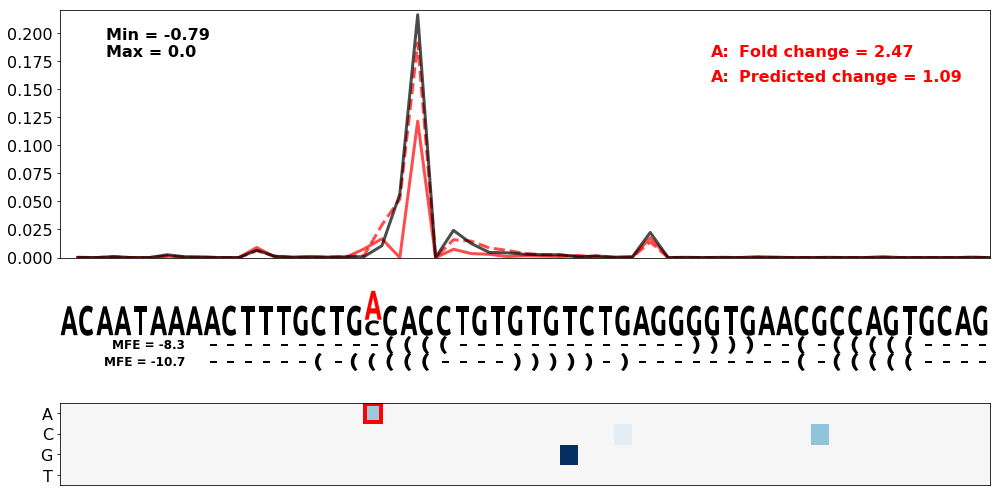

Gene = FRA10AC1.1
SNV pos = 68
SNV nt = G
ClinVar id = NM_006204.3(PDE6C):c.*209T>C


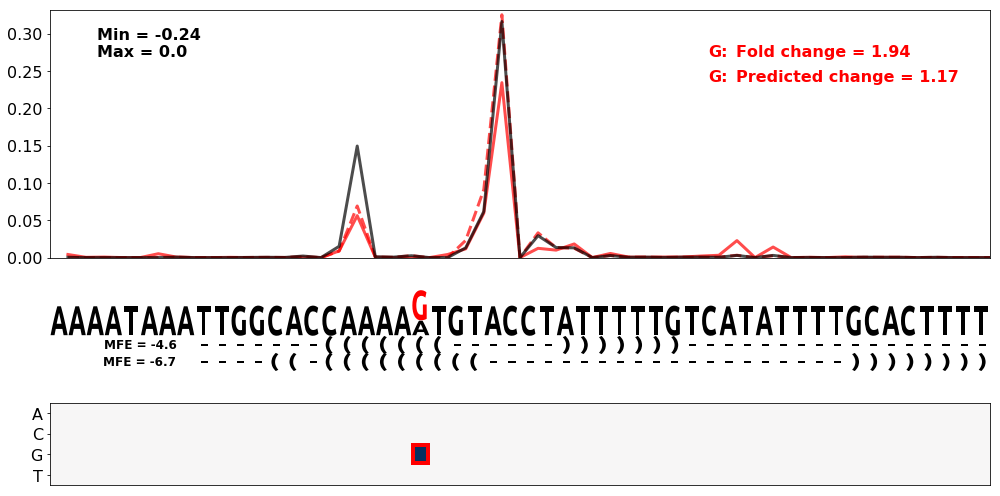

Gene = TGFBR2.3
SNV pos = 68
SNV nt = G
ClinVar id = Missing


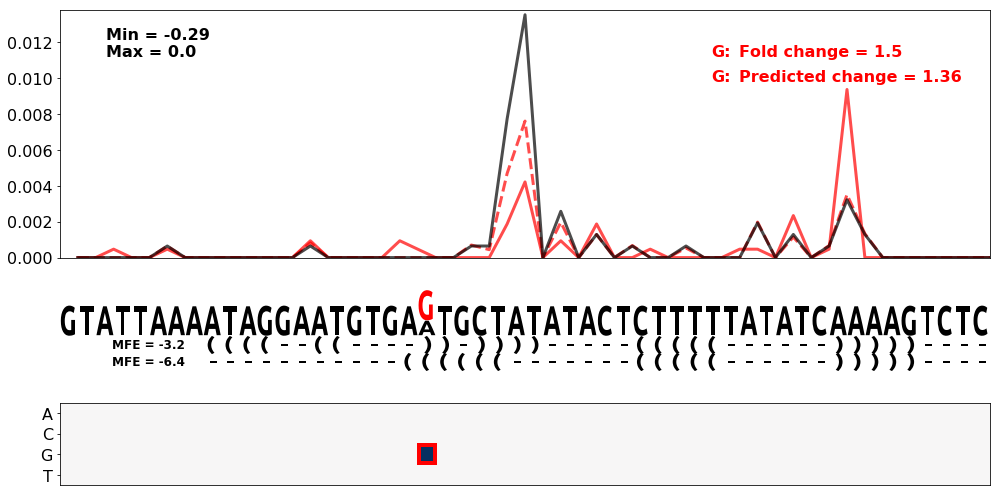

In [20]:
print('Folding alteration variants:')

experiment_name = 'folding'

gene_names = [
    'MLH1.2',
    'ARSA.3',
    'TP53.3',
    'PTEN.16',
    'NF2.3',
    'LDLR.4',
    'PEX5.3',
    'BRCA1.1',
    'TP53.3',
    'FRA10AC1.1',
    'TGFBR2.3'
]

snv_list = [
    [(69, 'A', 'red')],
    [(83, 'G', 'red')],
    [(76, 'G', 'red')],
    [(107, 'G', 'red')],
    [(97, 'G', 'red')],
    [(66, 'G', 'red')],
    [(74, 'C', 'red')],
    [(72, 'A', 'red')],
    [(65, 'A', 'red')],
    [(68, 'G', 'red')],
    [(68, 'G', 'red')]
]

wt_seq_list = [
    None,
    None,
    'CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG',
    None,
    None,
    None,
    None,
    None,
    'CCTCCTTCTCCCTTTTTATATCCCATTTTTATATCGATCTCTTATTTTACAATAAAACTTTGCTGCCACCTGTGTGTCTGAGGGGTGAACGCCAGTGCAGGCTACTGGGGTCAGCAGGTGCAGGGGTGAGTGAGGAGGTGCTGGGAAGCAGCCACCTGAGTCTG',
    None,
    None
]

seq_start = 48
seq_end = 100

save_figs = False

df_to_use = var_df_foldchange.set_index('master_seq')#df_var_no_pas.set_index('master_seq')

for gene_name, snvs, specific_seq in zip(gene_names, snv_list, wt_seq_list) :
    df_sel = df_to_use
    if specific_seq is not None :
        df_sel = df_to_use.query("wt_seq == '" + specific_seq + "'")

    print('Gene = ' + gene_name)
    if specific_seq is not None :
        print('WT seq = ' + specific_seq)
    print('SNV pos = ' + str(snvs[0][0]))
    print('SNV nt = ' + str(snvs[0][1]))
    print('ClinVar id = ' + str(df_sel.loc[df_sel.index.str.slice(snvs[0][0], snvs[0][0]+1) == snvs[0][1]].query("gene == '" + gene_name + "' and snv_pos == " + str(snvs[0][0]))['clinvar_id'].values[0]))
    
    struct_var = df_sel.loc[df_sel.index.str.slice(snvs[0][0], snvs[0][0]+1) == snvs[0][1]].query("gene == '" + gene_name + "' and snv_pos == " + str(snvs[0][0]))['struct_var'].values[0]
    struct_ref = df_sel.loc[df_sel.index.str.slice(snvs[0][0], snvs[0][0]+1) == snvs[0][1]].query("gene == '" + gene_name + "' and snv_pos == " + str(snvs[0][0]))['struct_wt'].values[0]
    struct_var = ('X' * 56) + struct_var + ('X' * 100)
    struct_ref = ('X' * 56) + struct_ref + ('X' * 100)
    
    mfe_var = df_sel.loc[df_sel.index.str.slice(snvs[0][0], snvs[0][0]+1) == snvs[0][1]].query("gene == '" + gene_name + "' and snv_pos == " + str(snvs[0][0]))['mfe_var'].values[0]
    mfe_ref = df_sel.loc[df_sel.index.str.slice(snvs[0][0], snvs[0][0]+1) == snvs[0][1]].query("gene == '" + gene_name + "' and snv_pos == " + str(snvs[0][0]))['mfe_wt'].values[0]
    delta_mfe = df_sel.loc[df_sel.index.str.slice(snvs[0][0], snvs[0][0]+1) == snvs[0][1]].query("gene == '" + gene_name + "' and snv_pos == " + str(snvs[0][0]))['delta_mfe'].values[0]
    
    fig_name = None
    if save_figs :
        fig_name = experiment_name + '_' + gene_name + '_' + str(snvs[0][0]) + '_' + str(snvs[0][1]) + '_Both'
    mut_map_with_cuts_and_fold(
            df_sel,
            gene_name,
            mfe_ref,
            mfe_var,
            struct_ref,
            struct_var,
            snvs,
            mode='true',
            column_suffix='',
            figsize=(14, 7),
            height_ratios=[6, 2, 2],
            bg_alpha=0.999,
            plot_simple_mutmap=True,
            annotate_folds=True,
            plot_true_cuts=True,
            plot_pred_cuts=True,
            scale_pred_cuts=True,
            fold_change_from_cut_range=[60, 100],
            ref_var_scales=[0.5, 1.0],
            border_eta = 0.06,
            seq_trim_start=seq_start, seq_trim_end=seq_end,
            plot_start=0, plot_end=seq_end-seq_start,
            plot_as_bars=False,
            pas_downscaling=0.5,
            fig_name=fig_name,
            fig_dpi=150
    )

<h2>TGTA analysis</h2>

<h2>Single and Double TGTA (No WT TGTA)</h2>

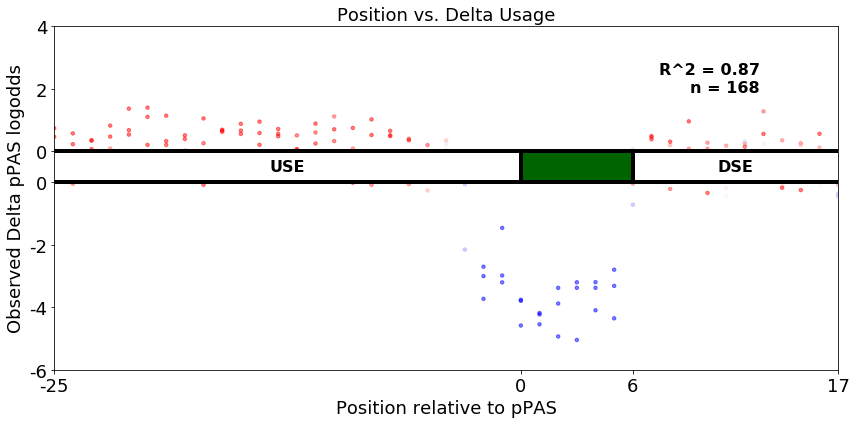

Mean:


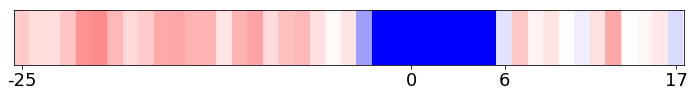

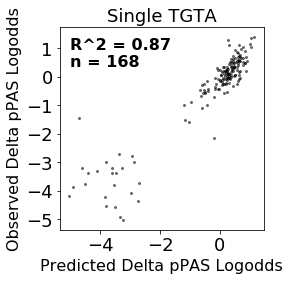

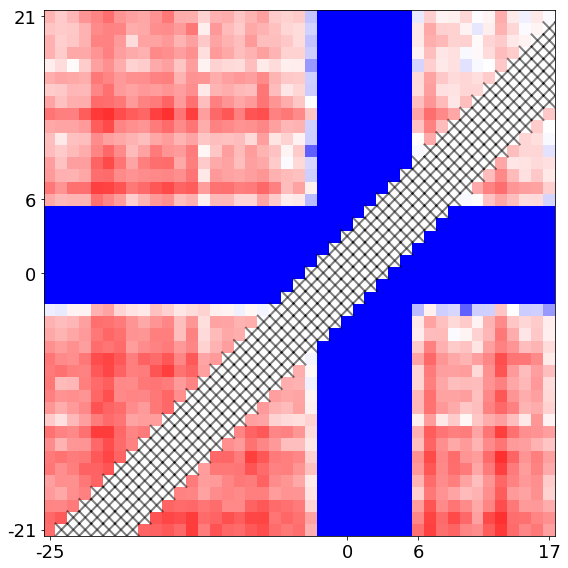

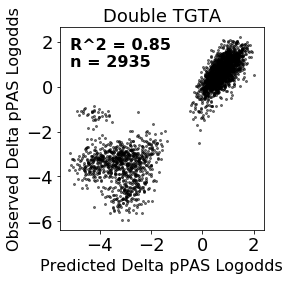

Individual wildtype sequences:
TGTA maps for sequence 0


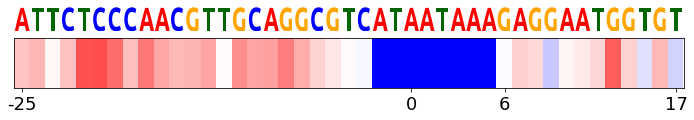

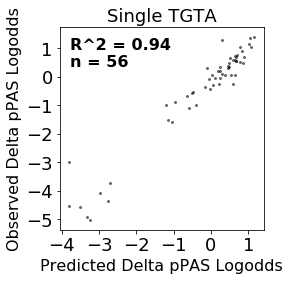

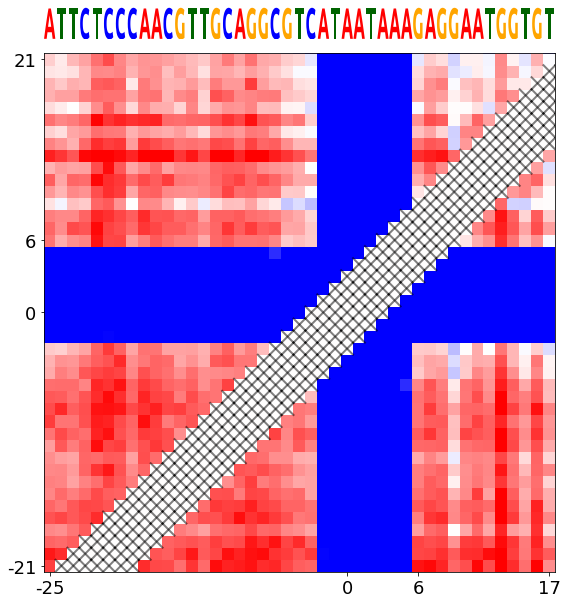

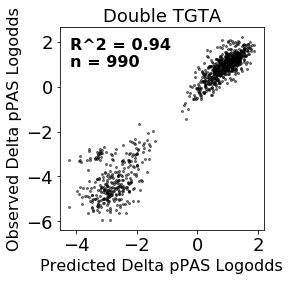

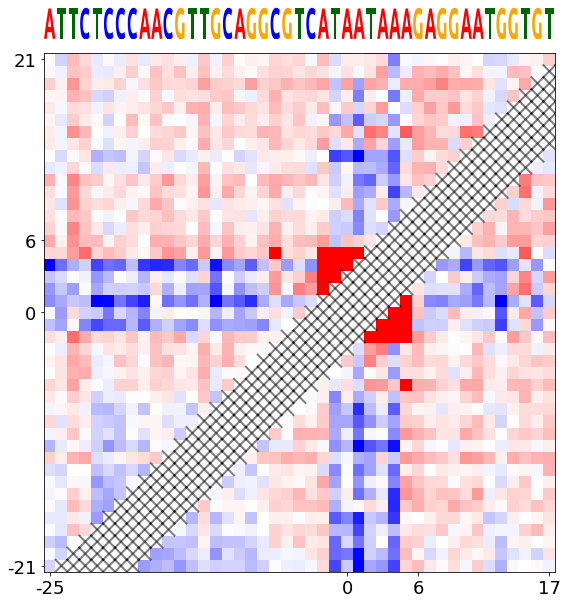

TGTA maps for sequence 1


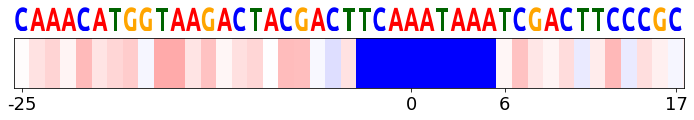

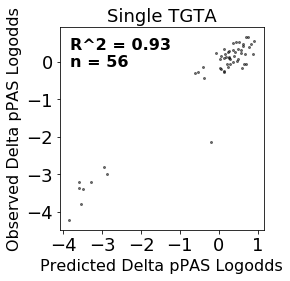

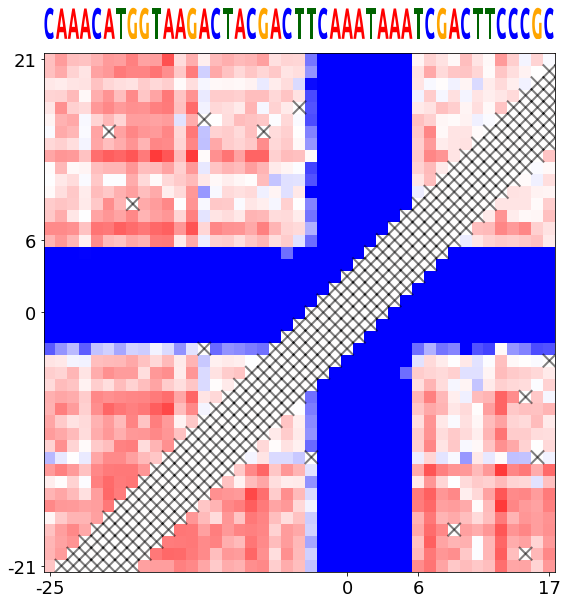

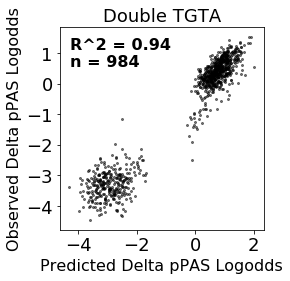

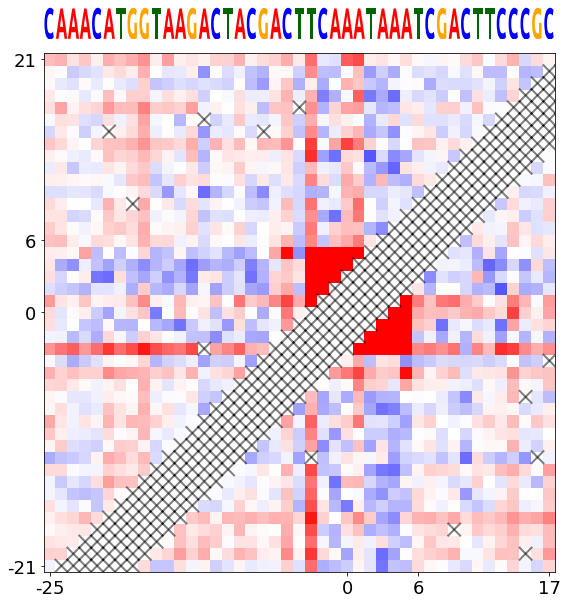

TGTA maps for sequence 2


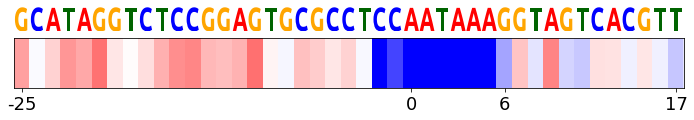

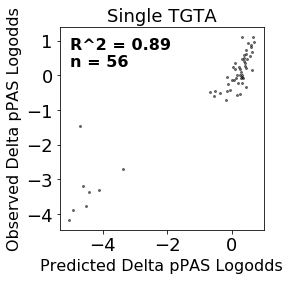

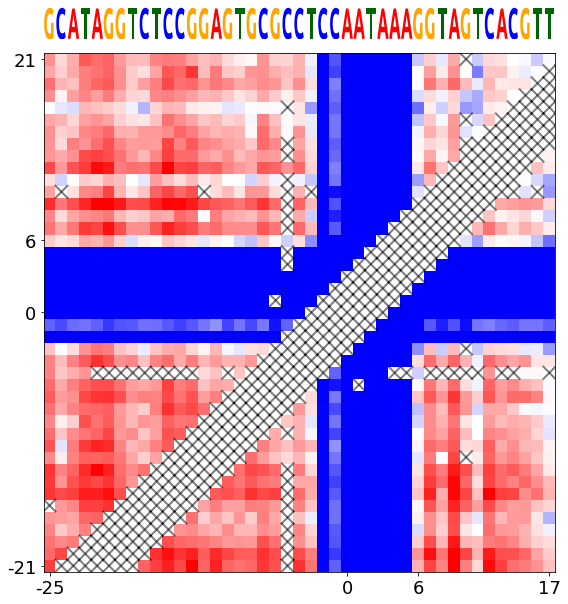

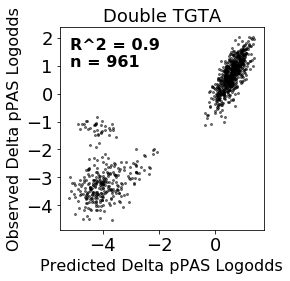

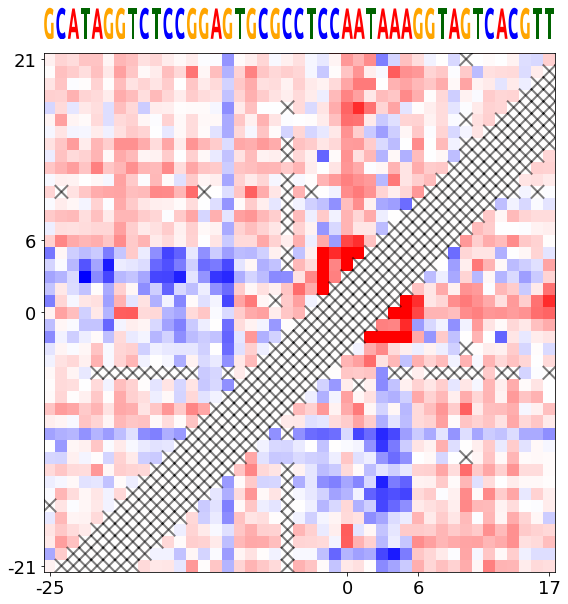

In [36]:
#TGTA variant analysis

df_to_use = variant_df_filtered.copy().set_index('master_seq')
df_to_use['delta_logodds_pred'] = df_to_use['mean_delta_logodds_pred']

tgta_1_df = df_to_use.query("experiment == 'tgta' and subexperiment == 'n=1' and tgta_fixed == False")
tgta_2_df = df_to_use.query("experiment == 'tgta' and subexperiment == 'n=2' and tgta_fixed == False")

plot_start = 25#None
plot_end = 67 + 1#None

scatter_pos_start = plot_start
if scatter_pos_start is None :
    scatter_pos_start = 0
scatter_pos_end = plot_end
if scatter_pos_end is None :
    scatter_pos_end = 151
plot_position_delta_scatter(tgta_1_df, min_pred_filter=0.0, figsize=(12, 6), fig_name=None, plot_start=scatter_pos_start-50, plot_end=scatter_pos_end-50-1, fig_dpi=300, annotate=None, snv_pos_column='tgta_pos_1')

print('Mean:')

plot_individual_tgta_map('mean', tgta_1_df, tgta_2_df, plot_start=plot_start, plot_end=plot_end, vmin=-2, vmax=2, interpolate_missing=False, plot_symmetric_doubles=True)

print('Individual wildtype sequences:')

wt_seqs = tgta_1_df['wt_seq'].unique()
for i, wt_seq in enumerate(wt_seqs) :
    print('TGTA maps for sequence ' + str(i))
    plot_individual_tgta_map(wt_seq, tgta_1_df, tgta_2_df, plot_start=plot_start, plot_end=plot_end, vmin=-2, vmax=2, interpolate_missing=False, plot_symmetric_doubles=True)
    plot_individual_tgta_map_nonlin(wt_seq, tgta_1_df, tgta_2_df, plot_start=plot_start, plot_end=plot_end, vmin=-2, vmax=2, interpolate_missing=False, plot_symmetric_doubles=True)

<h2>Single and Double TGTA (With WT TGTA upstream of CSE hexamer)</h2>

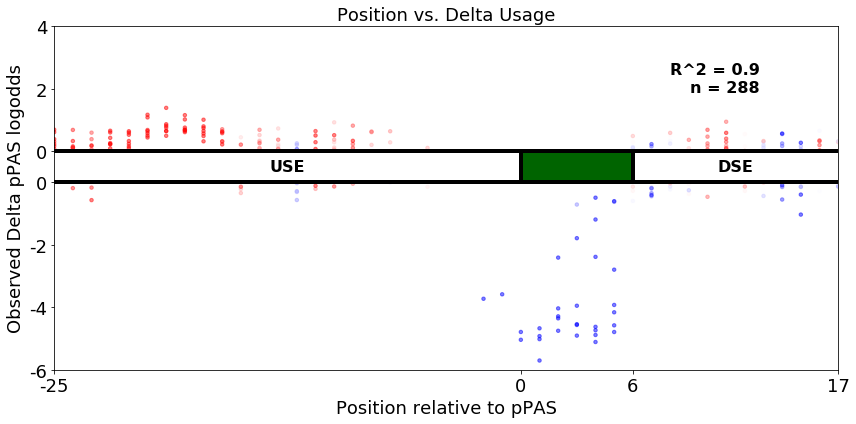

Mean:


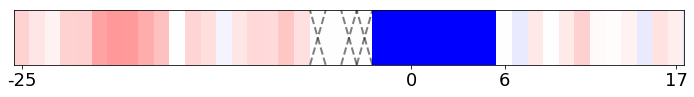

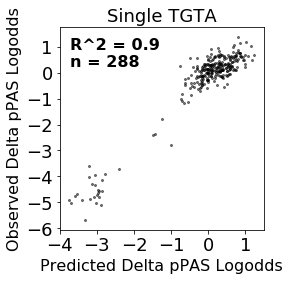

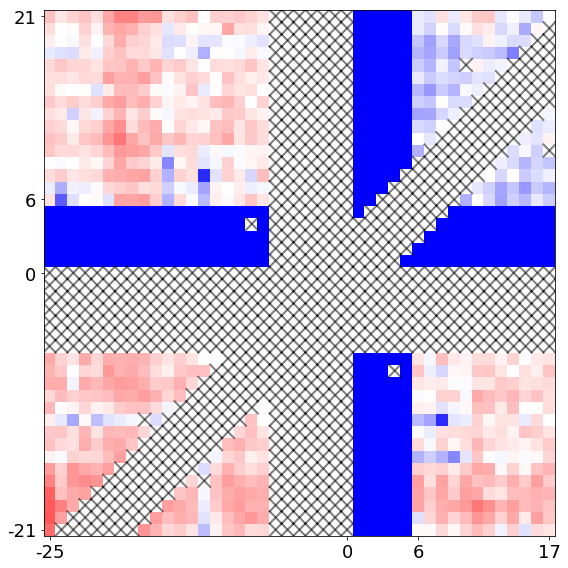

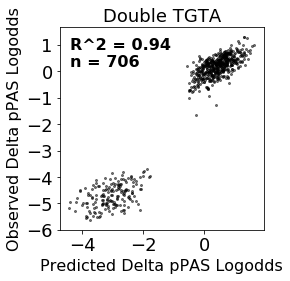

Individual wildtype sequences:
TGTA maps for sequence 0


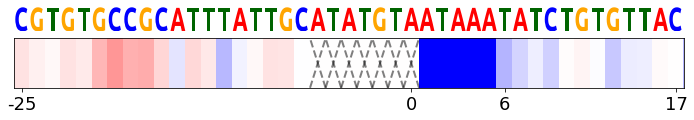

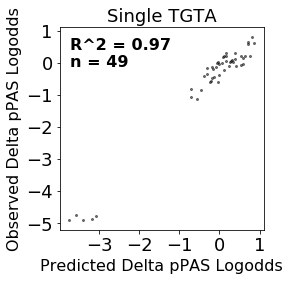

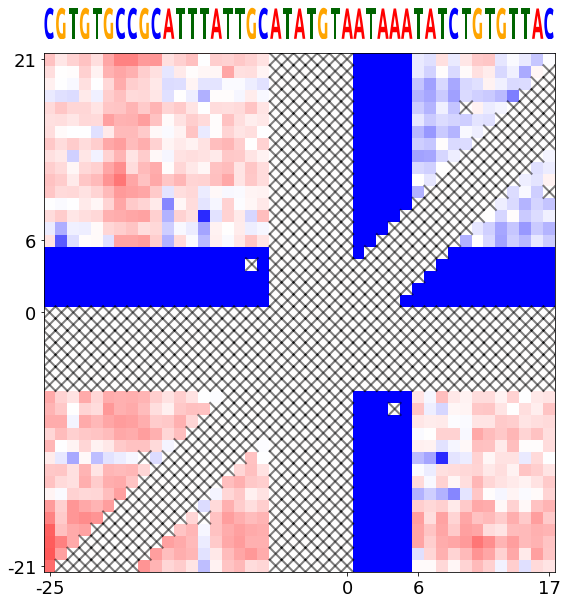

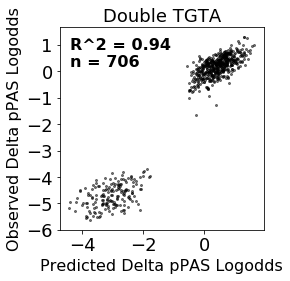

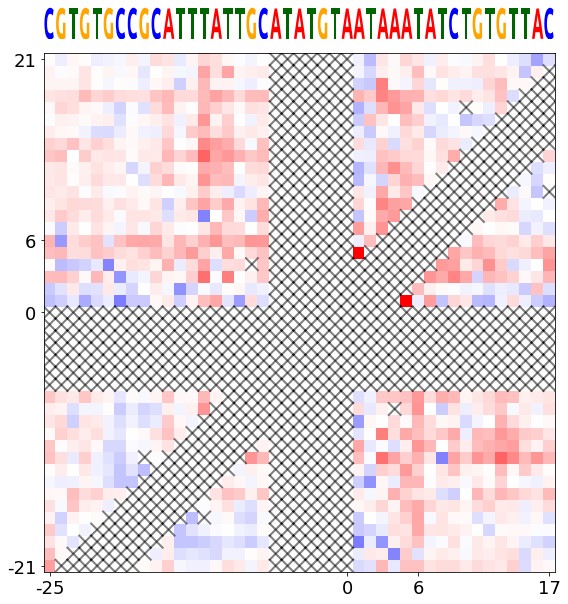

TGTA maps for sequence 1


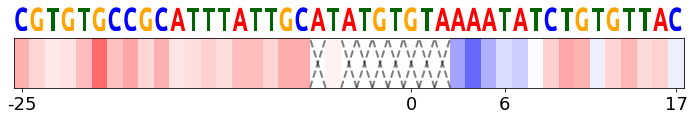

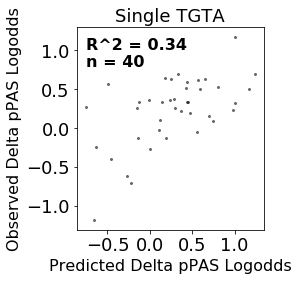

TGTA maps for sequence 2


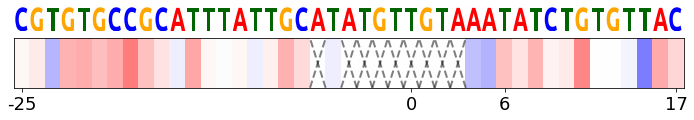

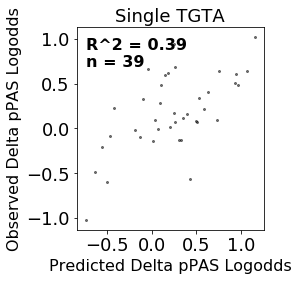

TGTA maps for sequence 3


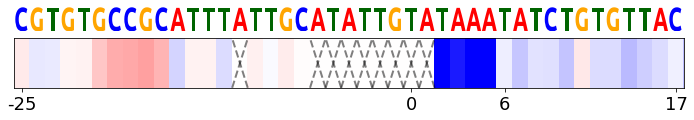

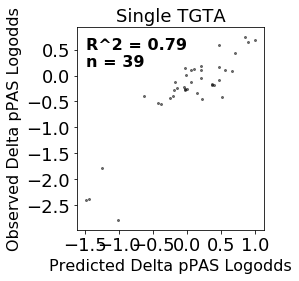

TGTA maps for sequence 4


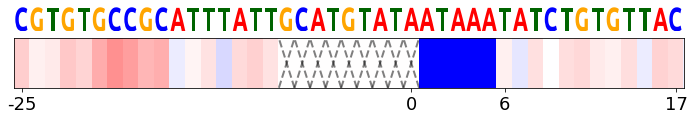

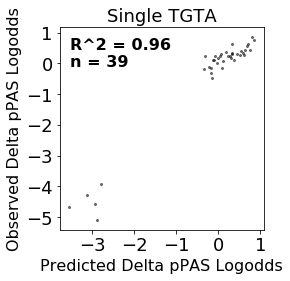

TGTA maps for sequence 5


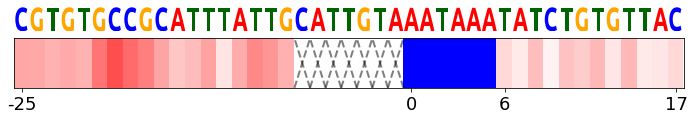

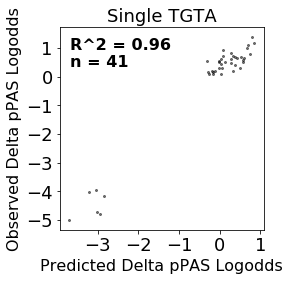

TGTA maps for sequence 6


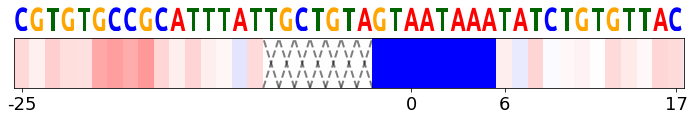

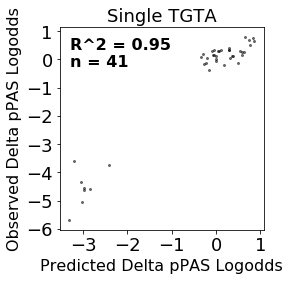

In [37]:
#TGTA variant analysis (1 fixed TGTA element upstream of CSE hexamer)

df_to_use = variant_df_filtered.copy().set_index('master_seq')
df_to_use['delta_logodds_pred'] = df_to_use['mean_delta_logodds_pred']

tgta_1_df = df_to_use.query("experiment == 'tgta' and subexperiment == 'n=2' and tgta_fixed == True")
tgta_2_df = df_to_use.query("experiment == 'tgta' and subexperiment == 'n=3' and tgta_fixed == True")

plot_start = 25#None
plot_end = 67 + 1#None

scatter_pos_start = plot_start
if scatter_pos_start is None :
    scatter_pos_start = 0
scatter_pos_end = plot_end
if scatter_pos_end is None :
    scatter_pos_end = 151
plot_position_delta_scatter(tgta_1_df, min_pred_filter=0.0, figsize=(12, 6), fig_name=None, plot_start=scatter_pos_start-50, plot_end=scatter_pos_end-50-1, fig_dpi=300, annotate=None, snv_pos_column='tgta_pos_1')

print('Mean:')

plot_individual_tgta_map('mean', tgta_1_df, tgta_2_df, plot_start=plot_start, plot_end=plot_end, vmin=-2, vmax=2, interpolate_missing=False, plot_symmetric_doubles=True)

print('Individual wildtype sequences:')

wt_seqs = tgta_1_df['wt_seq'].unique()
for i, wt_seq in enumerate(wt_seqs) :
    print('TGTA maps for sequence ' + str(i))
    plot_individual_tgta_map(wt_seq, tgta_1_df, tgta_2_df, plot_start=plot_start, plot_end=plot_end, vmin=-2, vmax=2, interpolate_missing=False, plot_symmetric_doubles=True)
    plot_individual_tgta_map_nonlin(wt_seq, tgta_1_df, tgta_2_df, plot_start=plot_start, plot_end=plot_end, vmin=-2, vmax=2, interpolate_missing=False, plot_symmetric_doubles=True)

<h2>Store final table of measured and predicted human APA variants</h2>

In [58]:

df_all_snvs = human_variant_df.query("variant == 'snv'").copy().reset_index(drop=False).sort_values(by='delta_logodds_true', ascending=False)

df_all_snvs = df_all_snvs[[
    'gene',
    'clinvar_id',
    'significance',
    'in_acmg',
    'sitetype',
    'wt_seq',
    'master_seq',
    'snv_pos',
    'delta_logodds_true',
    'delta_logodds_pred',
    'delta_p_val'
]]

df_clinvar_snvs = df_all_snvs.query("significance != 'Missing'")

df_all_snvs.to_csv('predictions/apa_variant_mpra_all_snvs.csv', sep='\t', index=False)
df_clinvar_snvs.to_csv('predictions/apa_variant_mpra_clinvar_snvs.csv', sep='\t', index=False)
